In [1]:
import numpy as np
import matplotlib.pyplot as plt
import time as tm
import uproot
#%matplotlib widget

    # tic-toc functions for timing
def tic():
    # Initialize clock for timing
    global startTime_for_tictoc
    startTime_for_tictoc = tm.perf_counter_ns()
    return

def toc():
    # report time since last tic() initialization in seconds
    if 'startTime_for_tictoc' in globals():
        global most_recent_toc
        if most_recent_toc > startTime_for_tictoc: print("Toc Warning: Tic not reset.",end="  ")
        most_recent_toc = tm.perf_counter_ns()
        print (f"Elapsed time is {(tm.perf_counter_ns() - startTime_for_tictoc)*1e-9:.3f} seconds.")
    else:
        print ("Toc Error: start time not set")
    return

def tocms():
    # report time since last tic() initialization in ms
    if 'startTime_for_tictoc' in globals():
        global most_recent_toc
        if most_recent_toc > startTime_for_tictoc: print("Toc Warning: Tic not reset.",end="  ")
        most_recent_toc = tm.perf_counter_ns()
        print (f"Elapsed time is {(tm.perf_counter_ns() - startTime_for_tictoc)*1e-6:.3f} milliseconds.")
    else:
        print ("Toc Error: start time not set")
    return
global most_recent_toc
most_recent_toc = -666


## LAr check

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


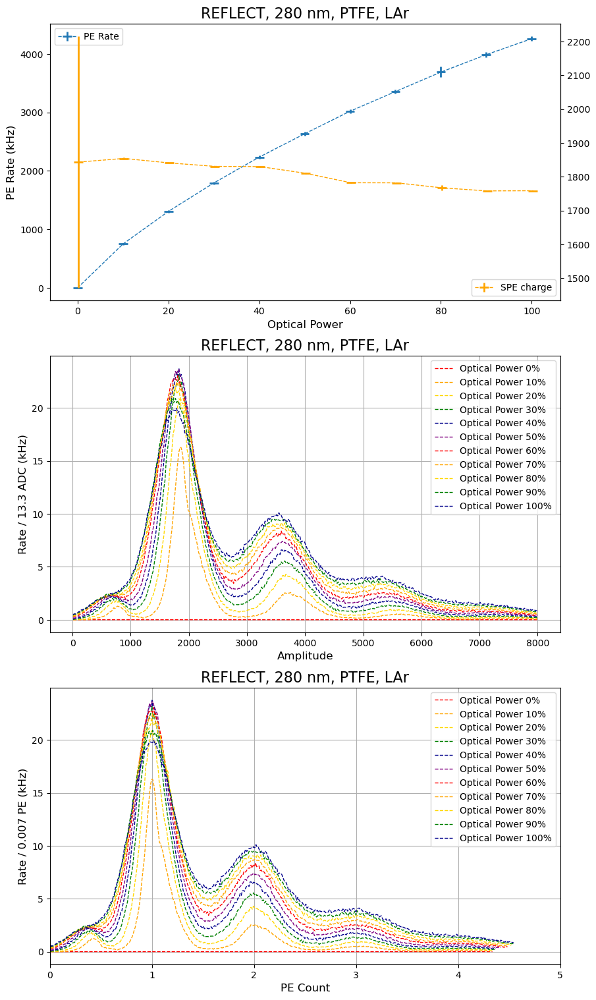

In [24]:
tic()
inputfile=np.load("../../REFLECT/runLAr.0/runLAr.0_results_LAr_280_empty.npz", allow_pickle=True)
material = "PTFE"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_LAr_empty_280 = result_dict['optical_power']
labels_run0_LAr_empty_280 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_LAr_empty_280]
SPE_charge_run0_LAr_empty_280 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_LAr_empty_280 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_LAr_empty_280 = result_dict['PE_rate']
PE_rate_uncertainty_run0_LAr_empty_280 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_LAr_empty_280 = result_dict['finger_plot_amplitude']
finger_plot_run0_LAr_empty_280 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_LAr_empty_280"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 280 nm, {material}, LAr", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 280 nm, {material}, LAr", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 280 nm, {material}, LAr", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_LAr_empty_280)):
        optical_power_sorted[graphnum] = optical_power_run0_LAr_empty_280[np.argmin( abs(optical_power_run0_LAr_empty_280-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_LAr_empty_280[np.argmin( abs(optical_power_run0_LAr_empty_280-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_LAr_empty_280[np.argmin( abs(optical_power_run0_LAr_empty_280-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_LAr_empty_280[np.argmin( abs(optical_power_run0_LAr_empty_280-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_LAr_empty_280[np.argmin( abs(optical_power_run0_LAr_empty_280-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_LAr_empty_280, finger_plot_run0_LAr_empty_280[np.argmin( abs(optical_power_run0_LAr_empty_280-graphnum*10) )], #yerr=DarkLArData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_LAr_empty_280[np.argmin( abs(optical_power_run0_LAr_empty_280-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_LAr_empty_280/SPE_charge_sorted[graphnum], finger_plot_run0_LAr_empty_280[np.argmin( abs(optical_power_run0_LAr_empty_280-graphnum*10) )], #yerr=DarkLArData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_LAr_empty_280[np.argmin( abs(optical_power_run0_LAr_empty_280-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    #ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_LAr_empty_280 = 1*optical_power_sorted
SPE_charge_run0_LAr_empty_280 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_LAr_empty_280 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_LAr_empty_280 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_LAr_empty_280 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_LAr_empty_280, PE_rate_run0_LAr_empty_280, xerr=[1]*len(optical_power_run0_LAr_empty_280), yerr=PE_rate_uncertainty_run0_LAr_empty_280*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_LAr_empty_280+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_LAr_empty_280), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


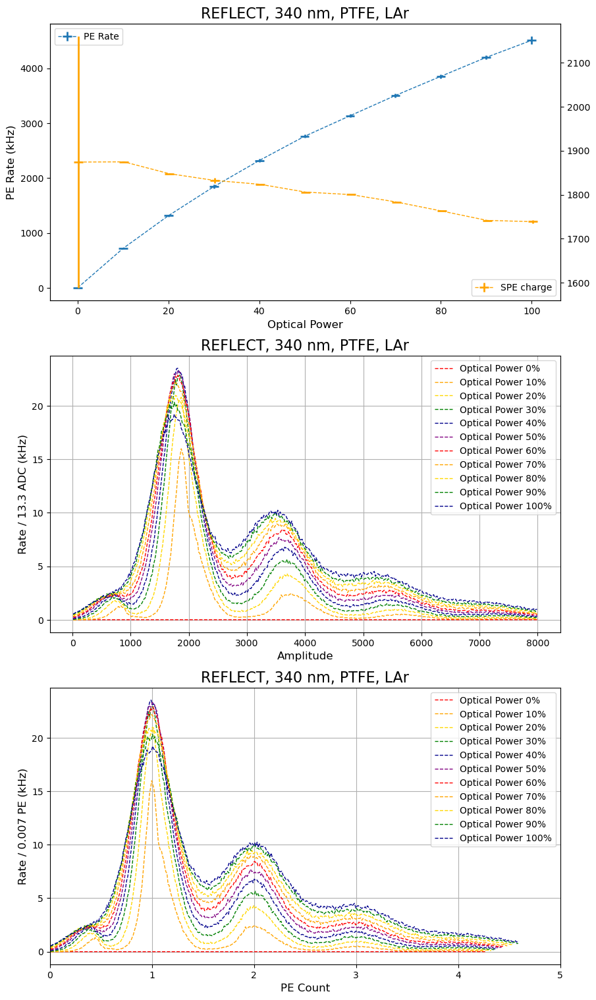

In [25]:
tic()
inputfile=np.load("../../REFLECT/runLAr.0/runLAr.0_results_LAr_340_empty.npz", allow_pickle=True)
material = "PTFE"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_LAr_empty_340 = result_dict['optical_power']
labels_run0_LAr_empty_340 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_LAr_empty_340]
SPE_charge_run0_LAr_empty_340 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_LAr_empty_340 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_LAr_empty_340 = result_dict['PE_rate']
PE_rate_uncertainty_run0_LAr_empty_340 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_LAr_empty_340 = result_dict['finger_plot_amplitude']
finger_plot_run0_LAr_empty_340 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_LAr_empty_340"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 340 nm, {material}, LAr", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 340 nm, {material}, LAr", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 340 nm, {material}, LAr", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_LAr_empty_340)):
        optical_power_sorted[graphnum] = optical_power_run0_LAr_empty_340[np.argmin( abs(optical_power_run0_LAr_empty_340-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_LAr_empty_340[np.argmin( abs(optical_power_run0_LAr_empty_340-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_LAr_empty_340[np.argmin( abs(optical_power_run0_LAr_empty_340-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_LAr_empty_340[np.argmin( abs(optical_power_run0_LAr_empty_340-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_LAr_empty_340[np.argmin( abs(optical_power_run0_LAr_empty_340-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_LAr_empty_340, finger_plot_run0_LAr_empty_340[np.argmin( abs(optical_power_run0_LAr_empty_340-graphnum*10) )], #yerr=DarkLArData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_LAr_empty_340[np.argmin( abs(optical_power_run0_LAr_empty_340-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_LAr_empty_340/SPE_charge_sorted[graphnum], finger_plot_run0_LAr_empty_340[np.argmin( abs(optical_power_run0_LAr_empty_340-graphnum*10) )], #yerr=DarkLArData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_LAr_empty_340[np.argmin( abs(optical_power_run0_LAr_empty_340-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    #ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_LAr_empty_340 = 1*optical_power_sorted
SPE_charge_run0_LAr_empty_340 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_LAr_empty_340 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_LAr_empty_340 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_LAr_empty_340 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_LAr_empty_340, PE_rate_run0_LAr_empty_340, xerr=[1]*len(optical_power_run0_LAr_empty_340), yerr=PE_rate_uncertainty_run0_LAr_empty_340*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_LAr_empty_340+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_LAr_empty_340), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


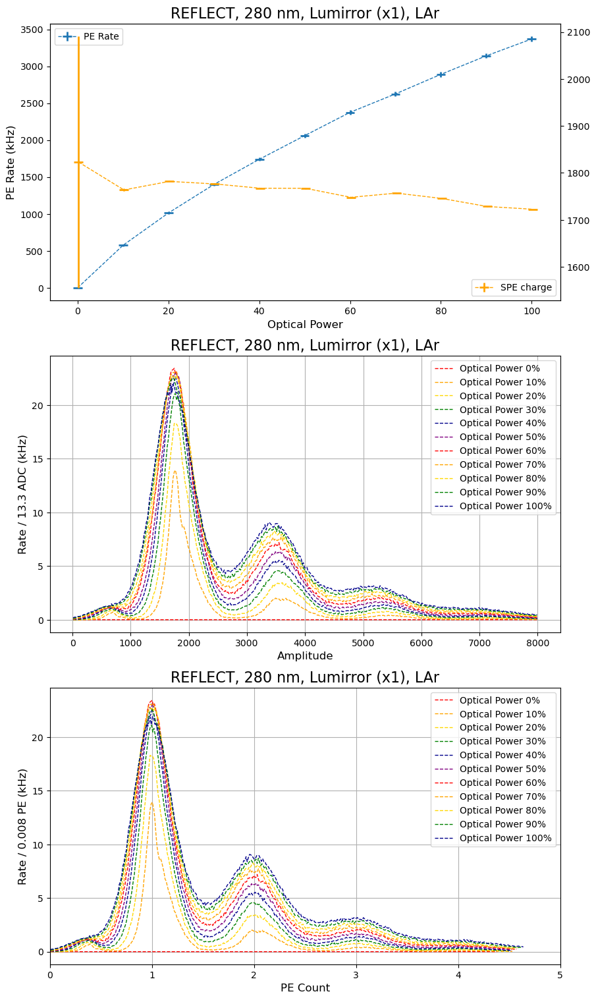

In [26]:
tic()
inputfile=np.load("../../REFLECT/runLAr.0/runLAr.0_results_LAr_280_lum1.npz", allow_pickle=True)
material = "Lumirror (x1)"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_LAr_lum1_280 = result_dict['optical_power']
labels_run0_LAr_lum1_280 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_LAr_lum1_280]
SPE_charge_run0_LAr_lum1_280 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_LAr_lum1_280 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_LAr_lum1_280 = result_dict['PE_rate']
PE_rate_uncertainty_run0_LAr_lum1_280 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_LAr_lum1_280 = result_dict['finger_plot_amplitude']
finger_plot_run0_LAr_lum1_280 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_LAr_lum1_280"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 280 nm, {material}, LAr", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 280 nm, {material}, LAr", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 280 nm, {material}, LAr", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_LAr_lum1_280)):
        optical_power_sorted[graphnum] = optical_power_run0_LAr_lum1_280[np.argmin( abs(optical_power_run0_LAr_lum1_280-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_LAr_lum1_280[np.argmin( abs(optical_power_run0_LAr_lum1_280-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_LAr_lum1_280[np.argmin( abs(optical_power_run0_LAr_lum1_280-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_LAr_lum1_280[np.argmin( abs(optical_power_run0_LAr_lum1_280-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_LAr_lum1_280[np.argmin( abs(optical_power_run0_LAr_lum1_280-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_LAr_lum1_280, finger_plot_run0_LAr_lum1_280[np.argmin( abs(optical_power_run0_LAr_lum1_280-graphnum*10) )], #yerr=DarkLArData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_LAr_lum1_280[np.argmin( abs(optical_power_run0_LAr_lum1_280-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_LAr_lum1_280/SPE_charge_sorted[graphnum], finger_plot_run0_LAr_lum1_280[np.argmin( abs(optical_power_run0_LAr_lum1_280-graphnum*10) )], #yerr=DarkLArData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_LAr_lum1_280[np.argmin( abs(optical_power_run0_LAr_lum1_280-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    #ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_LAr_lum1_280 = 1*optical_power_sorted
SPE_charge_run0_LAr_lum1_280 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_LAr_lum1_280 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_LAr_lum1_280 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_LAr_lum1_280 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_LAr_lum1_280, PE_rate_run0_LAr_lum1_280, xerr=[1]*len(optical_power_run0_LAr_lum1_280), yerr=PE_rate_uncertainty_run0_LAr_lum1_280*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_LAr_lum1_280+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_LAr_lum1_280), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


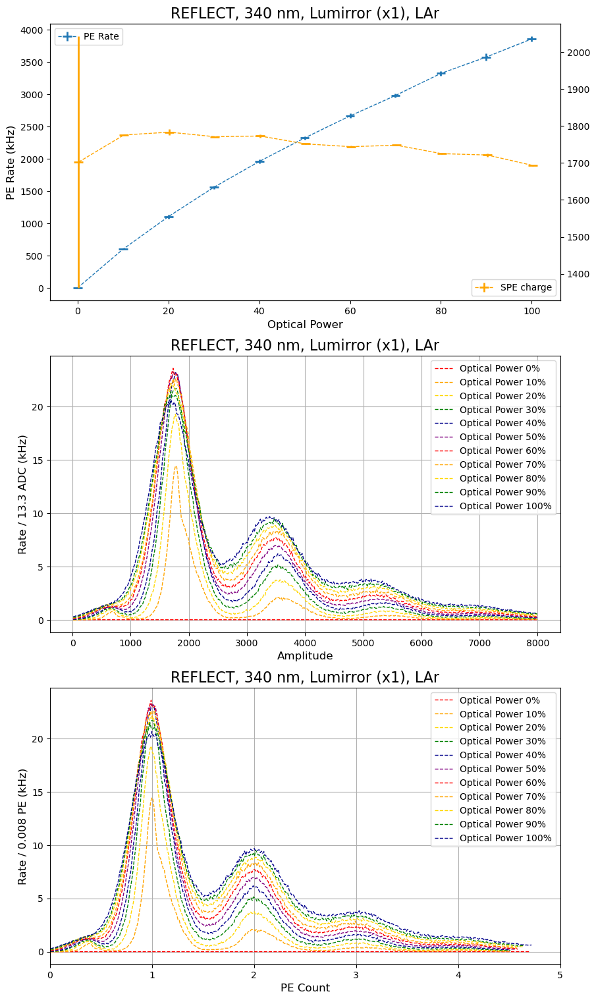

In [27]:
tic()
inputfile=np.load("../../REFLECT/runLAr.0/runLAr.0_results_LAr_340_lum1.npz", allow_pickle=True)
material = "Lumirror (x1)"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_LAr_lum1_340 = result_dict['optical_power']
labels_run0_LAr_lum1_340 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_LAr_lum1_340]
SPE_charge_run0_LAr_lum1_340 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_LAr_lum1_340 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_LAr_lum1_340 = result_dict['PE_rate']
PE_rate_uncertainty_run0_LAr_lum1_340 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_LAr_lum1_340 = result_dict['finger_plot_amplitude']
finger_plot_run0_LAr_lum1_340 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_LAr_lum1_340"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 340 nm, {material}, LAr", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 340 nm, {material}, LAr", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 340 nm, {material}, LAr", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_LAr_lum1_340)):
        optical_power_sorted[graphnum] = optical_power_run0_LAr_lum1_340[np.argmin( abs(optical_power_run0_LAr_lum1_340-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_LAr_lum1_340[np.argmin( abs(optical_power_run0_LAr_lum1_340-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_LAr_lum1_340[np.argmin( abs(optical_power_run0_LAr_lum1_340-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_LAr_lum1_340[np.argmin( abs(optical_power_run0_LAr_lum1_340-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_LAr_lum1_340[np.argmin( abs(optical_power_run0_LAr_lum1_340-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_LAr_lum1_340, finger_plot_run0_LAr_lum1_340[np.argmin( abs(optical_power_run0_LAr_lum1_340-graphnum*10) )], #yerr=DarkLArData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_LAr_lum1_340[np.argmin( abs(optical_power_run0_LAr_lum1_340-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_LAr_lum1_340/SPE_charge_sorted[graphnum], finger_plot_run0_LAr_lum1_340[np.argmin( abs(optical_power_run0_LAr_lum1_340-graphnum*10) )], #yerr=DarkLArData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_LAr_lum1_340[np.argmin( abs(optical_power_run0_LAr_lum1_340-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    #ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_LAr_lum1_340 = 1*optical_power_sorted
SPE_charge_run0_LAr_lum1_340 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_LAr_lum1_340 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_LAr_lum1_340 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_LAr_lum1_340 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_LAr_lum1_340, PE_rate_run0_LAr_lum1_340, xerr=[1]*len(optical_power_run0_LAr_lum1_340), yerr=PE_rate_uncertainty_run0_LAr_lum1_340*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_LAr_lum1_340+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_LAr_lum1_340), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

## Run LAr.0

### Run 2 Results

NameError: name 'optical_power_run0_warm_empty_280' is not defined

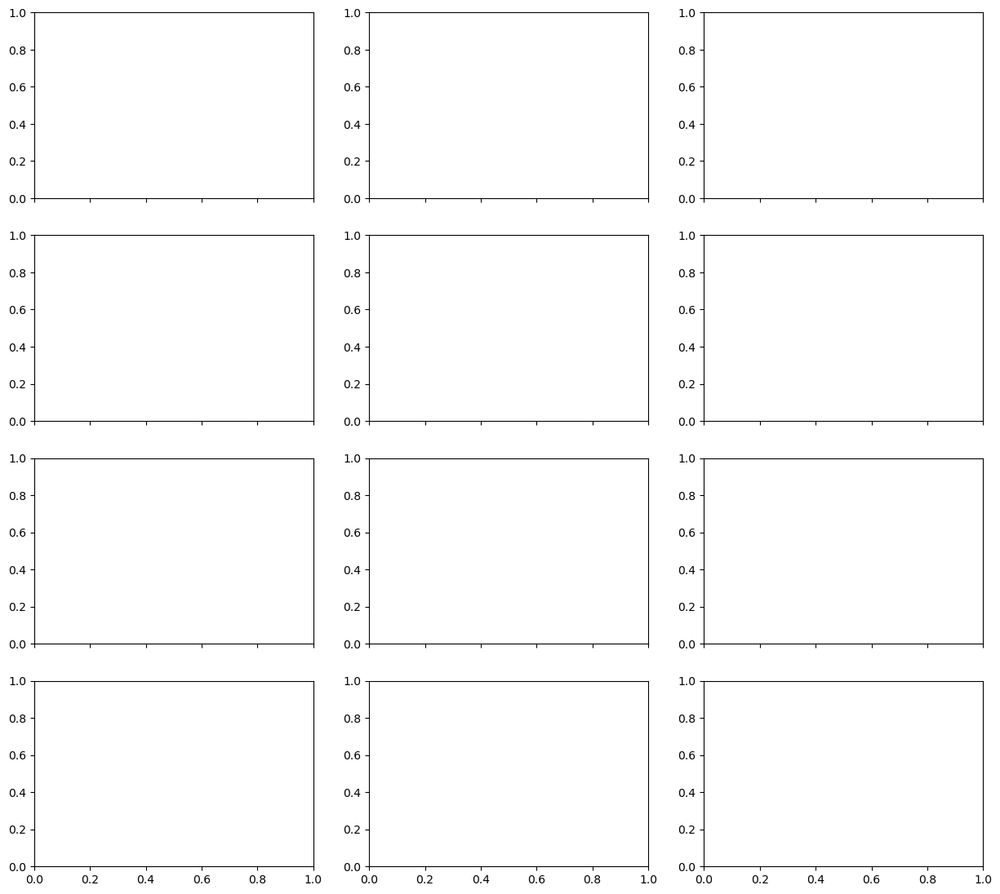

In [3]:
plt.close()
width = 15
fig,ax = plt.subplots(4,3,figsize=(width,4.4/3*width/((1+np.sqrt(5))/2)), sharex='col')

wavelengths = [280,340,395,470]
temps = ["Room Temp","N2 Gas (77-115K)", "LN2"]

#fig.title("REFLECT Sample Tests")


myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]

xshift = 0.5
### 280
#warm
ax[0,0].errorbar(optical_power_run0_warm_empty_280-0*xshift, PE_rate_run0_warm_empty_280, yerr=np.where(PE_rate_uncertainty_run0_warm_empty_280>0,PE_rate_uncertainty_run0_warm_empty_280,0),
            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")
#ax[0,0].errorbar(optical_power_21_warm_empty_280-0*xshift, PE_rate_21_warm_empty_280, yerr=np.where(PE_rate_uncertainty_21_warm_empty_280>0,PE_rate_uncertainty_21_warm_empty_280,0),
#            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")
#ax[0,0].errorbar(optical_power_run0_warm_black_280-0*xshift, PE_rate_run0_warm_black_280, yerr=np.where(PE_rate_uncertainty_run0_warm_black_280>0,PE_rate_uncertainty_run0_warm_black_280,0),
#            fmt='--', linewidth=1, elinewidth=2, label="Absorber", color="Black")
#ax[0,0].errorbar(optical_power_run0_warm_lum1_280-0*xshift, PE_rate_run0_warm_lum1_280, yerr=np.where(PE_rate_uncertainty_run0_warm_lum1_280>0,PE_rate_uncertainty_run0_warm_lum1_280,0),
#            fmt='--', linewidth=1, elinewidth=2, label="Lumirror (x1)", color="orange")
#ax[0,0].errorbar(optical_power_run0_warm_lum2_280-0*xshift, PE_rate_run0_warm_lum2_280, yerr=np.where(PE_rate_uncertainty_run0_warm_lum2_280>0,PE_rate_uncertainty_run0_warm_lum2_280,0),
#            fmt='--', linewidth=1, elinewidth=2, label="Lumirror (x2)", color="yellow")
#ax[0,0].errorbar(optical_power_run0_warm_esr1_280-0*xshift, PE_rate_run0_warm_esr1_280, yerr=np.where(PE_rate_uncertainty_run0_warm_esr1_280>0,PE_rate_uncertainty_run0_warm_esr1_280,0),
#            fmt='--', linewidth=1, elinewidth=2, label="ESR (x1)", color="Green")
#ax[0,0].errorbar(optical_power_run0_warm_esr2_280-0*xshift, PE_rate_run0_warm_esr2_280, yerr=np.where(PE_rate_uncertainty_run0_warm_esr2_280>0,PE_rate_uncertainty_run0_warm_esr2_280,0),
#            fmt='--', linewidth=1, elinewidth=2, label="ESR (x2)", color="Lime")
#ax[0,0].errorbar(optical_power_run0_warm_tyv1_280-0*xshift, PE_rate_run0_warm_tyv1_280, yerr=np.where(PE_rate_uncertainty_run0_warm_tyv1_280>0,PE_rate_uncertainty_run0_warm_tyv1_280,0),
#            fmt='--', linewidth=1, elinewidth=2, label="Tyvek (x1)", color="darkviolet")
#ax[0,0].errorbar(optical_power_run0_warm_tyv2_280-0*xshift, PE_rate_run0_warm_tyv2_280, yerr=np.where(PE_rate_uncertainty_run0_warm_tyv2_280>0,PE_rate_uncertainty_run0_warm_tyv2_280,0),
#            fmt='--', linewidth=1, elinewidth=2, label="Tyvek (x2)", color="fuchsia")


#cold
#ax[0,1].errorbar(optical_power_run0_warm_empty_280-0*xshift, PE_rate_run0_warm_empty_280, yerr=np.where(PE_rate_uncertainty_run0_warm_empty_280>0,PE_rate_uncertainty_run0_warm_empty_280,0),
#            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")

#LN2
#ax[0,2].errorbar(optical_power_run0_warm_empty_280-0*xshift, PE_rate_run0_warm_empty_280, yerr=np.where(PE_rate_uncertainty_run0_warm_empty_280>0,PE_rate_uncertainty_run0_warm_empty_280,0),
#            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")

### 340
#warm
ax[1,0].errorbar(optical_power_run0_warm_empty_340-0*xshift, PE_rate_run0_warm_empty_340, yerr=np.where(PE_rate_uncertainty_run0_warm_empty_340>0,PE_rate_uncertainty_run0_warm_empty_340,0),
            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")
#ax[1,0].errorbar(optical_power_21_warm_empty_340-0*xshift, PE_rate_21_warm_empty_340, yerr=np.where(PE_rate_uncertainty_21_warm_empty_340>0,PE_rate_uncertainty_21_warm_empty_340,0),
#            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")
#ax[1,0].errorbar(optical_power_run0_warm_black_340-0*xshift, PE_rate_run0_warm_black_340, yerr=np.where(PE_rate_uncertainty_run0_warm_black_340>0,PE_rate_uncertainty_run0_warm_black_340,0),
#            fmt='--', linewidth=1, elinewidth=2, label="Absorber", color="Black")
#ax[1,0].errorbar(optical_power_run0_warm_lum1_340-0*xshift, PE_rate_run0_warm_lum1_340, yerr=np.where(PE_rate_uncertainty_run0_warm_lum1_340>0,PE_rate_uncertainty_run0_warm_lum1_340,0),
#            fmt='--', linewidth=1, elinewidth=2, label="Lumirror (x1)", color="orange")
#ax[1,0].errorbar(optical_power_run0_warm_lum2_340-0*xshift, PE_rate_run0_warm_lum2_340, yerr=np.where(PE_rate_uncertainty_run0_warm_lum2_340>0,PE_rate_uncertainty_run0_warm_lum2_340,0),
#            fmt='--', linewidth=1, elinewidth=2, label="Lumirror (x2)", color="yellow")
#ax[1,0].errorbar(optical_power_run0_warm_esr1_340-0*xshift, PE_rate_run0_warm_esr1_340, yerr=np.where(PE_rate_uncertainty_run0_warm_esr1_340>0,PE_rate_uncertainty_run0_warm_esr1_340,0),
#            fmt='--', linewidth=1, elinewidth=2, label="ESR (x1)", color="Green")
#ax[1,0].errorbar(optical_power_run0_warm_esr2_340-0*xshift, PE_rate_run0_warm_esr2_340, yerr=np.where(PE_rate_uncertainty_run0_warm_esr2_340>0,PE_rate_uncertainty_run0_warm_esr2_340,0),
#            fmt='--', linewidth=1, elinewidth=2, label="ESR (x2)", color="Lime")
#ax[1,0].errorbar(optical_power_run0_warm_tyv1_340-0*xshift, PE_rate_run0_warm_tyv1_340, yerr=np.where(PE_rate_uncertainty_run0_warm_tyv1_340>0,PE_rate_uncertainty_run0_warm_tyv1_340,0),
#            fmt='--', linewidth=1, elinewidth=2, label="Tyvek (x1)", color="darkviolet")
#ax[1,0].errorbar(optical_power_run0_warm_tyv2_340-0*xshift, PE_rate_run0_warm_tyv2_340, yerr=np.where(PE_rate_uncertainty_run0_warm_tyv2_340>0,PE_rate_uncertainty_run0_warm_tyv2_340,0),
#            fmt='--', linewidth=1, elinewidth=2, label="Tyvek (x2)", color="fuchsia")

#cold
#ax[1,1].errorbar(optical_power_run0_warm_empty_340-0*xshift, PE_rate_run0_warm_empty_340, yerr=np.where(PE_rate_uncertainty_run0_warm_empty_340>0,PE_rate_uncertainty_run0_warm_empty_340,0),
#            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")

#LN2
#ax[1,2].errorbar(optical_power_run0_warm_empty_340-0*xshift, PE_rate_run0_warm_empty_340, yerr=np.where(PE_rate_uncertainty_run0_warm_empty_340>0,PE_rate_uncertainty_run0_warm_empty_340,0),
#            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")

### 395
#warm
ax[2,0].errorbar(optical_power_run0_warm_empty_395-0*xshift, PE_rate_run0_warm_empty_395, yerr=np.where(PE_rate_uncertainty_run0_warm_empty_395>0,PE_rate_uncertainty_run0_warm_empty_395,0),
            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")
'''ax[2,0].errorbar(optical_power_21_warm_empty_395-0*xshift, PE_rate_21_warm_empty_395, yerr=np.where(PE_rate_uncertainty_21_warm_empty_395>0,PE_rate_uncertainty_21_warm_empty_395,0),
            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")
ax[2,0].errorbar(optical_power_run0_warm_black_395-0*xshift, PE_rate_run0_warm_black_395, yerr=np.where(PE_rate_uncertainty_run0_warm_black_395>0,PE_rate_uncertainty_run0_warm_black_395,0),
            fmt='--', linewidth=1, elinewidth=2, label="Absorber", color="Black")
ax[2,0].errorbar(optical_power_run0_warm_lum1_395-0*xshift, PE_rate_run0_warm_lum1_395, yerr=np.where(PE_rate_uncertainty_run0_warm_lum1_395>0,PE_rate_uncertainty_run0_warm_lum1_395,0),
            fmt='--', linewidth=1, elinewidth=2, label="Lumirror (x1)", color="orange")
ax[2,0].errorbar(optical_power_run0_warm_lum2_395-0*xshift, PE_rate_run0_warm_lum2_395, yerr=np.where(PE_rate_uncertainty_run0_warm_lum2_395>0,PE_rate_uncertainty_run0_warm_lum2_395,0),
            fmt='--', linewidth=1, elinewidth=2, label="Lumirror (x2)", color="yellow")
ax[2,0].errorbar(optical_power_run0_warm_esr1_395-0*xshift, PE_rate_run0_warm_esr1_395, yerr=np.where(PE_rate_uncertainty_run0_warm_esr1_395>0,PE_rate_uncertainty_run0_warm_esr1_395,0),
            fmt='--', linewidth=1, elinewidth=2, label="ESR (x1)", color="Green")
ax[2,0].errorbar(optical_power_run0_warm_esr2_395-0*xshift, PE_rate_run0_warm_esr2_395, yerr=np.where(PE_rate_uncertainty_run0_warm_esr2_395>0,PE_rate_uncertainty_run0_warm_esr2_395,0),
            fmt='--', linewidth=1, elinewidth=2, label="ESR (x2)", color="Lime")
ax[2,0].errorbar(optical_power_run0_warm_tyv1_395-0*xshift, PE_rate_run0_warm_tyv1_395, yerr=np.where(PE_rate_uncertainty_run0_warm_tyv1_395>0,PE_rate_uncertainty_run0_warm_tyv1_395,0),
            fmt='--', linewidth=1, elinewidth=2, label="Tyvek (x1)", color="darkviolet")
ax[2,0].errorbar(optical_power_run0_warm_tyv2_395-0*xshift, PE_rate_run0_warm_tyv2_395, yerr=np.where(PE_rate_uncertainty_run0_warm_tyv2_395>0,PE_rate_uncertainty_run0_warm_tyv2_395,0),
            fmt='--', linewidth=1, elinewidth=2, label="Tyvek (x2)", color="fuchsia")'''

#cold


#LN2
#ax[2,2].errorbar(optical_power_run0_warm_empty_395-0*xshift, PE_rate_run0_warm_empty_395, yerr=np.where(PE_rate_uncertainty_run0_warm_empty_395>0,PE_rate_uncertainty_run0_warm_empty_395,0),
#            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")


### 470
#warm
ax[3,0].errorbar(optical_power_run0_warm_empty_470-0*xshift, PE_rate_run0_warm_empty_470, yerr=np.where(PE_rate_uncertainty_run0_warm_empty_470>0,PE_rate_uncertainty_run0_warm_empty_470,0),
            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")
'''ax[3,0].errorbar(optical_power_21_warm_empty_470-0*xshift, PE_rate_21_warm_empty_470, yerr=np.where(PE_rate_uncertainty_21_warm_empty_470>0,PE_rate_uncertainty_21_warm_empty_470,0),
            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")
ax[3,0].errorbar(optical_power_run0_warm_black_470-0*xshift, PE_rate_run0_warm_black_470, yerr=np.where(PE_rate_uncertainty_run0_warm_black_470>0,PE_rate_uncertainty_run0_warm_black_470,0),
            fmt='--', linewidth=1, elinewidth=2, label="Absorber", color="Black")
ax[3,0].errorbar(optical_power_run0_warm_lum1_470-0*xshift, PE_rate_run0_warm_lum1_470, yerr=np.where(PE_rate_uncertainty_run0_warm_lum1_470>0,PE_rate_uncertainty_run0_warm_lum1_470,0),
            fmt='--', linewidth=1, elinewidth=2, label="Lumirror (x1)", color="orange")
ax[3,0].errorbar(optical_power_run0_warm_lum2_470-0*xshift, PE_rate_run0_warm_lum2_470, yerr=np.where(PE_rate_uncertainty_run0_warm_lum2_470>0,PE_rate_uncertainty_run0_warm_lum2_470,0),
            fmt='--', linewidth=1, elinewidth=2, label="Lumirror (x2)", color="yellow")
ax[3,0].errorbar(optical_power_run0_warm_esr1_470-0*xshift, PE_rate_run0_warm_esr1_470, yerr=np.where(PE_rate_uncertainty_run0_warm_esr1_470>0,PE_rate_uncertainty_run0_warm_esr1_470,0),
            fmt='--', linewidth=1, elinewidth=2, label="ESR (x1)", color="Green")
ax[3,0].errorbar(optical_power_run0_warm_esr2_470-0*xshift, PE_rate_run0_warm_esr2_470, yerr=np.where(PE_rate_uncertainty_run0_warm_esr2_470>0,PE_rate_uncertainty_run0_warm_esr2_470,0),
            fmt='--', linewidth=1, elinewidth=2, label="ESR (x2)", color="Lime")
ax[3,0].errorbar(optical_power_run0_warm_tyv1_470-0*xshift, PE_rate_run0_warm_tyv1_470, yerr=np.where(PE_rate_uncertainty_run0_warm_tyv1_470>0,PE_rate_uncertainty_run0_warm_tyv1_470,0),
            fmt='--', linewidth=1, elinewidth=2, label="Tyvek (x1)", color="darkviolet")
ax[3,0].errorbar(optical_power_run0_warm_tyv2_470-0*xshift, PE_rate_run0_warm_tyv2_470, yerr=np.where(PE_rate_uncertainty_run0_warm_tyv2_470>0,PE_rate_uncertainty_run0_warm_tyv2_470,0),
            fmt='--', linewidth=1, elinewidth=2, label="Tyvek (x2)", color="fuchsia")'''

#cold
#ax[3,1].errorbar(optical_power_run0_warm_empty_470-0*xshift, PE_rate_run0_warm_empty_470, yerr=np.where(PE_rate_uncertainty_run0_warm_empty_470>0,PE_rate_uncertainty_run0_warm_empty_470,0),
#            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")

#LN2
#ax[3,2].errorbar(optical_power_run0_warm_empty_470-0*xshift, PE_rate_run0_warm_empty_470, yerr=np.where(PE_rate_uncertainty_run0_warm_empty_470>0,PE_rate_uncertainty_run0_warm_empty_470,0),
#            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")

ax[0,0].legend(loc='upper left', fontsize=10)
ax[1,2].legend(loc='upper left', fontsize=10)
ax[2,0].legend(loc='upper left', fontsize=10)
ax[3,0].legend(loc='upper left', fontsize=10)
#ax[0,0].set_ylim(0,800)
for i in range(4):
    for j in range(3):
        ax[i,j].set_title(f"{wavelengths[i]} nm, {temps[j]}", size=14)
        ax[i,j].grid()
        if i==3: ax[i,j].set_xlabel("Optical Power (%)", size=10)

#ax[3,0].set_xlabel("LED Drive Current (mA)", size=10)
#ax[3,1].set_xlabel("LED Drive Current (mA)", size=10)
#ax[3,2].set_xlabel("LED Drive Current (mA)", size=10)
ax[0,1].set_ylabel("PE Count Rate (kHz)", size=10)
ax[1,1].set_ylabel("PE Count Rate (kHz)", size=10)
ax[2,1].set_ylabel("PE Count Rate (kHz)", size=10)
ax[3,1].set_ylabel("PE Count Rate (kHz)", size=10)
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


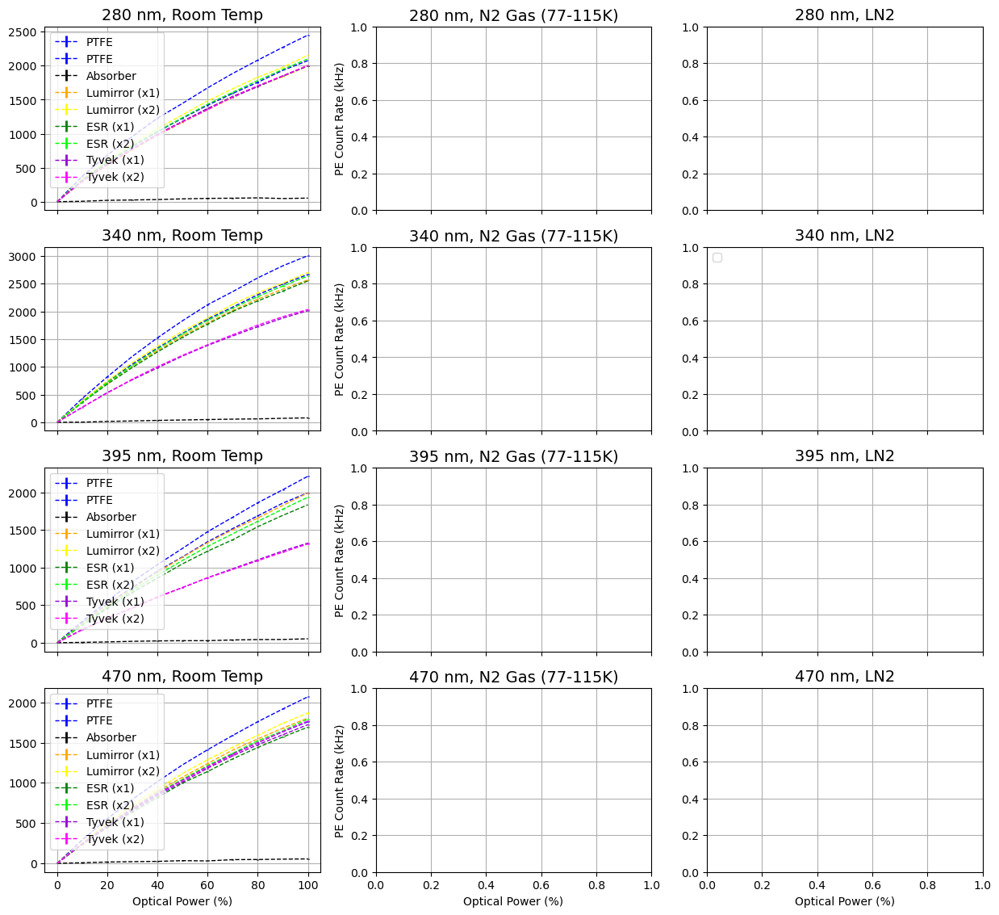

In [57]:
plt.close()
width = 15
fig,ax = plt.subplots(4,3,figsize=(width,4.4/3*width/((1+np.sqrt(5))/2)), sharex='col')

wavelengths = [280,340,395,470]
temps = ["Room Temp","N2 Gas (77-115K)", "LN2"]

#fig.title("REFLECT Sample Tests")


myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]

xshift = 0.5
### 280
#warm
ax[0,0].errorbar(optical_power_run0_warm_empty_280-0*xshift, PE_rate_run0_warm_empty_280-PE_rate_run0_warm_empty_280[0], yerr=np.where(PE_rate_uncertainty_run0_warm_empty_280>0,PE_rate_uncertainty_run0_warm_empty_280,0),
            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")
ax[0,0].errorbar(optical_power_21_warm_empty_280-0*xshift, PE_rate_21_warm_empty_280-PE_rate_21_warm_empty_280[0], yerr=np.where(PE_rate_uncertainty_21_warm_empty_280>0,PE_rate_uncertainty_21_warm_empty_280,0),
            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")
ax[0,0].errorbar(optical_power_run0_warm_black_280-0*xshift, PE_rate_run0_warm_black_280-PE_rate_run0_warm_black_280[0], yerr=np.where(PE_rate_uncertainty_run0_warm_black_280>0,PE_rate_uncertainty_run0_warm_black_280,0),
            fmt='--', linewidth=1, elinewidth=2, label="Absorber", color="Black")
ax[0,0].errorbar(optical_power_run0_warm_lum1_280-0*xshift, PE_rate_run0_warm_lum1_280-PE_rate_run0_warm_lum1_280[0], yerr=np.where(PE_rate_uncertainty_run0_warm_lum1_280>0,PE_rate_uncertainty_run0_warm_lum1_280,0),
            fmt='--', linewidth=1, elinewidth=2, label="Lumirror (x1)", color="orange")
ax[0,0].errorbar(optical_power_run0_warm_lum2_280-0*xshift, PE_rate_run0_warm_lum2_280-PE_rate_run0_warm_lum2_280[0], yerr=np.where(PE_rate_uncertainty_run0_warm_lum2_280>0,PE_rate_uncertainty_run0_warm_lum2_280,0),
            fmt='--', linewidth=1, elinewidth=2, label="Lumirror (x2)", color="yellow")
ax[0,0].errorbar(optical_power_run0_warm_esr1_280-0*xshift, PE_rate_run0_warm_esr1_280-PE_rate_run0_warm_esr1_280[0], yerr=np.where(PE_rate_uncertainty_run0_warm_esr1_280>0,PE_rate_uncertainty_run0_warm_esr1_280,0),
            fmt='--', linewidth=1, elinewidth=2, label="ESR (x1)", color="Green")
ax[0,0].errorbar(optical_power_run0_warm_esr2_280-0*xshift, PE_rate_run0_warm_esr2_280-PE_rate_run0_warm_esr2_280[0], yerr=np.where(PE_rate_uncertainty_run0_warm_esr2_280>0,PE_rate_uncertainty_run0_warm_esr2_280,0),
            fmt='--', linewidth=1, elinewidth=2, label="ESR (x2)", color="Lime")
ax[0,0].errorbar(optical_power_run0_warm_tyv1_280-0*xshift, PE_rate_run0_warm_tyv1_280-PE_rate_run0_warm_tyv1_280[0], yerr=np.where(PE_rate_uncertainty_run0_warm_tyv1_280>0,PE_rate_uncertainty_run0_warm_tyv1_280,0),
            fmt='--', linewidth=1, elinewidth=2, label="Tyvek (x1)", color="darkviolet")
ax[0,0].errorbar(optical_power_run0_warm_tyv2_280-0*xshift, PE_rate_run0_warm_tyv2_280-PE_rate_run0_warm_tyv2_280[0], yerr=np.where(PE_rate_uncertainty_run0_warm_tyv2_280>0,PE_rate_uncertainty_run0_warm_tyv2_280,0),
            fmt='--', linewidth=1, elinewidth=2, label="Tyvek (x2)", color="fuchsia")


#cold
#ax[0,1].errorbar(optical_power_run0_warm_empty_280-0*xshift, PE_rate_run0_warm_empty_280, yerr=np.where(PE_rate_uncertainty_run0_warm_empty_280>0,PE_rate_uncertainty_run0_warm_empty_280,0),
#            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")

#LN2
#ax[0,2].errorbar(optical_power_run0_warm_empty_280-0*xshift, PE_rate_run0_warm_empty_280, yerr=np.where(PE_rate_uncertainty_run0_warm_empty_280>0,PE_rate_uncertainty_run0_warm_empty_280,0),
#            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")

### 340
#warm
ax[1,0].errorbar(optical_power_run0_warm_empty_340-0*xshift, PE_rate_run0_warm_empty_340-PE_rate_run0_warm_empty_340[0], yerr=np.where(PE_rate_uncertainty_run0_warm_empty_340>0,PE_rate_uncertainty_run0_warm_empty_340,0),
            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")
ax[1,0].errorbar(optical_power_21_warm_empty_340-0*xshift, PE_rate_21_warm_empty_340-PE_rate_21_warm_empty_340[0], yerr=np.where(PE_rate_uncertainty_21_warm_empty_340>0,PE_rate_uncertainty_21_warm_empty_340,0),
            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")
ax[1,0].errorbar(optical_power_run0_warm_black_340-0*xshift, PE_rate_run0_warm_black_340-PE_rate_run0_warm_black_340[0], yerr=np.where(PE_rate_uncertainty_run0_warm_black_340>0,PE_rate_uncertainty_run0_warm_black_340,0),
            fmt='--', linewidth=1, elinewidth=2, label="Absorber", color="Black")
ax[1,0].errorbar(optical_power_run0_warm_lum1_340-0*xshift, PE_rate_run0_warm_lum1_340-PE_rate_run0_warm_lum1_340[0], yerr=np.where(PE_rate_uncertainty_run0_warm_lum1_340>0,PE_rate_uncertainty_run0_warm_lum1_340,0),
            fmt='--', linewidth=1, elinewidth=2, label="Lumirror (x1)", color="orange")
ax[1,0].errorbar(optical_power_run0_warm_lum2_340-0*xshift, PE_rate_run0_warm_lum2_340-PE_rate_run0_warm_lum2_340[0], yerr=np.where(PE_rate_uncertainty_run0_warm_lum2_340>0,PE_rate_uncertainty_run0_warm_lum2_340,0),
            fmt='--', linewidth=1, elinewidth=2, label="Lumirror (x2)", color="yellow")
ax[1,0].errorbar(optical_power_run0_warm_esr1_340-0*xshift, PE_rate_run0_warm_esr1_340-PE_rate_run0_warm_esr1_340[0], yerr=np.where(PE_rate_uncertainty_run0_warm_esr1_340>0,PE_rate_uncertainty_run0_warm_esr1_340,0),
            fmt='--', linewidth=1, elinewidth=2, label="ESR (x1)", color="Green")
ax[1,0].errorbar(optical_power_run0_warm_esr2_340-0*xshift, PE_rate_run0_warm_esr2_340-PE_rate_run0_warm_esr2_340[0], yerr=np.where(PE_rate_uncertainty_run0_warm_esr2_340>0,PE_rate_uncertainty_run0_warm_esr2_340,0),
            fmt='--', linewidth=1, elinewidth=2, label="ESR (x2)", color="Lime")
ax[1,0].errorbar(optical_power_run0_warm_tyv1_340-0*xshift, PE_rate_run0_warm_tyv1_340-PE_rate_run0_warm_tyv1_340[0], yerr=np.where(PE_rate_uncertainty_run0_warm_tyv1_340>0,PE_rate_uncertainty_run0_warm_tyv1_340,0),
            fmt='--', linewidth=1, elinewidth=2, label="Tyvek (x1)", color="darkviolet")
ax[1,0].errorbar(optical_power_run0_warm_tyv2_340-0*xshift, PE_rate_run0_warm_tyv2_340-PE_rate_run0_warm_tyv2_340[0], yerr=np.where(PE_rate_uncertainty_run0_warm_tyv2_340>0,PE_rate_uncertainty_run0_warm_tyv2_340,0),
            fmt='--', linewidth=1, elinewidth=2, label="Tyvek (x2)", color="fuchsia")

#cold
#ax[1,1].errorbar(optical_power_run0_warm_empty_340-0*xshift, PE_rate_run0_warm_empty_340, yerr=np.where(PE_rate_uncertainty_run0_warm_empty_340>0,PE_rate_uncertainty_run0_warm_empty_340,0),
#            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")

#LN2
#ax[1,2].errorbar(optical_power_run0_warm_empty_340-0*xshift, PE_rate_run0_warm_empty_340, yerr=np.where(PE_rate_uncertainty_run0_warm_empty_340>0,PE_rate_uncertainty_run0_warm_empty_340,0),
#            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")

### 395
#warm
ax[2,0].errorbar(optical_power_run0_warm_empty_395-0*xshift, PE_rate_run0_warm_empty_395-PE_rate_run0_warm_empty_395[0], yerr=np.where(PE_rate_uncertainty_run0_warm_empty_395>0,PE_rate_uncertainty_run0_warm_empty_395,0),
            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")
ax[2,0].errorbar(optical_power_21_warm_empty_395-0*xshift, PE_rate_21_warm_empty_395-PE_rate_21_warm_empty_395[0], yerr=np.where(PE_rate_uncertainty_21_warm_empty_395>0,PE_rate_uncertainty_21_warm_empty_395,0),
            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")
ax[2,0].errorbar(optical_power_run0_warm_black_395-0*xshift, PE_rate_run0_warm_black_395-PE_rate_run0_warm_black_395[0], yerr=np.where(PE_rate_uncertainty_run0_warm_black_395>0,PE_rate_uncertainty_run0_warm_black_395,0),
            fmt='--', linewidth=1, elinewidth=2, label="Absorber", color="Black")
ax[2,0].errorbar(optical_power_run0_warm_lum1_395-0*xshift, PE_rate_run0_warm_lum1_395-PE_rate_run0_warm_lum1_395[0], yerr=np.where(PE_rate_uncertainty_run0_warm_lum1_395>0,PE_rate_uncertainty_run0_warm_lum1_395,0),
            fmt='--', linewidth=1, elinewidth=2, label="Lumirror (x1)", color="orange")
ax[2,0].errorbar(optical_power_run0_warm_lum2_395-0*xshift, PE_rate_run0_warm_lum2_395-PE_rate_run0_warm_lum2_395[0], yerr=np.where(PE_rate_uncertainty_run0_warm_lum2_395>0,PE_rate_uncertainty_run0_warm_lum2_395,0),
            fmt='--', linewidth=1, elinewidth=2, label="Lumirror (x2)", color="yellow")
ax[2,0].errorbar(optical_power_run0_warm_esr1_395-0*xshift, PE_rate_run0_warm_esr1_395-PE_rate_run0_warm_esr1_395[0], yerr=np.where(PE_rate_uncertainty_run0_warm_esr1_395>0,PE_rate_uncertainty_run0_warm_esr1_395,0),
            fmt='--', linewidth=1, elinewidth=2, label="ESR (x1)", color="Green")
ax[2,0].errorbar(optical_power_run0_warm_esr2_395-0*xshift, PE_rate_run0_warm_esr2_395-PE_rate_run0_warm_esr2_395[0], yerr=np.where(PE_rate_uncertainty_run0_warm_esr2_395>0,PE_rate_uncertainty_run0_warm_esr2_395,0),
            fmt='--', linewidth=1, elinewidth=2, label="ESR (x2)", color="Lime")
ax[2,0].errorbar(optical_power_run0_warm_tyv1_395-0*xshift, PE_rate_run0_warm_tyv1_395-PE_rate_run0_warm_tyv1_395[0], yerr=np.where(PE_rate_uncertainty_run0_warm_tyv1_395>0,PE_rate_uncertainty_run0_warm_tyv1_395,0),
            fmt='--', linewidth=1, elinewidth=2, label="Tyvek (x1)", color="darkviolet")
ax[2,0].errorbar(optical_power_run0_warm_tyv2_395-0*xshift, PE_rate_run0_warm_tyv2_395-PE_rate_run0_warm_tyv2_395[0], yerr=np.where(PE_rate_uncertainty_run0_warm_tyv2_395>0,PE_rate_uncertainty_run0_warm_tyv2_395,0),
            fmt='--', linewidth=1, elinewidth=2, label="Tyvek (x2)", color="fuchsia")

#cold


#LN2
#ax[2,2].errorbar(optical_power_run0_warm_empty_395-0*xshift, PE_rate_run0_warm_empty_395, yerr=np.where(PE_rate_uncertainty_run0_warm_empty_395>0,PE_rate_uncertainty_run0_warm_empty_395,0),
#            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")


### 470
#warm
ax[3,0].errorbar(optical_power_run0_warm_empty_470-0*xshift, PE_rate_run0_warm_empty_470-PE_rate_run0_warm_empty_470[0], yerr=np.where(PE_rate_uncertainty_run0_warm_empty_470>0,PE_rate_uncertainty_run0_warm_empty_470,0),
            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")
ax[3,0].errorbar(optical_power_21_warm_empty_470-0*xshift, PE_rate_21_warm_empty_470-PE_rate_21_warm_empty_470[0], yerr=np.where(PE_rate_uncertainty_21_warm_empty_470>0,PE_rate_uncertainty_21_warm_empty_470,0),
            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")
ax[3,0].errorbar(optical_power_run0_warm_black_470-0*xshift, PE_rate_run0_warm_black_470-PE_rate_run0_warm_black_470[0], yerr=np.where(PE_rate_uncertainty_run0_warm_black_470>0,PE_rate_uncertainty_run0_warm_black_470,0),
            fmt='--', linewidth=1, elinewidth=2, label="Absorber", color="Black")
ax[3,0].errorbar(optical_power_run0_warm_lum1_470-0*xshift, PE_rate_run0_warm_lum1_470-PE_rate_run0_warm_lum1_470[0], yerr=np.where(PE_rate_uncertainty_run0_warm_lum1_470>0,PE_rate_uncertainty_run0_warm_lum1_470,0),
            fmt='--', linewidth=1, elinewidth=2, label="Lumirror (x1)", color="orange")
ax[3,0].errorbar(optical_power_run0_warm_lum2_470-0*xshift, PE_rate_run0_warm_lum2_470-PE_rate_run0_warm_lum2_470[0], yerr=np.where(PE_rate_uncertainty_run0_warm_lum2_470>0,PE_rate_uncertainty_run0_warm_lum2_470,0),
            fmt='--', linewidth=1, elinewidth=2, label="Lumirror (x2)", color="yellow")
ax[3,0].errorbar(optical_power_run0_warm_esr1_470-0*xshift, PE_rate_run0_warm_esr1_470-PE_rate_run0_warm_esr1_470[0], yerr=np.where(PE_rate_uncertainty_run0_warm_esr1_470>0,PE_rate_uncertainty_run0_warm_esr1_470,0),
            fmt='--', linewidth=1, elinewidth=2, label="ESR (x1)", color="Green")
ax[3,0].errorbar(optical_power_run0_warm_esr2_470-0*xshift, PE_rate_run0_warm_esr2_470-PE_rate_run0_warm_esr2_470[0], yerr=np.where(PE_rate_uncertainty_run0_warm_esr2_470>0,PE_rate_uncertainty_run0_warm_esr2_470,0),
            fmt='--', linewidth=1, elinewidth=2, label="ESR (x2)", color="Lime")
ax[3,0].errorbar(optical_power_run0_warm_tyv1_470-0*xshift, PE_rate_run0_warm_tyv1_470-PE_rate_run0_warm_tyv1_470[0], yerr=np.where(PE_rate_uncertainty_run0_warm_tyv1_470>0,PE_rate_uncertainty_run0_warm_tyv1_470,0),
            fmt='--', linewidth=1, elinewidth=2, label="Tyvek (x1)", color="darkviolet")
ax[3,0].errorbar(optical_power_run0_warm_tyv2_470-0*xshift, PE_rate_run0_warm_tyv2_470-PE_rate_run0_warm_tyv2_470[0], yerr=np.where(PE_rate_uncertainty_run0_warm_tyv2_470>0,PE_rate_uncertainty_run0_warm_tyv2_470,0),
            fmt='--', linewidth=1, elinewidth=2, label="Tyvek (x2)", color="fuchsia")

#cold
#ax[3,1].errorbar(optical_power_run0_warm_empty_470-0*xshift, PE_rate_run0_warm_empty_470, yerr=np.where(PE_rate_uncertainty_run0_warm_empty_470>0,PE_rate_uncertainty_run0_warm_empty_470,0),
#            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")

#LN2
#ax[3,2].errorbar(optical_power_run0_warm_empty_470-0*xshift, PE_rate_run0_warm_empty_470, yerr=np.where(PE_rate_uncertainty_run0_warm_empty_470>0,PE_rate_uncertainty_run0_warm_empty_470,0),
#            fmt='--', linewidth=1, elinewidth=2, label="PTFE", color="Blue")

ax[0,0].legend(loc='upper left', fontsize=10)
ax[1,2].legend(loc='upper left', fontsize=10)
ax[2,0].legend(loc='upper left', fontsize=10)
ax[3,0].legend(loc='upper left', fontsize=10)
#ax[0,0].set_ylim(0,800)
for i in range(4):
    for j in range(3):
        ax[i,j].set_title(f"{wavelengths[i]} nm, {temps[j]}", size=14)
        ax[i,j].grid()
        if i==3: ax[i,j].set_xlabel("Optical Power (%)", size=10)

#ax[3,0].set_xlabel("LED Drive Current (mA)", size=10)
#ax[3,1].set_xlabel("LED Drive Current (mA)", size=10)
#ax[3,2].set_xlabel("LED Drive Current (mA)", size=10)
ax[0,1].set_ylabel("PE Count Rate (kHz)", size=10)
ax[1,1].set_ylabel("PE Count Rate (kHz)", size=10)
ax[2,1].set_ylabel("PE Count Rate (kHz)", size=10)
ax[3,1].set_ylabel("PE Count Rate (kHz)", size=10)
plt.show()

### 280

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


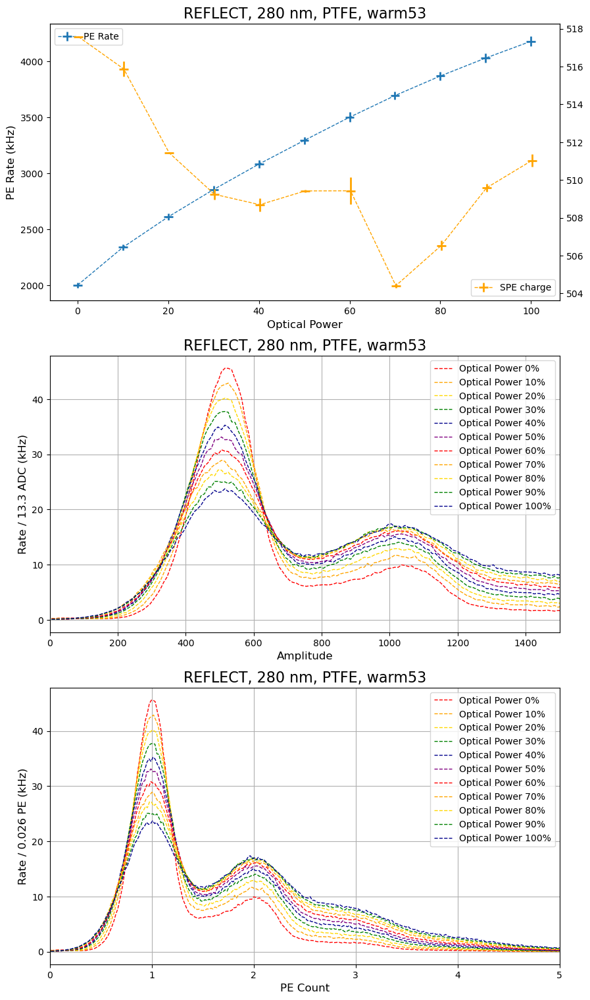

In [6]:
tic()
inputfile=np.load("../../REFLECT/runLAr.0/runLAr.0_results_warm53_280_empty.npz", allow_pickle=True)
material = "PTFE"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm53_empty_280 = result_dict['optical_power']
labels_run0_warm53_empty_280 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm53_empty_280]
SPE_charge_run0_warm53_empty_280 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm53_empty_280 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm53_empty_280 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm53_empty_280 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm53_empty_280 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm53_empty_280 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm53_empty_280"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 280 nm, {material}, warm53", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 280 nm, {material}, warm53", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 280 nm, {material}, warm53", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm53_empty_280)):
        optical_power_sorted[graphnum] = optical_power_run0_warm53_empty_280[np.argmin( abs(optical_power_run0_warm53_empty_280-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm53_empty_280[np.argmin( abs(optical_power_run0_warm53_empty_280-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm53_empty_280[np.argmin( abs(optical_power_run0_warm53_empty_280-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm53_empty_280[np.argmin( abs(optical_power_run0_warm53_empty_280-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm53_empty_280[np.argmin( abs(optical_power_run0_warm53_empty_280-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm53_empty_280, finger_plot_run0_warm53_empty_280[np.argmin( abs(optical_power_run0_warm53_empty_280-graphnum*10) )], #yerr=Darkwarm53Data[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm53_empty_280[np.argmin( abs(optical_power_run0_warm53_empty_280-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm53_empty_280/SPE_charge_sorted[graphnum], finger_plot_run0_warm53_empty_280[np.argmin( abs(optical_power_run0_warm53_empty_280-graphnum*10) )], #yerr=Darkwarm53Data[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm53_empty_280[np.argmin( abs(optical_power_run0_warm53_empty_280-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm53_empty_280 = 1*optical_power_sorted
SPE_charge_run0_warm53_empty_280 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm53_empty_280 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm53_empty_280 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm53_empty_280 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm53_empty_280, PE_rate_run0_warm53_empty_280, xerr=[1]*len(optical_power_run0_warm53_empty_280), yerr=PE_rate_uncertainty_run0_warm53_empty_280*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm53_empty_280+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm53_empty_280), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


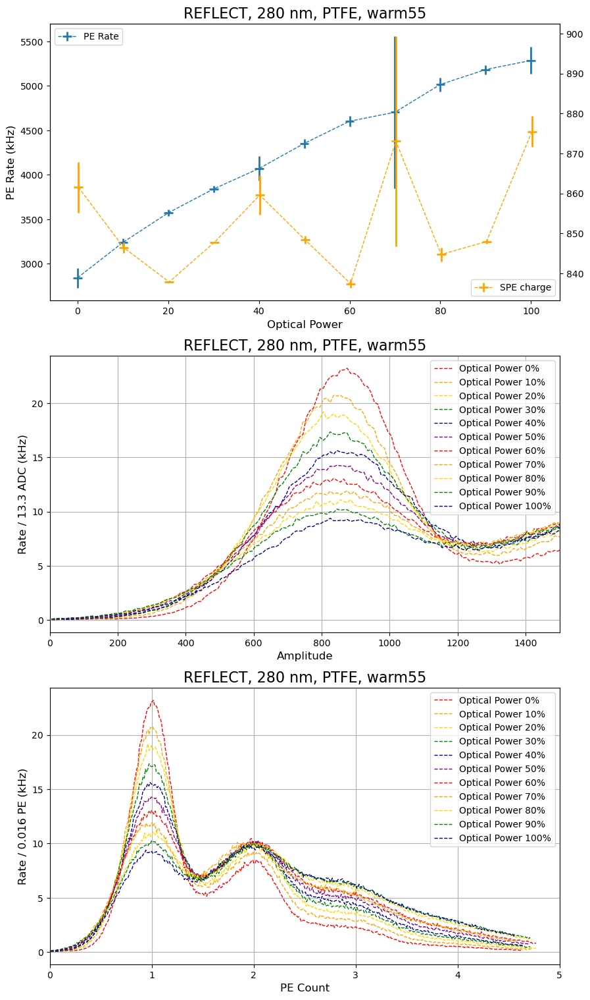

In [7]:
tic()
inputfile=np.load("../../REFLECT/runLAr.0/runLAr.0_results_warm55_280_empty.npz", allow_pickle=True)
material = "PTFE"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm55_empty_280 = result_dict['optical_power']
labels_run0_warm55_empty_280 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm55_empty_280]
SPE_charge_run0_warm55_empty_280 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm55_empty_280 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm55_empty_280 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm55_empty_280 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm55_empty_280 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm55_empty_280 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm55_empty_280"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 280 nm, {material}, warm55", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 280 nm, {material}, warm55", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 280 nm, {material}, warm55", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm55_empty_280)):
        optical_power_sorted[graphnum] = optical_power_run0_warm55_empty_280[np.argmin( abs(optical_power_run0_warm55_empty_280-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm55_empty_280[np.argmin( abs(optical_power_run0_warm55_empty_280-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm55_empty_280[np.argmin( abs(optical_power_run0_warm55_empty_280-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm55_empty_280[np.argmin( abs(optical_power_run0_warm55_empty_280-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm55_empty_280[np.argmin( abs(optical_power_run0_warm55_empty_280-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm55_empty_280, finger_plot_run0_warm55_empty_280[np.argmin( abs(optical_power_run0_warm55_empty_280-graphnum*10) )], #yerr=Darkwarm55Data[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm55_empty_280[np.argmin( abs(optical_power_run0_warm55_empty_280-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm55_empty_280/SPE_charge_sorted[graphnum], finger_plot_run0_warm55_empty_280[np.argmin( abs(optical_power_run0_warm55_empty_280-graphnum*10) )], #yerr=Darkwarm55Data[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm55_empty_280[np.argmin( abs(optical_power_run0_warm55_empty_280-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm55_empty_280 = 1*optical_power_sorted
SPE_charge_run0_warm55_empty_280 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm55_empty_280 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm55_empty_280 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm55_empty_280 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm55_empty_280, PE_rate_run0_warm55_empty_280, xerr=[1]*len(optical_power_run0_warm55_empty_280), yerr=PE_rate_uncertainty_run0_warm55_empty_280*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm55_empty_280+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm55_empty_280), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


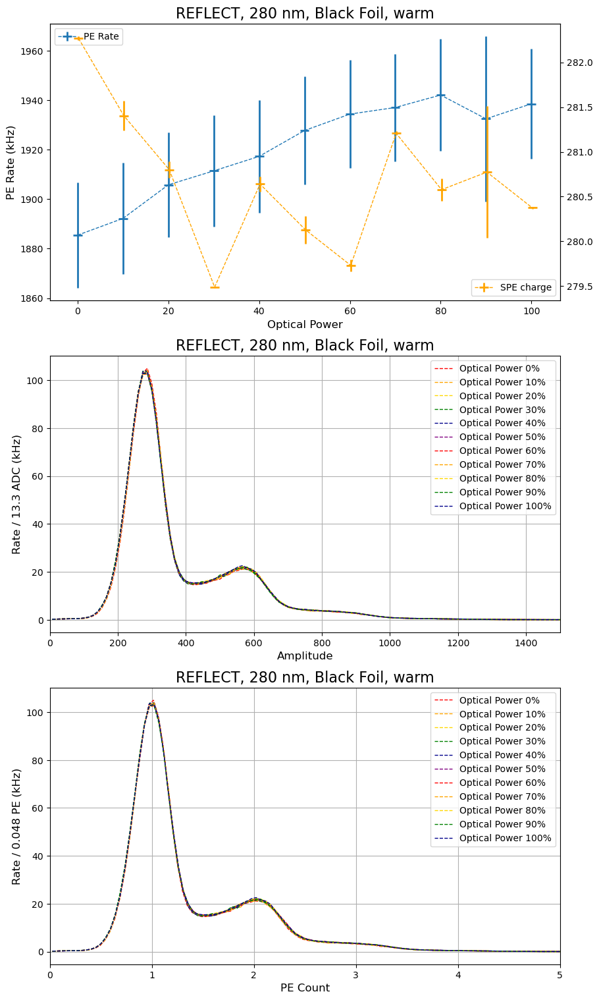

In [ ]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_280_black.npz", allow_pickle=True)
material = "Black Foil"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_black_280 = result_dict['optical_power']
labels_run0_warm_black_280 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_black_280]
SPE_charge_run0_warm_black_280 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_black_280 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_black_280 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_black_280 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_black_280 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_black_280 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_black_280"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 280 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 280 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 280 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_black_280)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_black_280[np.argmin( abs(optical_power_run0_warm_black_280-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_black_280[np.argmin( abs(optical_power_run0_warm_black_280-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_black_280[np.argmin( abs(optical_power_run0_warm_black_280-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_black_280[np.argmin( abs(optical_power_run0_warm_black_280-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_black_280[np.argmin( abs(optical_power_run0_warm_black_280-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_black_280, finger_plot_run0_warm_black_280[np.argmin( abs(optical_power_run0_warm_black_280-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_black_280[np.argmin( abs(optical_power_run0_warm_black_280-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_black_280/SPE_charge_sorted[graphnum], finger_plot_run0_warm_black_280[np.argmin( abs(optical_power_run0_warm_black_280-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_black_280[np.argmin( abs(optical_power_run0_warm_black_280-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_black_280 = 1*optical_power_sorted
SPE_charge_run0_warm_black_280 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_black_280 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_black_280 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_black_280 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_black_280, PE_rate_run0_warm_black_280, xerr=[1]*len(optical_power_run0_warm_black_280), yerr=PE_rate_uncertainty_run0_warm_black_280*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_black_280+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_black_280), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

In [9]:
tic()
inputfile=np.load("../../REFLECT/runLAr.0/runLAr.0_results_warm53_280_lum1.npz", allow_pickle=True)
material = "Lumirror (x1)"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm53_lum1_280 = result_dict['optical_power']
labels_run0_warm53_lum1_280 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm53_lum1_280]
SPE_charge_run0_warm53_lum1_280 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm53_lum1_280 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm53_lum1_280 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm53_lum1_280 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm53_lum1_280 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm53_lum1_280 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm53_lum1_280"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 280 nm, {material}, warm53", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 280 nm, {material}, warm53", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 280 nm, {material}, warm53", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm53_lum1_280)):
        optical_power_sorted[graphnum] = optical_power_run0_warm53_lum1_280[np.argmin( abs(optical_power_run0_warm53_lum1_280-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm53_lum1_280[np.argmin( abs(optical_power_run0_warm53_lum1_280-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm53_lum1_280[np.argmin( abs(optical_power_run0_warm53_lum1_280-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm53_lum1_280[np.argmin( abs(optical_power_run0_warm53_lum1_280-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm53_lum1_280[np.argmin( abs(optical_power_run0_warm53_lum1_280-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm53_lum1_280, finger_plot_run0_warm53_lum1_280[np.argmin( abs(optical_power_run0_warm53_lum1_280-graphnum*10) )], #yerr=Darkwarm53Data[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm53_lum1_280[np.argmin( abs(optical_power_run0_warm53_lum1_280-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm53_lum1_280/SPE_charge_sorted[graphnum], finger_plot_run0_warm53_lum1_280[np.argmin( abs(optical_power_run0_warm53_lum1_280-graphnum*10) )], #yerr=Darkwarm53Data[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm53_lum1_280[np.argmin( abs(optical_power_run0_warm53_lum1_280-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm53_lum1_280 = 1*optical_power_sorted
SPE_charge_run0_warm53_lum1_280 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm53_lum1_280 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm53_lum1_280 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm53_lum1_280 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm53_lum1_280, PE_rate_run0_warm53_lum1_280, xerr=[1]*len(optical_power_run0_warm53_lum1_280), yerr=PE_rate_uncertainty_run0_warm53_lum1_280*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm53_lum1_280+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm53_lum1_280), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '../../REFLECT/runLAr.0/runLAr.0_results_warm53_280_lum1.npz'

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


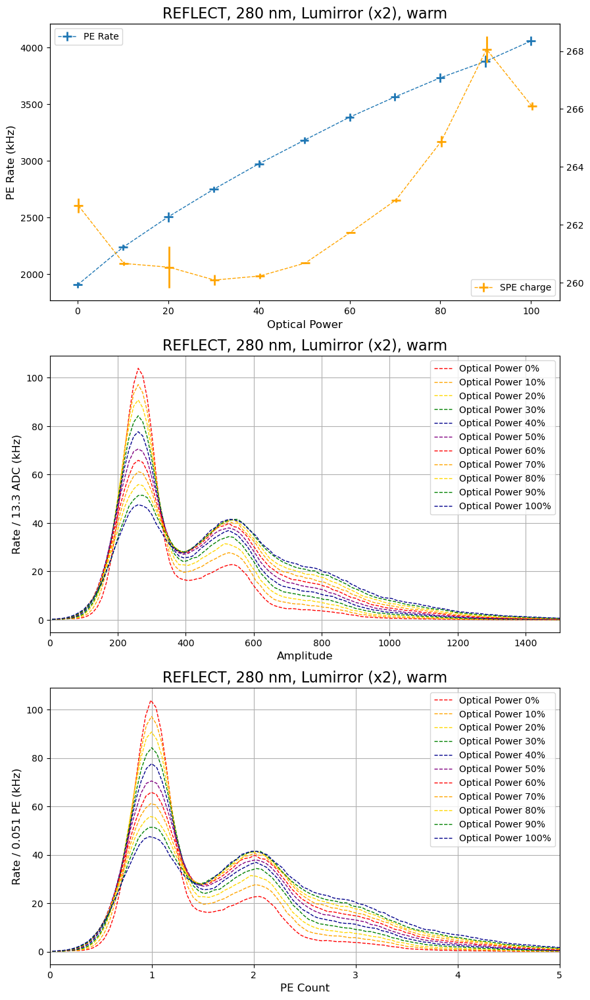

In [6]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_280_lum2.npz", allow_pickle=True)
material = "Lumirror (x2)"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_lum2_280 = result_dict['optical_power']
labels_run0_warm_lum2_280 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_lum2_280]
SPE_charge_run0_warm_lum2_280 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_lum2_280 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_lum2_280 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_lum2_280 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_lum2_280 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_lum2_280 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_lum2_280"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 280 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 280 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 280 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_lum2_280)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_lum2_280[np.argmin( abs(optical_power_run0_warm_lum2_280-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_lum2_280[np.argmin( abs(optical_power_run0_warm_lum2_280-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_lum2_280[np.argmin( abs(optical_power_run0_warm_lum2_280-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_lum2_280[np.argmin( abs(optical_power_run0_warm_lum2_280-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_lum2_280[np.argmin( abs(optical_power_run0_warm_lum2_280-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_lum2_280, finger_plot_run0_warm_lum2_280[np.argmin( abs(optical_power_run0_warm_lum2_280-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_lum2_280[np.argmin( abs(optical_power_run0_warm_lum2_280-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_lum2_280/SPE_charge_sorted[graphnum], finger_plot_run0_warm_lum2_280[np.argmin( abs(optical_power_run0_warm_lum2_280-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_lum2_280[np.argmin( abs(optical_power_run0_warm_lum2_280-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_lum2_280 = 1*optical_power_sorted
SPE_charge_run0_warm_lum2_280 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_lum2_280 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_lum2_280 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_lum2_280 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_lum2_280, PE_rate_run0_warm_lum2_280, xerr=[1]*len(optical_power_run0_warm_lum2_280), yerr=PE_rate_uncertainty_run0_warm_lum2_280*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_lum2_280+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_lum2_280), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


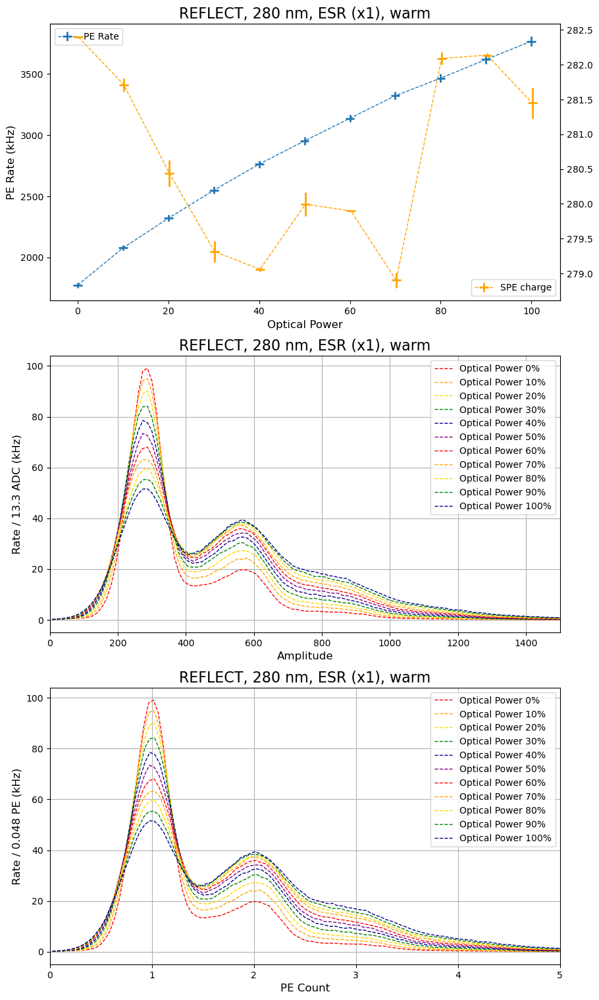

In [7]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_280_esr1.npz", allow_pickle=True)
material = "ESR (x1)"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_esr1_280 = result_dict['optical_power']
labels_run0_warm_esr1_280 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_esr1_280]
SPE_charge_run0_warm_esr1_280 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_esr1_280 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_esr1_280 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_esr1_280 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_esr1_280 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_esr1_280 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_esr1_280"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 280 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 280 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 280 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_esr1_280)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_esr1_280[np.argmin( abs(optical_power_run0_warm_esr1_280-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_esr1_280[np.argmin( abs(optical_power_run0_warm_esr1_280-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_esr1_280[np.argmin( abs(optical_power_run0_warm_esr1_280-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_esr1_280[np.argmin( abs(optical_power_run0_warm_esr1_280-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_esr1_280[np.argmin( abs(optical_power_run0_warm_esr1_280-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_esr1_280, finger_plot_run0_warm_esr1_280[np.argmin( abs(optical_power_run0_warm_esr1_280-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_esr1_280[np.argmin( abs(optical_power_run0_warm_esr1_280-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_esr1_280/SPE_charge_sorted[graphnum], finger_plot_run0_warm_esr1_280[np.argmin( abs(optical_power_run0_warm_esr1_280-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_esr1_280[np.argmin( abs(optical_power_run0_warm_esr1_280-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_esr1_280 = 1*optical_power_sorted
SPE_charge_run0_warm_esr1_280 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_esr1_280 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_esr1_280 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_esr1_280 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_esr1_280, PE_rate_run0_warm_esr1_280, xerr=[1]*len(optical_power_run0_warm_esr1_280), yerr=PE_rate_uncertainty_run0_warm_esr1_280*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_esr1_280+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_esr1_280), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


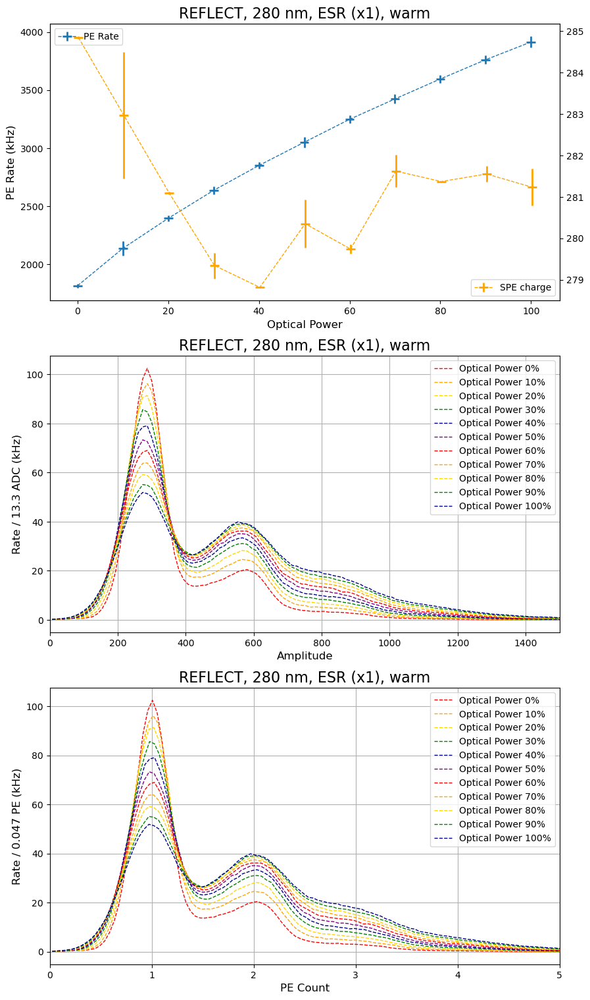

In [8]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_280_esr2.npz", allow_pickle=True)
material = "ESR (x1)"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_esr2_280 = result_dict['optical_power']
labels_run0_warm_esr2_280 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_esr2_280]
SPE_charge_run0_warm_esr2_280 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_esr2_280 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_esr2_280 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_esr2_280 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_esr2_280 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_esr2_280 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_esr2_280"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 280 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 280 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 280 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_esr2_280)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_esr2_280[np.argmin( abs(optical_power_run0_warm_esr2_280-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_esr2_280[np.argmin( abs(optical_power_run0_warm_esr2_280-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_esr2_280[np.argmin( abs(optical_power_run0_warm_esr2_280-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_esr2_280[np.argmin( abs(optical_power_run0_warm_esr2_280-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_esr2_280[np.argmin( abs(optical_power_run0_warm_esr2_280-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_esr2_280, finger_plot_run0_warm_esr2_280[np.argmin( abs(optical_power_run0_warm_esr2_280-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_esr2_280[np.argmin( abs(optical_power_run0_warm_esr2_280-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_esr2_280/SPE_charge_sorted[graphnum], finger_plot_run0_warm_esr2_280[np.argmin( abs(optical_power_run0_warm_esr2_280-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_esr2_280[np.argmin( abs(optical_power_run0_warm_esr2_280-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_esr2_280 = 1*optical_power_sorted
SPE_charge_run0_warm_esr2_280 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_esr2_280 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_esr2_280 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_esr2_280 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_esr2_280, PE_rate_run0_warm_esr2_280, xerr=[1]*len(optical_power_run0_warm_esr2_280), yerr=PE_rate_uncertainty_run0_warm_esr2_280*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_esr2_280+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_esr2_280), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


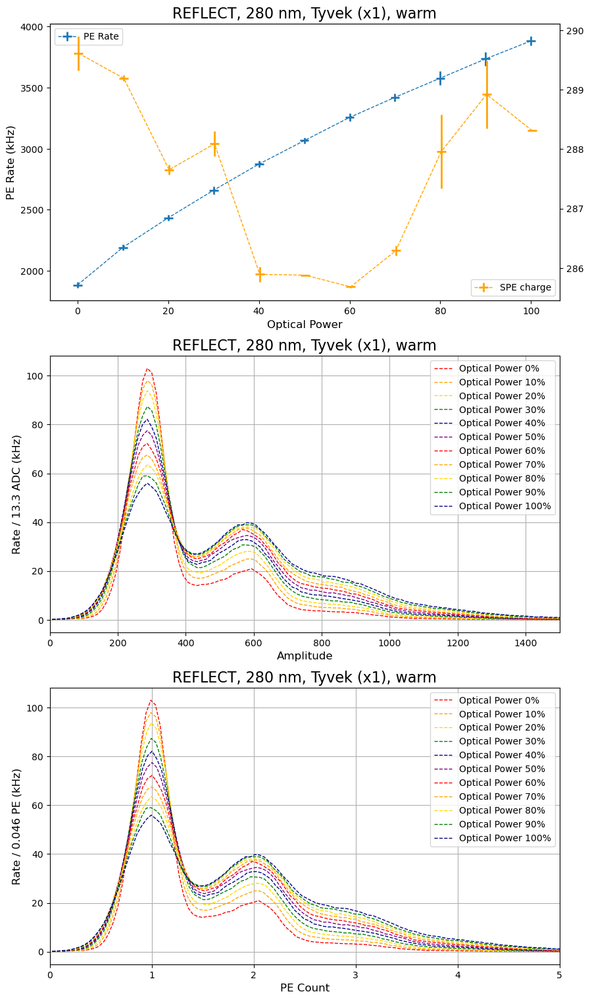

In [9]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_280_tyv1.npz", allow_pickle=True)
material = "Tyvek (x1)"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_tyv1_280 = result_dict['optical_power']
labels_run0_warm_tyv1_280 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_tyv1_280]
SPE_charge_run0_warm_tyv1_280 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_tyv1_280 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_tyv1_280 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_tyv1_280 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_tyv1_280 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_tyv1_280 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_tyv1_280"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 280 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 280 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 280 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_tyv1_280)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_tyv1_280[np.argmin( abs(optical_power_run0_warm_tyv1_280-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_tyv1_280[np.argmin( abs(optical_power_run0_warm_tyv1_280-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_tyv1_280[np.argmin( abs(optical_power_run0_warm_tyv1_280-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_tyv1_280[np.argmin( abs(optical_power_run0_warm_tyv1_280-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_tyv1_280[np.argmin( abs(optical_power_run0_warm_tyv1_280-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_tyv1_280, finger_plot_run0_warm_tyv1_280[np.argmin( abs(optical_power_run0_warm_tyv1_280-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_tyv1_280[np.argmin( abs(optical_power_run0_warm_tyv1_280-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_tyv1_280/SPE_charge_sorted[graphnum], finger_plot_run0_warm_tyv1_280[np.argmin( abs(optical_power_run0_warm_tyv1_280-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_tyv1_280[np.argmin( abs(optical_power_run0_warm_tyv1_280-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_tyv1_280 = 1*optical_power_sorted
SPE_charge_run0_warm_tyv1_280 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_tyv1_280 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_tyv1_280 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_tyv1_280 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_tyv1_280, PE_rate_run0_warm_tyv1_280, xerr=[1]*len(optical_power_run0_warm_tyv1_280), yerr=PE_rate_uncertainty_run0_warm_tyv1_280*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_tyv1_280+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_tyv1_280), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


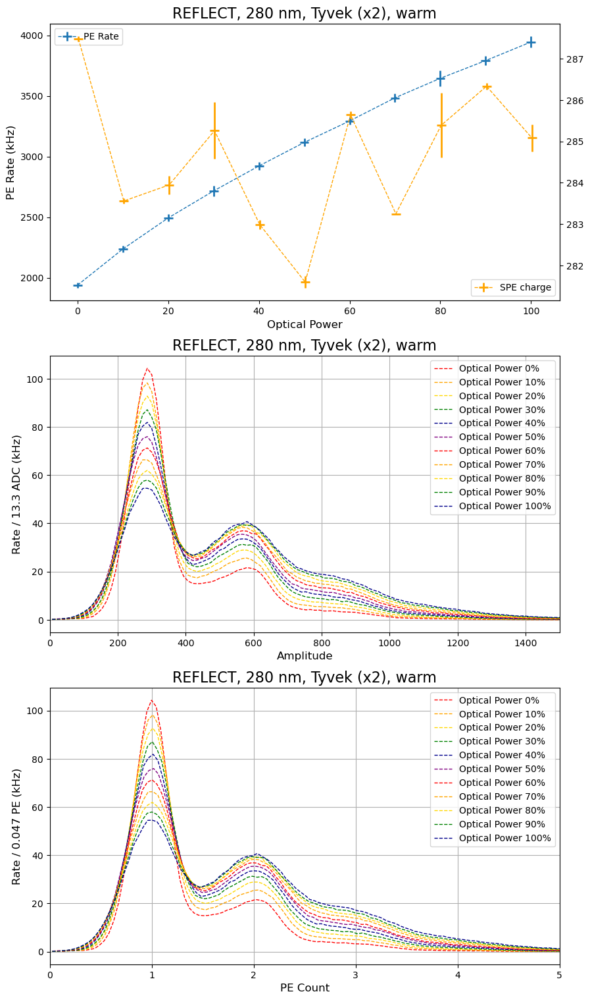

In [10]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_280_tyv2.npz", allow_pickle=True)
material = "Tyvek (x2)"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_tyv2_280 = result_dict['optical_power']
labels_run0_warm_tyv2_280 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_tyv2_280]
SPE_charge_run0_warm_tyv2_280 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_tyv2_280 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_tyv2_280 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_tyv2_280 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_tyv2_280 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_tyv2_280 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_tyv2_280"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 280 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 280 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 280 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_tyv2_280)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_tyv2_280[np.argmin( abs(optical_power_run0_warm_tyv2_280-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_tyv2_280[np.argmin( abs(optical_power_run0_warm_tyv2_280-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_tyv2_280[np.argmin( abs(optical_power_run0_warm_tyv2_280-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_tyv2_280[np.argmin( abs(optical_power_run0_warm_tyv2_280-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_tyv2_280[np.argmin( abs(optical_power_run0_warm_tyv2_280-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_tyv2_280, finger_plot_run0_warm_tyv2_280[np.argmin( abs(optical_power_run0_warm_tyv2_280-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_tyv2_280[np.argmin( abs(optical_power_run0_warm_tyv2_280-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_tyv2_280/SPE_charge_sorted[graphnum], finger_plot_run0_warm_tyv2_280[np.argmin( abs(optical_power_run0_warm_tyv2_280-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_tyv2_280[np.argmin( abs(optical_power_run0_warm_tyv2_280-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_tyv2_280 = 1*optical_power_sorted
SPE_charge_run0_warm_tyv2_280 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_tyv2_280 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_tyv2_280 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_tyv2_280 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_tyv2_280, PE_rate_run0_warm_tyv2_280, xerr=[1]*len(optical_power_run0_warm_tyv2_280), yerr=PE_rate_uncertainty_run0_warm_tyv2_280*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_tyv2_280+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_tyv2_280), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


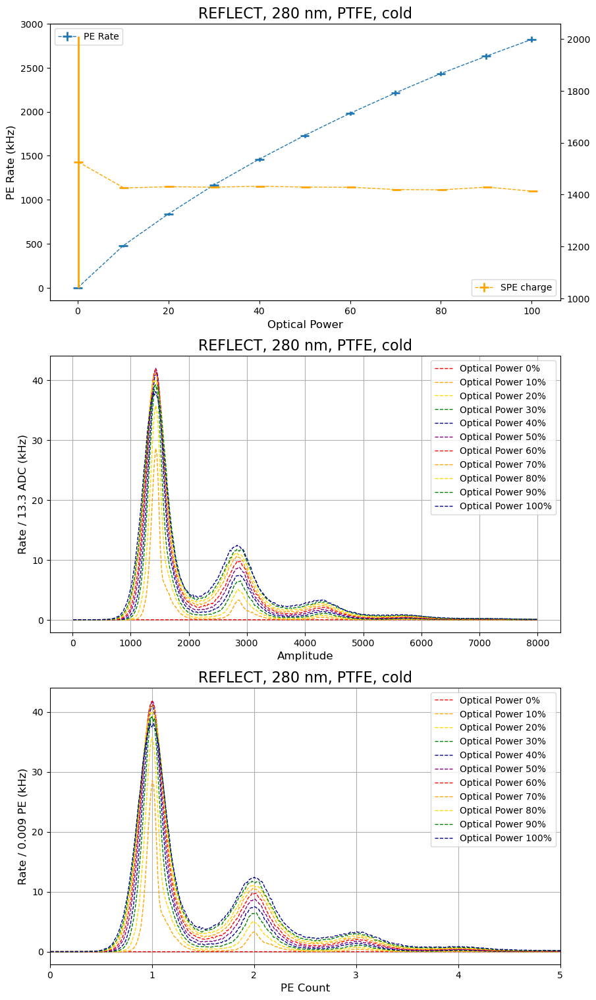

In [17]:
tic()
inputfile=np.load("../../REFLECT/runLAr.0/runLAr.0_results_cold_280_empty.npz", allow_pickle=True)
material = "PTFE"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_cold_empty_280 = result_dict['optical_power']
labels_run0_cold_empty_280 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_cold_empty_280]
SPE_charge_run0_cold_empty_280 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_cold_empty_280 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_cold_empty_280 = result_dict['PE_rate']
PE_rate_uncertainty_run0_cold_empty_280 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_cold_empty_280 = result_dict['finger_plot_amplitude']
finger_plot_run0_cold_empty_280 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_cold_empty_280"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 280 nm, {material}, cold", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 280 nm, {material}, cold", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 280 nm, {material}, cold", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_cold_empty_280)):
        optical_power_sorted[graphnum] = optical_power_run0_cold_empty_280[np.argmin( abs(optical_power_run0_cold_empty_280-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_cold_empty_280[np.argmin( abs(optical_power_run0_cold_empty_280-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_cold_empty_280[np.argmin( abs(optical_power_run0_cold_empty_280-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_cold_empty_280[np.argmin( abs(optical_power_run0_cold_empty_280-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_cold_empty_280[np.argmin( abs(optical_power_run0_cold_empty_280-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_cold_empty_280, finger_plot_run0_cold_empty_280[np.argmin( abs(optical_power_run0_cold_empty_280-graphnum*10) )], #yerr=DarkcoldData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_cold_empty_280[np.argmin( abs(optical_power_run0_cold_empty_280-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_cold_empty_280/SPE_charge_sorted[graphnum], finger_plot_run0_cold_empty_280[np.argmin( abs(optical_power_run0_cold_empty_280-graphnum*10) )], #yerr=DarkcoldData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_cold_empty_280[np.argmin( abs(optical_power_run0_cold_empty_280-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    #ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_cold_empty_280 = 1*optical_power_sorted
SPE_charge_run0_cold_empty_280 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_cold_empty_280 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_cold_empty_280 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_cold_empty_280 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_cold_empty_280, PE_rate_run0_cold_empty_280, xerr=[1]*len(optical_power_run0_cold_empty_280), yerr=PE_rate_uncertainty_run0_cold_empty_280*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_cold_empty_280+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_cold_empty_280), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


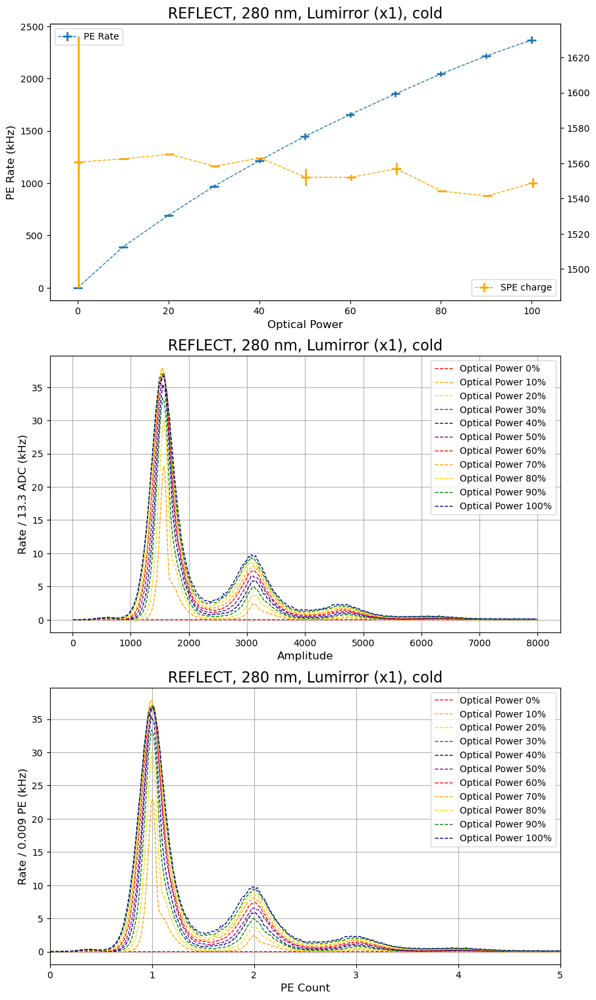

In [18]:
tic()
inputfile=np.load("../../REFLECT/runLAr.0/runLAr.0_results_cold_280_lum1.npz", allow_pickle=True)
material = "Lumirror (x1)"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_cold_lum1_280 = result_dict['optical_power']
labels_run0_cold_lum1_280 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_cold_lum1_280]
SPE_charge_run0_cold_lum1_280 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_cold_lum1_280 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_cold_lum1_280 = result_dict['PE_rate']
PE_rate_uncertainty_run0_cold_lum1_280 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_cold_lum1_280 = result_dict['finger_plot_amplitude']
finger_plot_run0_cold_lum1_280 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_cold_lum1_280"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 280 nm, {material}, cold", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 280 nm, {material}, cold", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 280 nm, {material}, cold", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_cold_lum1_280)):
        optical_power_sorted[graphnum] = optical_power_run0_cold_lum1_280[np.argmin( abs(optical_power_run0_cold_lum1_280-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_cold_lum1_280[np.argmin( abs(optical_power_run0_cold_lum1_280-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_cold_lum1_280[np.argmin( abs(optical_power_run0_cold_lum1_280-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_cold_lum1_280[np.argmin( abs(optical_power_run0_cold_lum1_280-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_cold_lum1_280[np.argmin( abs(optical_power_run0_cold_lum1_280-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_cold_lum1_280, finger_plot_run0_cold_lum1_280[np.argmin( abs(optical_power_run0_cold_lum1_280-graphnum*10) )], #yerr=DarkcoldData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_cold_lum1_280[np.argmin( abs(optical_power_run0_cold_lum1_280-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_cold_lum1_280/SPE_charge_sorted[graphnum], finger_plot_run0_cold_lum1_280[np.argmin( abs(optical_power_run0_cold_lum1_280-graphnum*10) )], #yerr=DarkcoldData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_cold_lum1_280[np.argmin( abs(optical_power_run0_cold_lum1_280-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    #ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_cold_lum1_280 = 1*optical_power_sorted
SPE_charge_run0_cold_lum1_280 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_cold_lum1_280 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_cold_lum1_280 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_cold_lum1_280 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_cold_lum1_280, PE_rate_run0_cold_lum1_280, xerr=[1]*len(optical_power_run0_cold_lum1_280), yerr=PE_rate_uncertainty_run0_cold_lum1_280*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_cold_lum1_280+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_cold_lum1_280), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


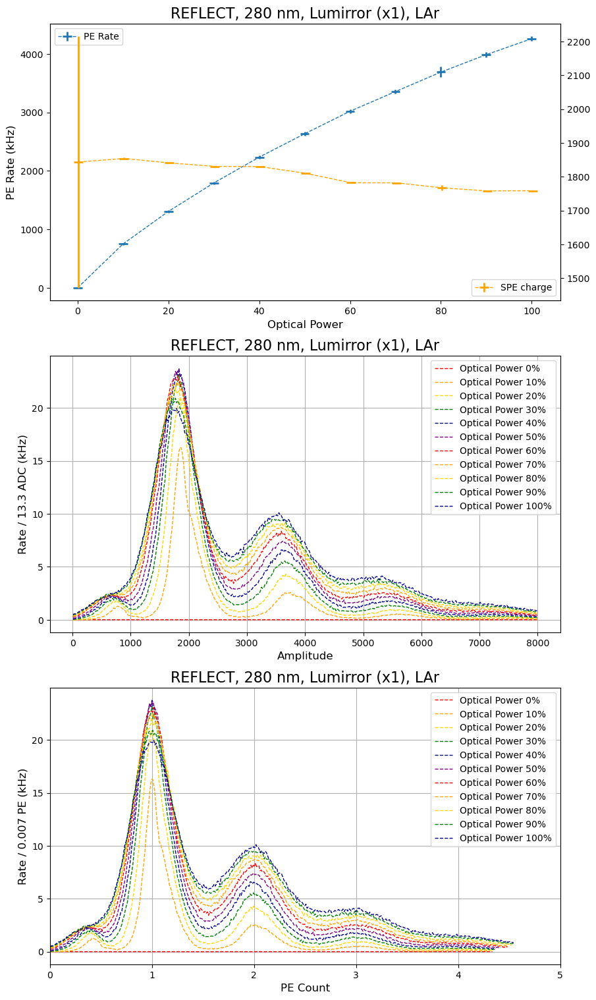

In [21]:
tic()
inputfile=np.load("../../REFLECT/runLAr.0/runLAr.0_results_LAr_280_empty.npz", allow_pickle=True)
material = "Lumirror (x1)"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_LAr_empty_280 = result_dict['optical_power']
labels_run0_LAr_empty_280 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_LAr_empty_280]
SPE_charge_run0_LAr_empty_280 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_LAr_empty_280 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_LAr_empty_280 = result_dict['PE_rate']
PE_rate_uncertainty_run0_LAr_empty_280 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_LAr_empty_280 = result_dict['finger_plot_amplitude']
finger_plot_run0_LAr_empty_280 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_LAr_empty_280"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 280 nm, {material}, LAr", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 280 nm, {material}, LAr", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 280 nm, {material}, LAr", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_LAr_empty_280)):
        optical_power_sorted[graphnum] = optical_power_run0_LAr_empty_280[np.argmin( abs(optical_power_run0_LAr_empty_280-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_LAr_empty_280[np.argmin( abs(optical_power_run0_LAr_empty_280-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_LAr_empty_280[np.argmin( abs(optical_power_run0_LAr_empty_280-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_LAr_empty_280[np.argmin( abs(optical_power_run0_LAr_empty_280-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_LAr_empty_280[np.argmin( abs(optical_power_run0_LAr_empty_280-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_LAr_empty_280, finger_plot_run0_LAr_empty_280[np.argmin( abs(optical_power_run0_LAr_empty_280-graphnum*10) )], #yerr=DarkLArData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_LAr_empty_280[np.argmin( abs(optical_power_run0_LAr_empty_280-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_LAr_empty_280/SPE_charge_sorted[graphnum], finger_plot_run0_LAr_empty_280[np.argmin( abs(optical_power_run0_LAr_empty_280-graphnum*10) )], #yerr=DarkLArData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_LAr_empty_280[np.argmin( abs(optical_power_run0_LAr_empty_280-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    #ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_LAr_empty_280 = 1*optical_power_sorted
SPE_charge_run0_LAr_empty_280 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_LAr_empty_280 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_LAr_empty_280 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_LAr_empty_280 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_LAr_empty_280, PE_rate_run0_LAr_empty_280, xerr=[1]*len(optical_power_run0_LAr_empty_280), yerr=PE_rate_uncertainty_run0_LAr_empty_280*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_LAr_empty_280+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_LAr_empty_280), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

### 340

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


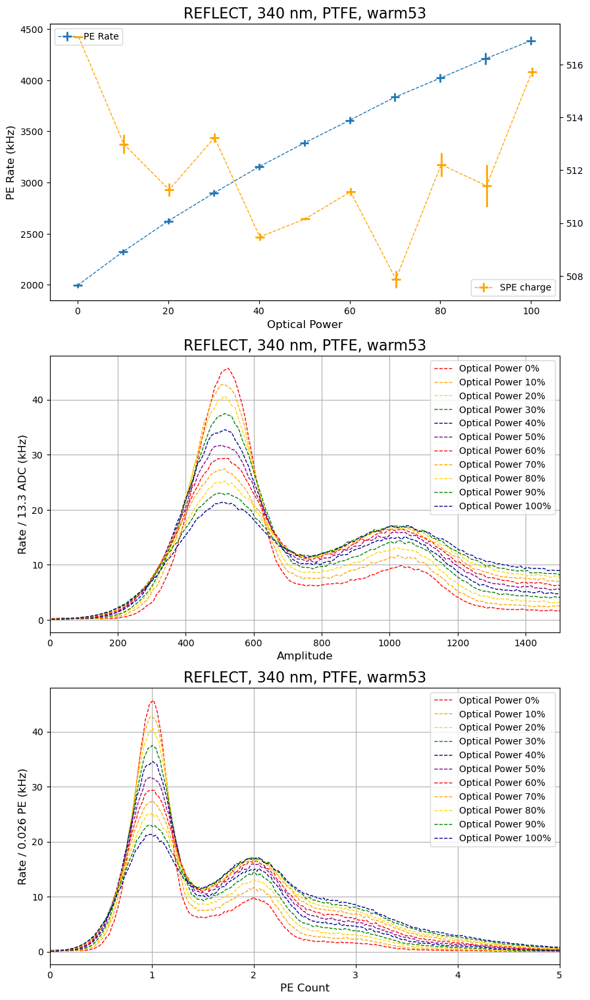

In [10]:
tic()
inputfile=np.load("../../REFLECT/runLAr.0/runLAr.0_results_warm53_340_empty.npz", allow_pickle=True)
material = "PTFE"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm53_empty_340 = result_dict['optical_power']
labels_run0_warm53_empty_340 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm53_empty_340]
SPE_charge_run0_warm53_empty_340 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm53_empty_340 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm53_empty_340 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm53_empty_340 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm53_empty_340 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm53_empty_340 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm53_empty_340"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 340 nm, {material}, warm53", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 340 nm, {material}, warm53", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 340 nm, {material}, warm53", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm53_empty_340)):
        optical_power_sorted[graphnum] = optical_power_run0_warm53_empty_340[np.argmin( abs(optical_power_run0_warm53_empty_340-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm53_empty_340[np.argmin( abs(optical_power_run0_warm53_empty_340-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm53_empty_340[np.argmin( abs(optical_power_run0_warm53_empty_340-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm53_empty_340[np.argmin( abs(optical_power_run0_warm53_empty_340-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm53_empty_340[np.argmin( abs(optical_power_run0_warm53_empty_340-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm53_empty_340, finger_plot_run0_warm53_empty_340[np.argmin( abs(optical_power_run0_warm53_empty_340-graphnum*10) )], #yerr=Darkwarm53Data[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm53_empty_340[np.argmin( abs(optical_power_run0_warm53_empty_340-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm53_empty_340/SPE_charge_sorted[graphnum], finger_plot_run0_warm53_empty_340[np.argmin( abs(optical_power_run0_warm53_empty_340-graphnum*10) )], #yerr=Darkwarm53Data[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm53_empty_340[np.argmin( abs(optical_power_run0_warm53_empty_340-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm53_empty_340 = 1*optical_power_sorted
SPE_charge_run0_warm53_empty_340 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm53_empty_340 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm53_empty_340 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm53_empty_340 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm53_empty_340, PE_rate_run0_warm53_empty_340, xerr=[1]*len(optical_power_run0_warm53_empty_340), yerr=PE_rate_uncertainty_run0_warm53_empty_340*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm53_empty_340+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm53_empty_340), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


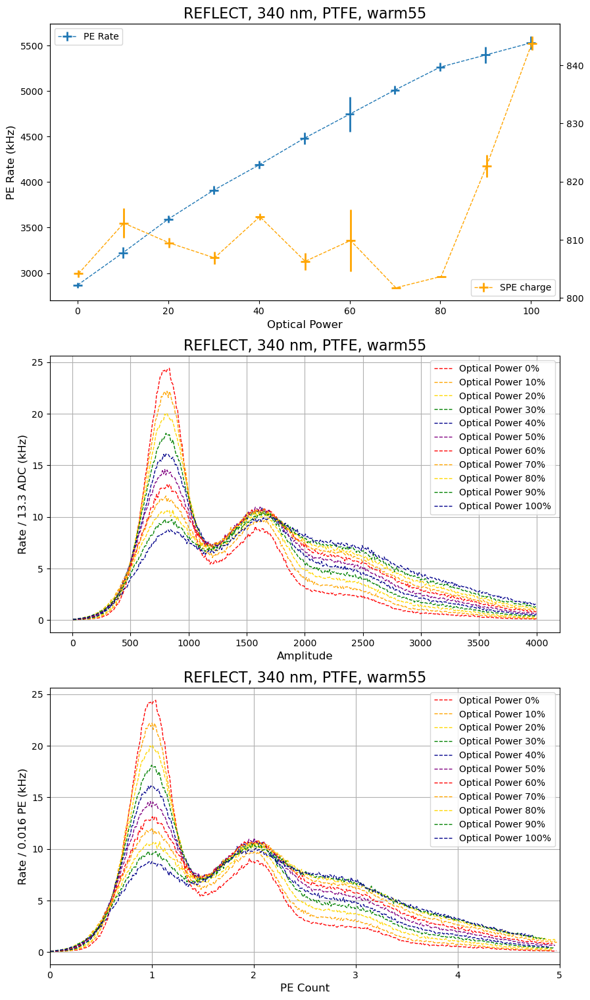

In [12]:
tic()
inputfile=np.load("../../REFLECT/runLAr.0/runLAr.0_results_warm55_340_empty.npz", allow_pickle=True)
material = "PTFE"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm55_empty_340 = result_dict['optical_power']
labels_run0_warm55_empty_340 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm55_empty_340]
SPE_charge_run0_warm55_empty_340 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm55_empty_340 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm55_empty_340 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm55_empty_340 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm55_empty_340 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm55_empty_340 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm55_empty_340"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 340 nm, {material}, warm55", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 340 nm, {material}, warm55", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 340 nm, {material}, warm55", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm55_empty_340)):
        optical_power_sorted[graphnum] = optical_power_run0_warm55_empty_340[np.argmin( abs(optical_power_run0_warm55_empty_340-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm55_empty_340[np.argmin( abs(optical_power_run0_warm55_empty_340-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm55_empty_340[np.argmin( abs(optical_power_run0_warm55_empty_340-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm55_empty_340[np.argmin( abs(optical_power_run0_warm55_empty_340-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm55_empty_340[np.argmin( abs(optical_power_run0_warm55_empty_340-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm55_empty_340, finger_plot_run0_warm55_empty_340[np.argmin( abs(optical_power_run0_warm55_empty_340-graphnum*10) )], #yerr=Darkwarm55Data[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm55_empty_340[np.argmin( abs(optical_power_run0_warm55_empty_340-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm55_empty_340/SPE_charge_sorted[graphnum], finger_plot_run0_warm55_empty_340[np.argmin( abs(optical_power_run0_warm55_empty_340-graphnum*10) )], #yerr=Darkwarm55Data[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm55_empty_340[np.argmin( abs(optical_power_run0_warm55_empty_340-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    #ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm55_empty_340 = 1*optical_power_sorted
SPE_charge_run0_warm55_empty_340 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm55_empty_340 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm55_empty_340 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm55_empty_340 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm55_empty_340, PE_rate_run0_warm55_empty_340, xerr=[1]*len(optical_power_run0_warm55_empty_340), yerr=PE_rate_uncertainty_run0_warm55_empty_340*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm55_empty_340+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm55_empty_340), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


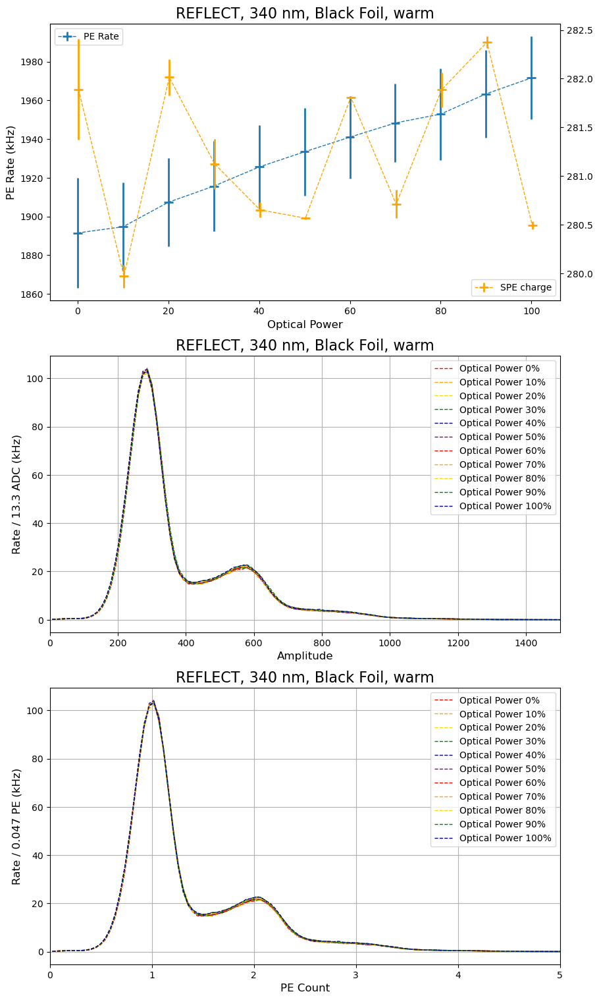

In [12]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_340_black.npz", allow_pickle=True)
material = "Black Foil"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_black_340 = result_dict['optical_power']
labels_run0_warm_black_340 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_black_340]
SPE_charge_run0_warm_black_340 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_black_340 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_black_340 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_black_340 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_black_340 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_black_340 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_black_340"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 340 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 340 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 340 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_black_340)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_black_340[np.argmin( abs(optical_power_run0_warm_black_340-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_black_340[np.argmin( abs(optical_power_run0_warm_black_340-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_black_340[np.argmin( abs(optical_power_run0_warm_black_340-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_black_340[np.argmin( abs(optical_power_run0_warm_black_340-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_black_340[np.argmin( abs(optical_power_run0_warm_black_340-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_black_340, finger_plot_run0_warm_black_340[np.argmin( abs(optical_power_run0_warm_black_340-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_black_340[np.argmin( abs(optical_power_run0_warm_black_340-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_black_340/SPE_charge_sorted[graphnum], finger_plot_run0_warm_black_340[np.argmin( abs(optical_power_run0_warm_black_340-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_black_340[np.argmin( abs(optical_power_run0_warm_black_340-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_black_340 = 1*optical_power_sorted
SPE_charge_run0_warm_black_340 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_black_340 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_black_340 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_black_340 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_black_340, PE_rate_run0_warm_black_340, xerr=[1]*len(optical_power_run0_warm_black_340), yerr=PE_rate_uncertainty_run0_warm_black_340*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_black_340+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_black_340), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


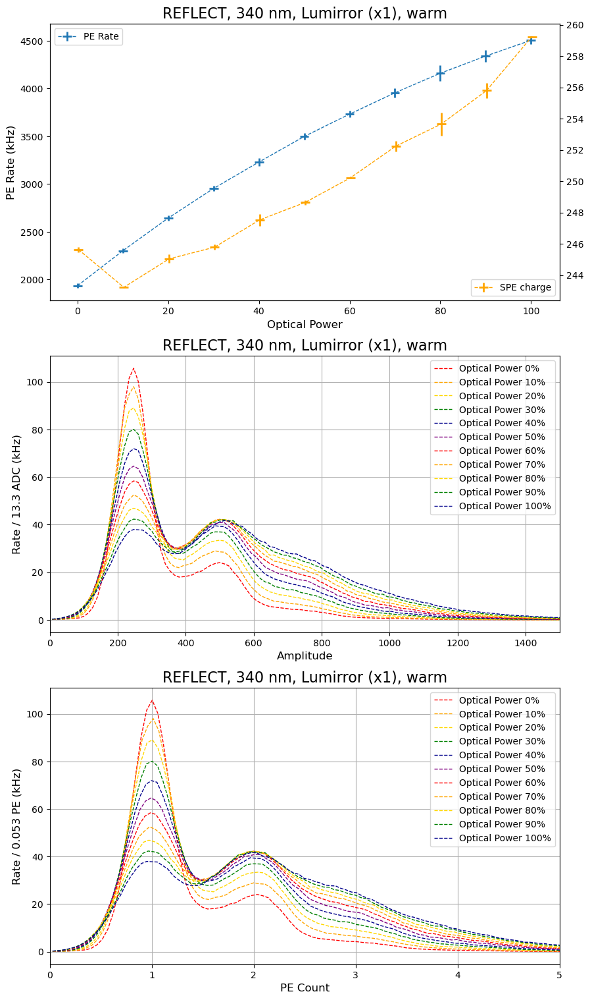

In [13]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_340_lum1.npz", allow_pickle=True)
material = "Lumirror (x1)"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_lum1_340 = result_dict['optical_power']
labels_run0_warm_lum1_340 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_lum1_340]
SPE_charge_run0_warm_lum1_340 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_lum1_340 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_lum1_340 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_lum1_340 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_lum1_340 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_lum1_340 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_lum1_340"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 340 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 340 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 340 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_lum1_340)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_lum1_340[np.argmin( abs(optical_power_run0_warm_lum1_340-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_lum1_340[np.argmin( abs(optical_power_run0_warm_lum1_340-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_lum1_340[np.argmin( abs(optical_power_run0_warm_lum1_340-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_lum1_340[np.argmin( abs(optical_power_run0_warm_lum1_340-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_lum1_340[np.argmin( abs(optical_power_run0_warm_lum1_340-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_lum1_340, finger_plot_run0_warm_lum1_340[np.argmin( abs(optical_power_run0_warm_lum1_340-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_lum1_340[np.argmin( abs(optical_power_run0_warm_lum1_340-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_lum1_340/SPE_charge_sorted[graphnum], finger_plot_run0_warm_lum1_340[np.argmin( abs(optical_power_run0_warm_lum1_340-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_lum1_340[np.argmin( abs(optical_power_run0_warm_lum1_340-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_lum1_340 = 1*optical_power_sorted
SPE_charge_run0_warm_lum1_340 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_lum1_340 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_lum1_340 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_lum1_340 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_lum1_340, PE_rate_run0_warm_lum1_340, xerr=[1]*len(optical_power_run0_warm_lum1_340), yerr=PE_rate_uncertainty_run0_warm_lum1_340*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_lum1_340+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_lum1_340), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


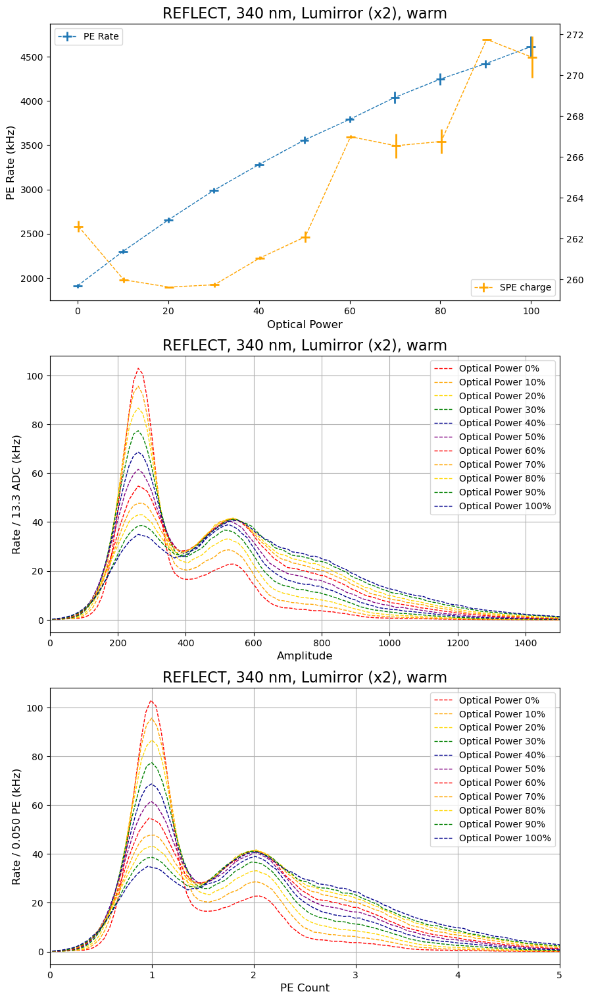

In [14]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_340_lum2.npz", allow_pickle=True)
material = "Lumirror (x2)"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_lum2_340 = result_dict['optical_power']
labels_run0_warm_lum2_340 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_lum2_340]
SPE_charge_run0_warm_lum2_340 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_lum2_340 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_lum2_340 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_lum2_340 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_lum2_340 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_lum2_340 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_lum2_340"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 340 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 340 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 340 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_lum2_340)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_lum2_340[np.argmin( abs(optical_power_run0_warm_lum2_340-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_lum2_340[np.argmin( abs(optical_power_run0_warm_lum2_340-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_lum2_340[np.argmin( abs(optical_power_run0_warm_lum2_340-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_lum2_340[np.argmin( abs(optical_power_run0_warm_lum2_340-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_lum2_340[np.argmin( abs(optical_power_run0_warm_lum2_340-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_lum2_340, finger_plot_run0_warm_lum2_340[np.argmin( abs(optical_power_run0_warm_lum2_340-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_lum2_340[np.argmin( abs(optical_power_run0_warm_lum2_340-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_lum2_340/SPE_charge_sorted[graphnum], finger_plot_run0_warm_lum2_340[np.argmin( abs(optical_power_run0_warm_lum2_340-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_lum2_340[np.argmin( abs(optical_power_run0_warm_lum2_340-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_lum2_340 = 1*optical_power_sorted
SPE_charge_run0_warm_lum2_340 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_lum2_340 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_lum2_340 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_lum2_340 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_lum2_340, PE_rate_run0_warm_lum2_340, xerr=[1]*len(optical_power_run0_warm_lum2_340), yerr=PE_rate_uncertainty_run0_warm_lum2_340*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_lum2_340+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_lum2_340), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


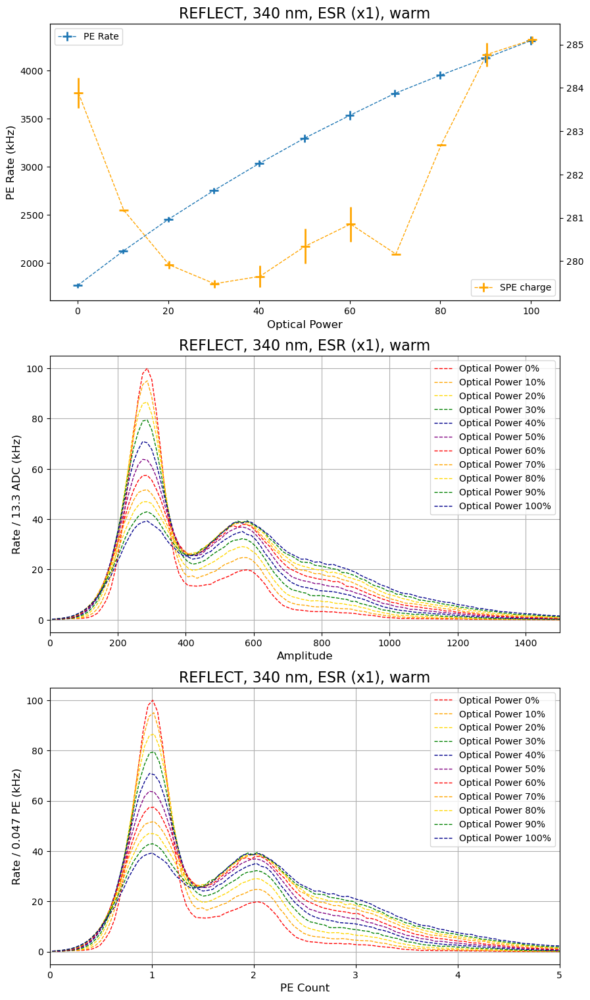

In [15]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_340_esr1.npz", allow_pickle=True)
material = "ESR (x1)"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_esr1_340 = result_dict['optical_power']
labels_run0_warm_esr1_340 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_esr1_340]
SPE_charge_run0_warm_esr1_340 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_esr1_340 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_esr1_340 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_esr1_340 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_esr1_340 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_esr1_340 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_esr1_340"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 340 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 340 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 340 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_esr1_340)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_esr1_340[np.argmin( abs(optical_power_run0_warm_esr1_340-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_esr1_340[np.argmin( abs(optical_power_run0_warm_esr1_340-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_esr1_340[np.argmin( abs(optical_power_run0_warm_esr1_340-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_esr1_340[np.argmin( abs(optical_power_run0_warm_esr1_340-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_esr1_340[np.argmin( abs(optical_power_run0_warm_esr1_340-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_esr1_340, finger_plot_run0_warm_esr1_340[np.argmin( abs(optical_power_run0_warm_esr1_340-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_esr1_340[np.argmin( abs(optical_power_run0_warm_esr1_340-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_esr1_340/SPE_charge_sorted[graphnum], finger_plot_run0_warm_esr1_340[np.argmin( abs(optical_power_run0_warm_esr1_340-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_esr1_340[np.argmin( abs(optical_power_run0_warm_esr1_340-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_esr1_340 = 1*optical_power_sorted
SPE_charge_run0_warm_esr1_340 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_esr1_340 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_esr1_340 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_esr1_340 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_esr1_340, PE_rate_run0_warm_esr1_340, xerr=[1]*len(optical_power_run0_warm_esr1_340), yerr=PE_rate_uncertainty_run0_warm_esr1_340*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_esr1_340+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_esr1_340), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


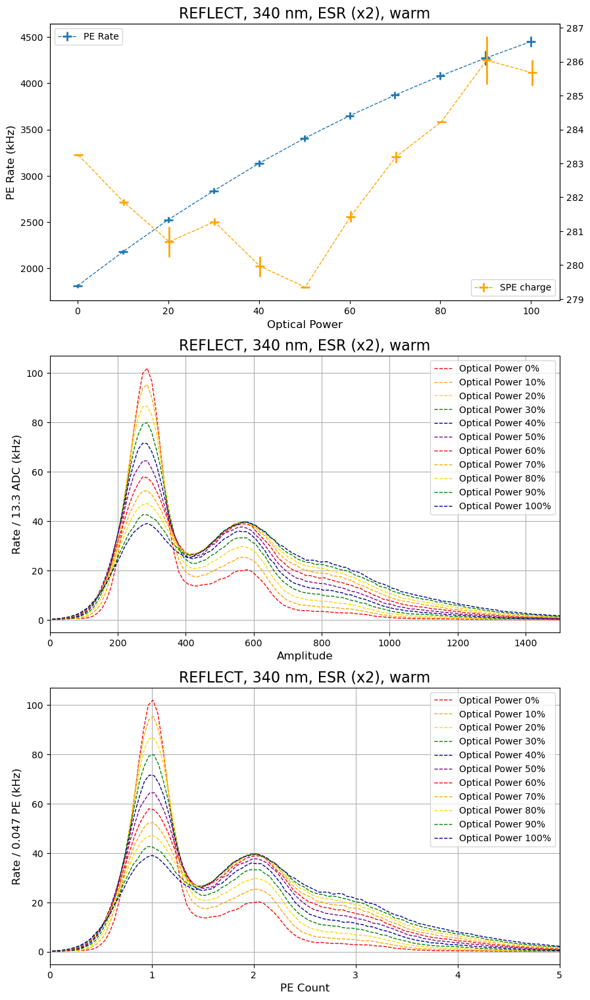

In [16]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_340_esr2.npz", allow_pickle=True)
material = "ESR (x2)"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_esr2_340 = result_dict['optical_power']
labels_run0_warm_esr2_340 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_esr2_340]
SPE_charge_run0_warm_esr2_340 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_esr2_340 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_esr2_340 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_esr2_340 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_esr2_340 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_esr2_340 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_esr2_340"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 340 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 340 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 340 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_esr2_340)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_esr2_340[np.argmin( abs(optical_power_run0_warm_esr2_340-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_esr2_340[np.argmin( abs(optical_power_run0_warm_esr2_340-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_esr2_340[np.argmin( abs(optical_power_run0_warm_esr2_340-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_esr2_340[np.argmin( abs(optical_power_run0_warm_esr2_340-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_esr2_340[np.argmin( abs(optical_power_run0_warm_esr2_340-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_esr2_340, finger_plot_run0_warm_esr2_340[np.argmin( abs(optical_power_run0_warm_esr2_340-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_esr2_340[np.argmin( abs(optical_power_run0_warm_esr2_340-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_esr2_340/SPE_charge_sorted[graphnum], finger_plot_run0_warm_esr2_340[np.argmin( abs(optical_power_run0_warm_esr2_340-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_esr2_340[np.argmin( abs(optical_power_run0_warm_esr2_340-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_esr2_340 = 1*optical_power_sorted
SPE_charge_run0_warm_esr2_340 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_esr2_340 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_esr2_340 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_esr2_340 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_esr2_340, PE_rate_run0_warm_esr2_340, xerr=[1]*len(optical_power_run0_warm_esr2_340), yerr=PE_rate_uncertainty_run0_warm_esr2_340*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_esr2_340+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_esr2_340), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


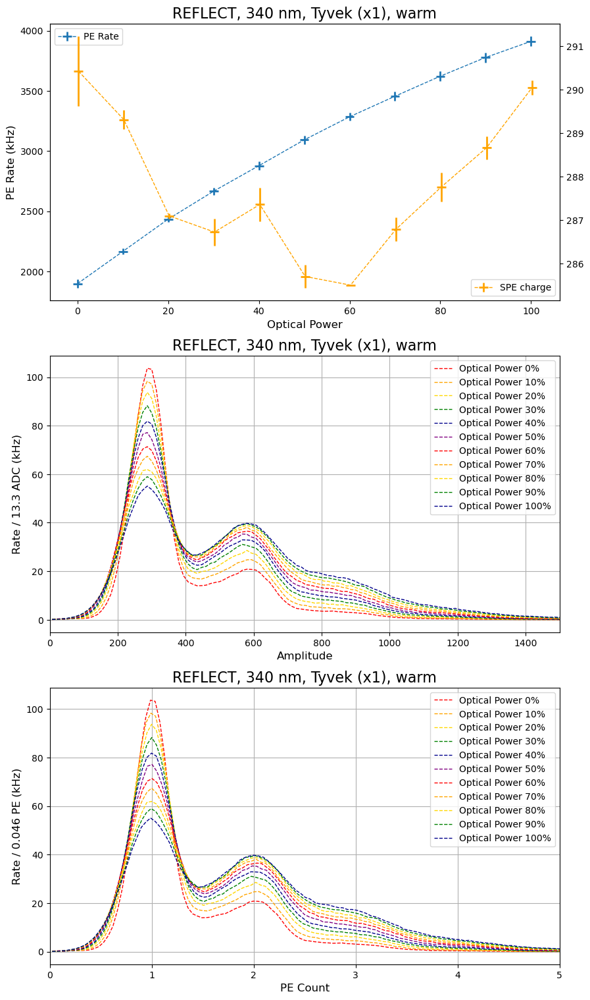

In [17]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_340_tyv1.npz", allow_pickle=True)
material = "Tyvek (x1)"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_tyv1_340 = result_dict['optical_power']
labels_run0_warm_tyv1_340 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_tyv1_340]
SPE_charge_run0_warm_tyv1_340 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_tyv1_340 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_tyv1_340 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_tyv1_340 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_tyv1_340 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_tyv1_340 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_tyv1_340"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 340 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 340 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 340 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_tyv1_340)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_tyv1_340[np.argmin( abs(optical_power_run0_warm_tyv1_340-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_tyv1_340[np.argmin( abs(optical_power_run0_warm_tyv1_340-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_tyv1_340[np.argmin( abs(optical_power_run0_warm_tyv1_340-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_tyv1_340[np.argmin( abs(optical_power_run0_warm_tyv1_340-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_tyv1_340[np.argmin( abs(optical_power_run0_warm_tyv1_340-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_tyv1_340, finger_plot_run0_warm_tyv1_340[np.argmin( abs(optical_power_run0_warm_tyv1_340-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_tyv1_340[np.argmin( abs(optical_power_run0_warm_tyv1_340-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_tyv1_340/SPE_charge_sorted[graphnum], finger_plot_run0_warm_tyv1_340[np.argmin( abs(optical_power_run0_warm_tyv1_340-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_tyv1_340[np.argmin( abs(optical_power_run0_warm_tyv1_340-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_tyv1_340 = 1*optical_power_sorted
SPE_charge_run0_warm_tyv1_340 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_tyv1_340 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_tyv1_340 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_tyv1_340 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_tyv1_340, PE_rate_run0_warm_tyv1_340, xerr=[1]*len(optical_power_run0_warm_tyv1_340), yerr=PE_rate_uncertainty_run0_warm_tyv1_340*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_tyv1_340+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_tyv1_340), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


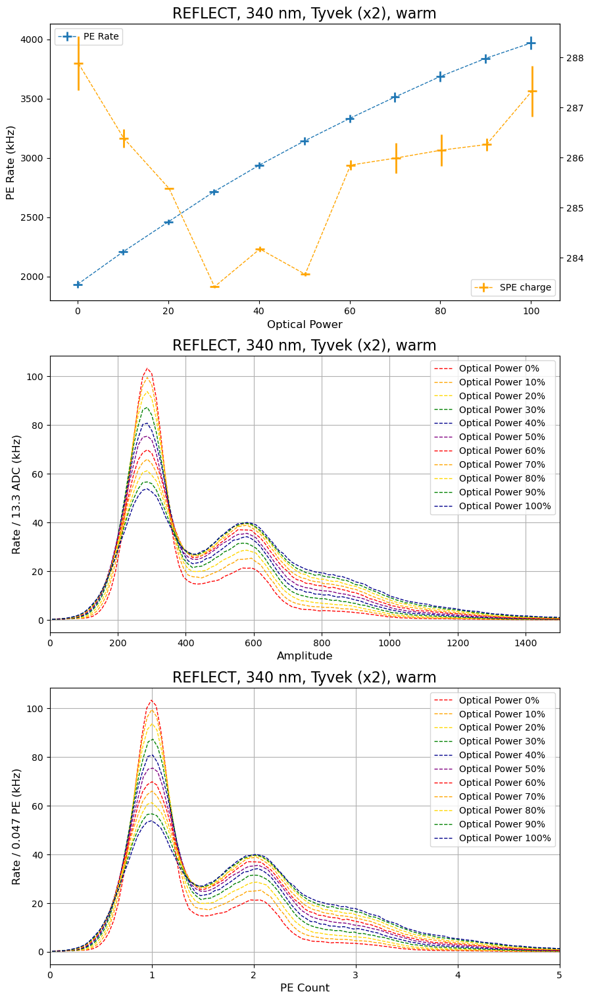

In [18]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_340_tyv2.npz", allow_pickle=True)
material = "Tyvek (x2)"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_tyv2_340 = result_dict['optical_power']
labels_run0_warm_tyv2_340 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_tyv2_340]
SPE_charge_run0_warm_tyv2_340 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_tyv2_340 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_tyv2_340 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_tyv2_340 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_tyv2_340 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_tyv2_340 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_tyv2_340"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 340 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 340 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 340 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_tyv2_340)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_tyv2_340[np.argmin( abs(optical_power_run0_warm_tyv2_340-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_tyv2_340[np.argmin( abs(optical_power_run0_warm_tyv2_340-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_tyv2_340[np.argmin( abs(optical_power_run0_warm_tyv2_340-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_tyv2_340[np.argmin( abs(optical_power_run0_warm_tyv2_340-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_tyv2_340[np.argmin( abs(optical_power_run0_warm_tyv2_340-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_tyv2_340, finger_plot_run0_warm_tyv2_340[np.argmin( abs(optical_power_run0_warm_tyv2_340-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_tyv2_340[np.argmin( abs(optical_power_run0_warm_tyv2_340-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_tyv2_340/SPE_charge_sorted[graphnum], finger_plot_run0_warm_tyv2_340[np.argmin( abs(optical_power_run0_warm_tyv2_340-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_tyv2_340[np.argmin( abs(optical_power_run0_warm_tyv2_340-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_tyv2_340 = 1*optical_power_sorted
SPE_charge_run0_warm_tyv2_340 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_tyv2_340 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_tyv2_340 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_tyv2_340 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_tyv2_340, PE_rate_run0_warm_tyv2_340, xerr=[1]*len(optical_power_run0_warm_tyv2_340), yerr=PE_rate_uncertainty_run0_warm_tyv2_340*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_tyv2_340+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_tyv2_340), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

### 395

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


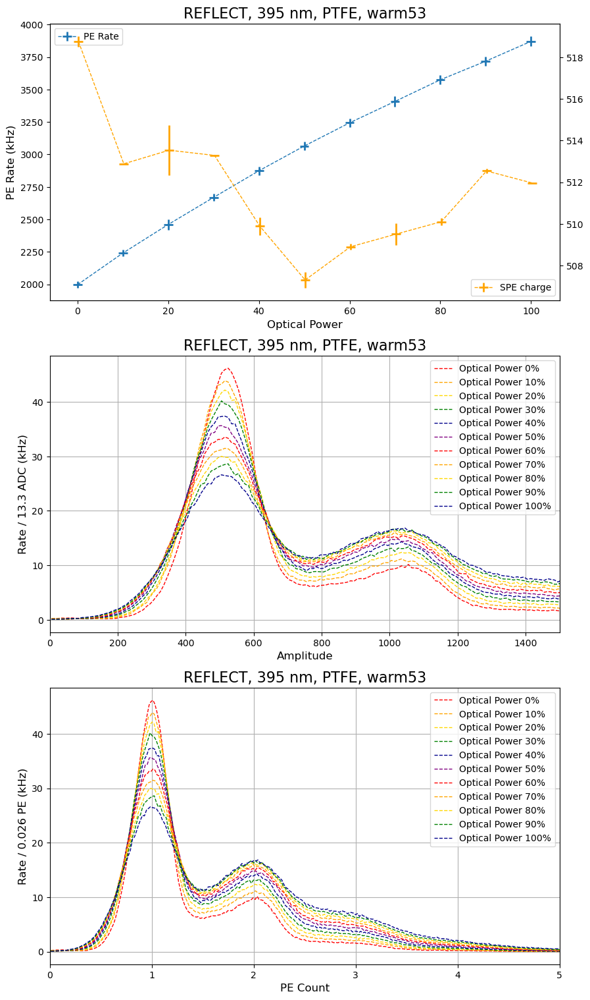

In [15]:
tic()
inputfile=np.load("../../REFLECT/runLAr.0/runLAr.0_results_warm53_395_empty.npz", allow_pickle=True)
material = "PTFE"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm53_empty_395 = result_dict['optical_power']
labels_run0_warm53_empty_395 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm53_empty_395]
SPE_charge_run0_warm53_empty_395 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm53_empty_395 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm53_empty_395 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm53_empty_395 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm53_empty_395 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm53_empty_395 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm53_empty_395"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 395 nm, {material}, warm53", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 395 nm, {material}, warm53", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 395 nm, {material}, warm53", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm53_empty_395)):
        optical_power_sorted[graphnum] = optical_power_run0_warm53_empty_395[np.argmin( abs(optical_power_run0_warm53_empty_395-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm53_empty_395[np.argmin( abs(optical_power_run0_warm53_empty_395-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm53_empty_395[np.argmin( abs(optical_power_run0_warm53_empty_395-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm53_empty_395[np.argmin( abs(optical_power_run0_warm53_empty_395-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm53_empty_395[np.argmin( abs(optical_power_run0_warm53_empty_395-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm53_empty_395, finger_plot_run0_warm53_empty_395[np.argmin( abs(optical_power_run0_warm53_empty_395-graphnum*10) )], #yerr=Darkwarm53Data[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm53_empty_395[np.argmin( abs(optical_power_run0_warm53_empty_395-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm53_empty_395/SPE_charge_sorted[graphnum], finger_plot_run0_warm53_empty_395[np.argmin( abs(optical_power_run0_warm53_empty_395-graphnum*10) )], #yerr=Darkwarm53Data[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm53_empty_395[np.argmin( abs(optical_power_run0_warm53_empty_395-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm53_empty_395 = 1*optical_power_sorted
SPE_charge_run0_warm53_empty_395 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm53_empty_395 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm53_empty_395 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm53_empty_395 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm53_empty_395, PE_rate_run0_warm53_empty_395, xerr=[1]*len(optical_power_run0_warm53_empty_395), yerr=PE_rate_uncertainty_run0_warm53_empty_395*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm53_empty_395+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm53_empty_395), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


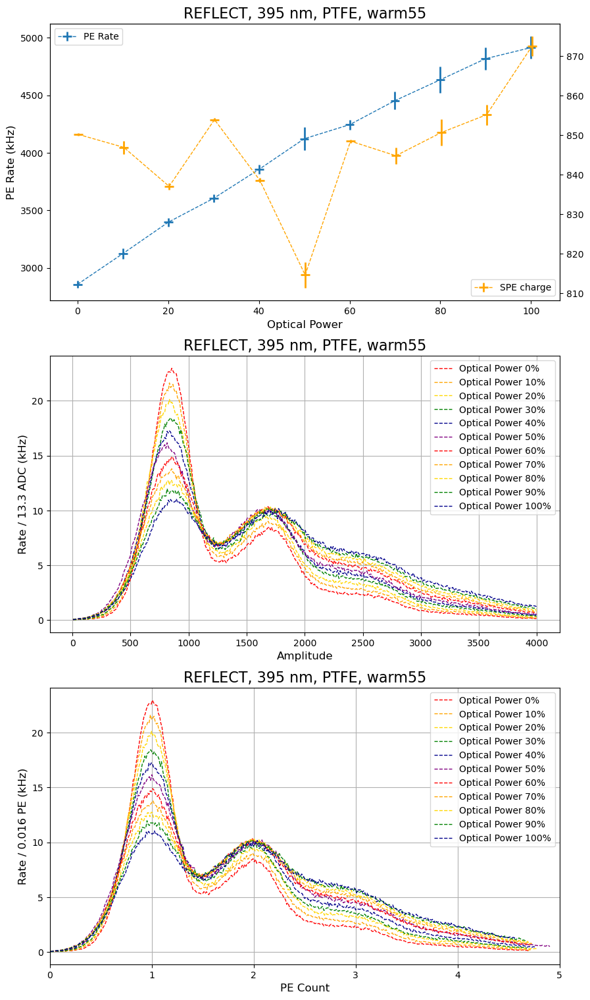

In [14]:
tic()
inputfile=np.load("../../REFLECT/runLAr.0/runLAr.0_results_warm55_395_empty.npz", allow_pickle=True)
material = "PTFE"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm55_empty_395 = result_dict['optical_power']
labels_run0_warm55_empty_395 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm55_empty_395]
SPE_charge_run0_warm55_empty_395 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm55_empty_395 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm55_empty_395 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm55_empty_395 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm55_empty_395 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm55_empty_395 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm55_empty_395"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 395 nm, {material}, warm55", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 395 nm, {material}, warm55", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 395 nm, {material}, warm55", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm55_empty_395)):
        optical_power_sorted[graphnum] = optical_power_run0_warm55_empty_395[np.argmin( abs(optical_power_run0_warm55_empty_395-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm55_empty_395[np.argmin( abs(optical_power_run0_warm55_empty_395-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm55_empty_395[np.argmin( abs(optical_power_run0_warm55_empty_395-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm55_empty_395[np.argmin( abs(optical_power_run0_warm55_empty_395-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm55_empty_395[np.argmin( abs(optical_power_run0_warm55_empty_395-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm55_empty_395, finger_plot_run0_warm55_empty_395[np.argmin( abs(optical_power_run0_warm55_empty_395-graphnum*10) )], #yerr=Darkwarm55Data[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm55_empty_395[np.argmin( abs(optical_power_run0_warm55_empty_395-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm55_empty_395/SPE_charge_sorted[graphnum], finger_plot_run0_warm55_empty_395[np.argmin( abs(optical_power_run0_warm55_empty_395-graphnum*10) )], #yerr=Darkwarm55Data[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm55_empty_395[np.argmin( abs(optical_power_run0_warm55_empty_395-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    #ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm55_empty_395 = 1*optical_power_sorted
SPE_charge_run0_warm55_empty_395 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm55_empty_395 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm55_empty_395 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm55_empty_395 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm55_empty_395, PE_rate_run0_warm55_empty_395, xerr=[1]*len(optical_power_run0_warm55_empty_395), yerr=PE_rate_uncertainty_run0_warm55_empty_395*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm55_empty_395+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm55_empty_395), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


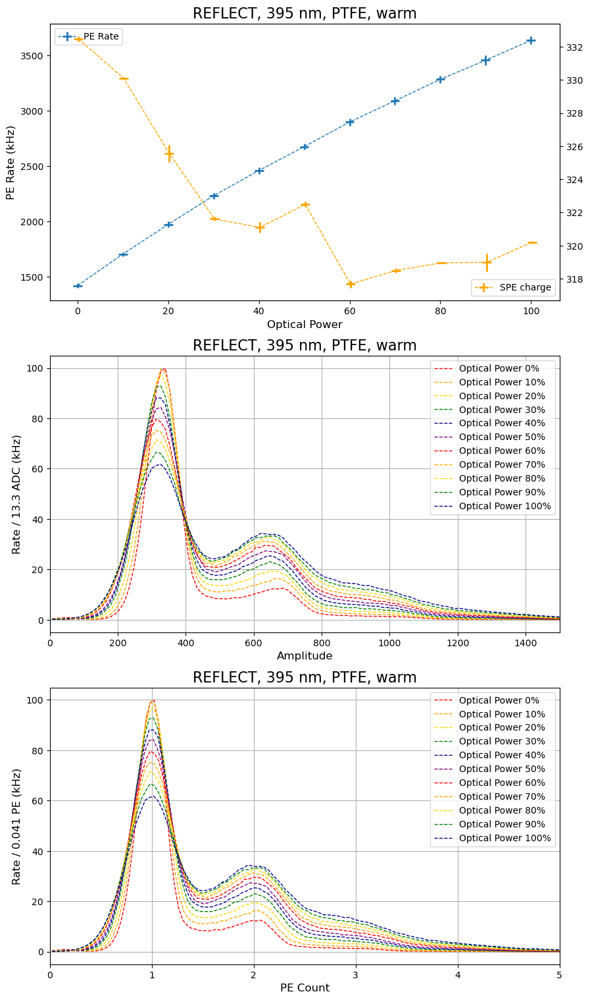

In [54]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLar.0.1_results_warm_395_empty.npz", allow_pickle=True)
material = "PTFE"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_21_warm_empty_395 = result_dict['optical_power']
labels_21_warm_empty_395 = ['Optical Power '+str(power)+'%' for power in optical_power_21_warm_empty_395]
SPE_charge_21_warm_empty_395 = result_dict['SPE_charge']
SPE_charge_uncertainty_21_warm_empty_395 = result_dict['SPE_charge_uncertainty']
PE_rate_21_warm_empty_395 = result_dict['PE_rate']
PE_rate_uncertainty_21_warm_empty_395 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_21_warm_empty_395 = result_dict['finger_plot_amplitude']
finger_plot_21_warm_empty_395 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_21_warm_empty_395"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 395 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 395 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 395 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_21_warm_empty_395)):
        optical_power_sorted[graphnum] = optical_power_21_warm_empty_395[np.argmin( abs(optical_power_21_warm_empty_395-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_21_warm_empty_395[np.argmin( abs(optical_power_21_warm_empty_395-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_21_warm_empty_395[np.argmin( abs(optical_power_21_warm_empty_395-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_21_warm_empty_395[np.argmin( abs(optical_power_21_warm_empty_395-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_21_warm_empty_395[np.argmin( abs(optical_power_21_warm_empty_395-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_21_warm_empty_395, finger_plot_21_warm_empty_395[np.argmin( abs(optical_power_21_warm_empty_395-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_21_warm_empty_395[np.argmin( abs(optical_power_21_warm_empty_395-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_21_warm_empty_395/SPE_charge_sorted[graphnum], finger_plot_21_warm_empty_395[np.argmin( abs(optical_power_21_warm_empty_395-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_21_warm_empty_395[np.argmin( abs(optical_power_21_warm_empty_395-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_21_warm_empty_395 = 1*optical_power_sorted
SPE_charge_21_warm_empty_395 = 1*SPE_charge_sorted
SPE_charge_uncertainty_21_warm_empty_395 = 1*SPE_charge_uncertainty_sorted
PE_rate_21_warm_empty_395 = 1*PE_rate_sorted
PE_rate_uncertainty_21_warm_empty_395 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_21_warm_empty_395, PE_rate_21_warm_empty_395, xerr=[1]*len(optical_power_21_warm_empty_395), yerr=PE_rate_uncertainty_21_warm_empty_395*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_21_warm_empty_395+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_21_warm_empty_395), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


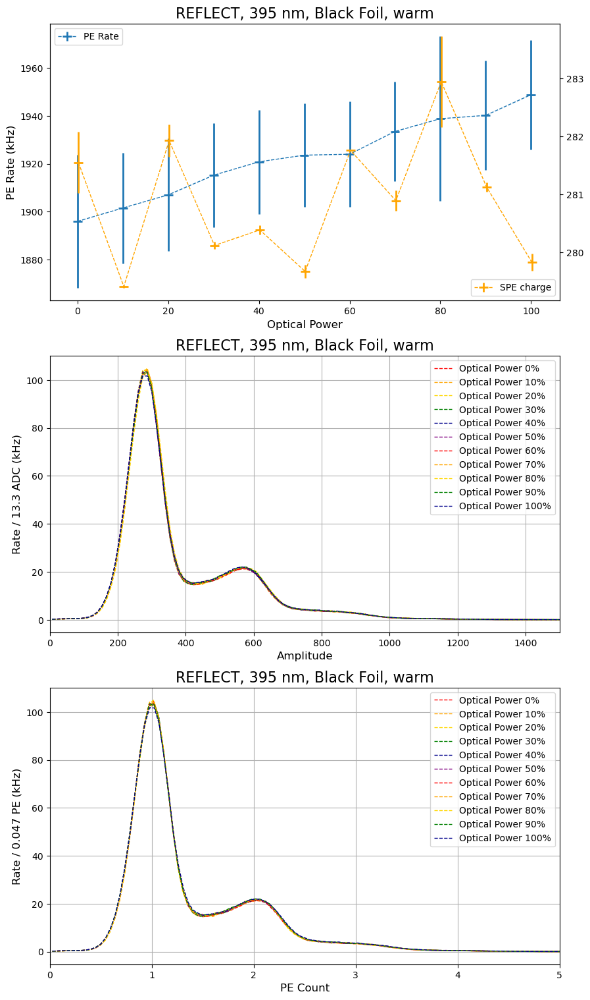

In [20]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_395_black.npz", allow_pickle=True)
material = "Black Foil"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_black_395 = result_dict['optical_power']
labels_run0_warm_black_395 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_black_395]
SPE_charge_run0_warm_black_395 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_black_395 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_black_395 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_black_395 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_black_395 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_black_395 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_black_395"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 395 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 395 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 395 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_black_395)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_black_395[np.argmin( abs(optical_power_run0_warm_black_395-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_black_395[np.argmin( abs(optical_power_run0_warm_black_395-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_black_395[np.argmin( abs(optical_power_run0_warm_black_395-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_black_395[np.argmin( abs(optical_power_run0_warm_black_395-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_black_395[np.argmin( abs(optical_power_run0_warm_black_395-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_black_395, finger_plot_run0_warm_black_395[np.argmin( abs(optical_power_run0_warm_black_395-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_black_395[np.argmin( abs(optical_power_run0_warm_black_395-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_black_395/SPE_charge_sorted[graphnum], finger_plot_run0_warm_black_395[np.argmin( abs(optical_power_run0_warm_black_395-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_black_395[np.argmin( abs(optical_power_run0_warm_black_395-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_black_395 = 1*optical_power_sorted
SPE_charge_run0_warm_black_395 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_black_395 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_black_395 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_black_395 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_black_395, PE_rate_run0_warm_black_395, xerr=[1]*len(optical_power_run0_warm_black_395), yerr=PE_rate_uncertainty_run0_warm_black_395*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_black_395+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_black_395), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


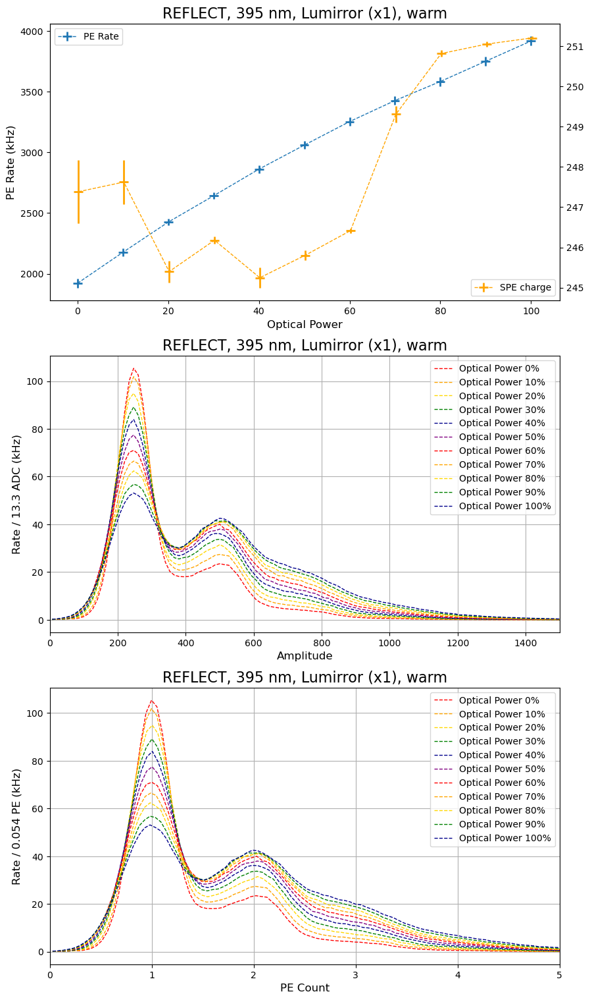

In [21]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_395_lum1.npz", allow_pickle=True)
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_lum1_395 = result_dict['optical_power']
labels_run0_warm_lum1_395 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_lum1_395]
SPE_charge_run0_warm_lum1_395 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_lum1_395 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_lum1_395 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_lum1_395 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_lum1_395 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_lum1_395 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_lum1_395"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title("REFLECT, 395 nm, Lumirror (x1), warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title("REFLECT, 395 nm, Lumirror (x1), warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title("REFLECT, 395 nm, Lumirror (x1), warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_lum1_395)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_lum1_395[np.argmin( abs(optical_power_run0_warm_lum1_395-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_lum1_395[np.argmin( abs(optical_power_run0_warm_lum1_395-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_lum1_395[np.argmin( abs(optical_power_run0_warm_lum1_395-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_lum1_395[np.argmin( abs(optical_power_run0_warm_lum1_395-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_lum1_395[np.argmin( abs(optical_power_run0_warm_lum1_395-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_lum1_395, finger_plot_run0_warm_lum1_395[np.argmin( abs(optical_power_run0_warm_lum1_395-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_lum1_395[np.argmin( abs(optical_power_run0_warm_lum1_395-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_lum1_395/SPE_charge_sorted[graphnum], finger_plot_run0_warm_lum1_395[np.argmin( abs(optical_power_run0_warm_lum1_395-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_lum1_395[np.argmin( abs(optical_power_run0_warm_lum1_395-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_lum1_395 = 1*optical_power_sorted
SPE_charge_run0_warm_lum1_395 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_lum1_395 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_lum1_395 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_lum1_395 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_lum1_395, PE_rate_run0_warm_lum1_395, xerr=[1]*len(optical_power_run0_warm_lum1_395), yerr=PE_rate_uncertainty_run0_warm_lum1_395*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_lum1_395+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_lum1_395), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


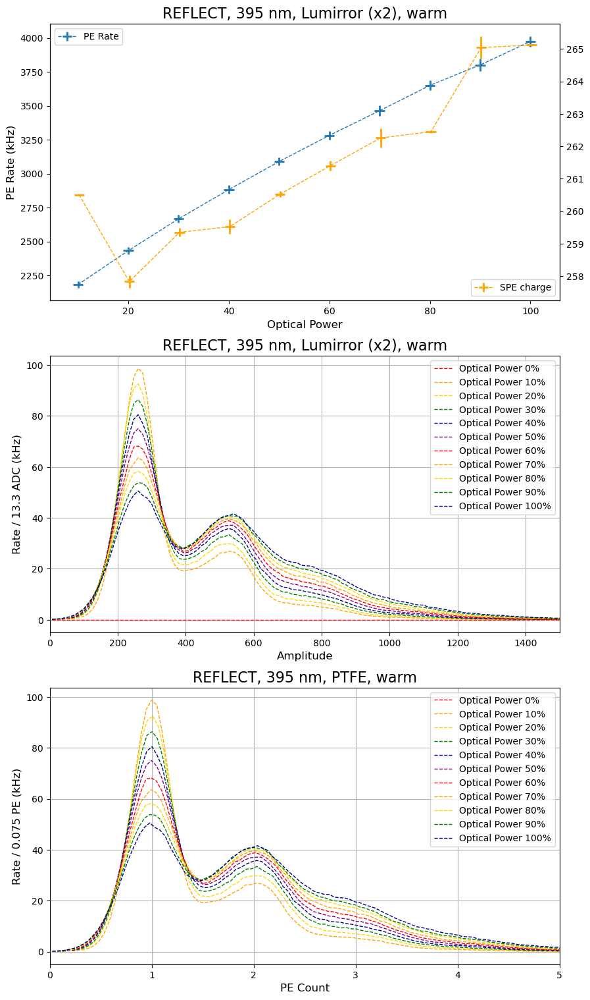

In [22]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_395_lum2.npz", allow_pickle=True)
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_lum2_395 = result_dict['optical_power']
labels_run0_warm_lum2_395 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_lum2_395]
SPE_charge_run0_warm_lum2_395 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_lum2_395 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_lum2_395 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_lum2_395 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_lum2_395 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_lum2_395 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_lum2_395"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title("REFLECT, 395 nm, Lumirror (x2), warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title("REFLECT, 395 nm, Lumirror (x2), warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title("REFLECT, 395 nm, PTFE, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_lum2_395)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_lum2_395[np.argmin( abs(optical_power_run0_warm_lum2_395-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_lum2_395[np.argmin( abs(optical_power_run0_warm_lum2_395-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_lum2_395[np.argmin( abs(optical_power_run0_warm_lum2_395-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_lum2_395[np.argmin( abs(optical_power_run0_warm_lum2_395-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_lum2_395[np.argmin( abs(optical_power_run0_warm_lum2_395-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_lum2_395, finger_plot_run0_warm_lum2_395[np.argmin( abs(optical_power_run0_warm_lum2_395-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_lum2_395[np.argmin( abs(optical_power_run0_warm_lum2_395-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_lum2_395/SPE_charge_sorted[graphnum], finger_plot_run0_warm_lum2_395[np.argmin( abs(optical_power_run0_warm_lum2_395-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_lum2_395[np.argmin( abs(optical_power_run0_warm_lum2_395-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_lum2_395 = 1*optical_power_sorted
SPE_charge_run0_warm_lum2_395 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_lum2_395 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_lum2_395 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_lum2_395 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_lum2_395, PE_rate_run0_warm_lum2_395, xerr=[1]*len(optical_power_run0_warm_lum2_395), yerr=PE_rate_uncertainty_run0_warm_lum2_395*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_lum2_395+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_lum2_395), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


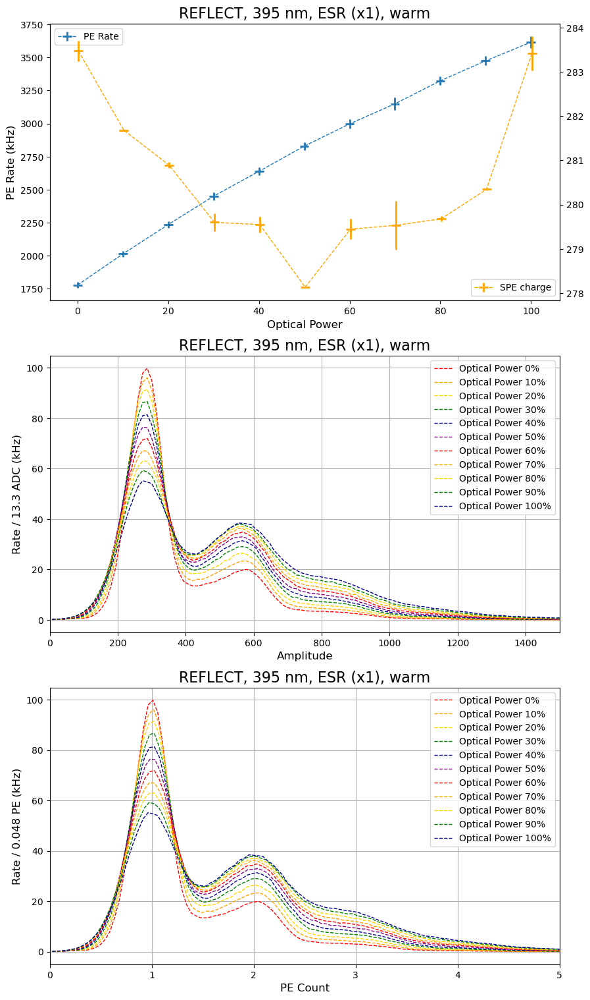

In [23]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_395_esr1.npz", allow_pickle=True)
material = "ESR (x1)"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_esr1_395 = result_dict['optical_power']
labels_run0_warm_esr1_395 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_esr1_395]
SPE_charge_run0_warm_esr1_395 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_esr1_395 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_esr1_395 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_esr1_395 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_esr1_395 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_esr1_395 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_esr1_395"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 395 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 395 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 395 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_esr1_395)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_esr1_395[np.argmin( abs(optical_power_run0_warm_esr1_395-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_esr1_395[np.argmin( abs(optical_power_run0_warm_esr1_395-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_esr1_395[np.argmin( abs(optical_power_run0_warm_esr1_395-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_esr1_395[np.argmin( abs(optical_power_run0_warm_esr1_395-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_esr1_395[np.argmin( abs(optical_power_run0_warm_esr1_395-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_esr1_395, finger_plot_run0_warm_esr1_395[np.argmin( abs(optical_power_run0_warm_esr1_395-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_esr1_395[np.argmin( abs(optical_power_run0_warm_esr1_395-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_esr1_395/SPE_charge_sorted[graphnum], finger_plot_run0_warm_esr1_395[np.argmin( abs(optical_power_run0_warm_esr1_395-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_esr1_395[np.argmin( abs(optical_power_run0_warm_esr1_395-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_esr1_395 = 1*optical_power_sorted
SPE_charge_run0_warm_esr1_395 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_esr1_395 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_esr1_395 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_esr1_395 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_esr1_395, PE_rate_run0_warm_esr1_395, xerr=[1]*len(optical_power_run0_warm_esr1_395), yerr=PE_rate_uncertainty_run0_warm_esr1_395*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_esr1_395+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_esr1_395), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


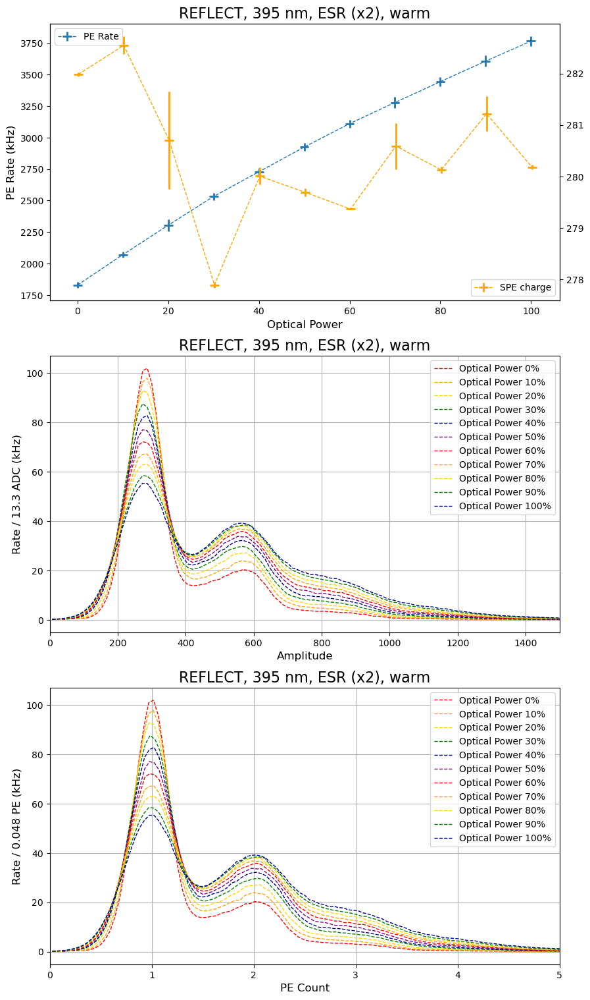

In [45]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_395_esr2.npz", allow_pickle=True)
material = "ESR (x2)"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_esr2_395 = result_dict['optical_power']
labels_run0_warm_esr2_395 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_esr2_395]
SPE_charge_run0_warm_esr2_395 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_esr2_395 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_esr2_395 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_esr2_395 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_esr2_395 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_esr2_395 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_esr2_395"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 395 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 395 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 395 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_esr2_395)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_esr2_395[np.argmin( abs(optical_power_run0_warm_esr2_395-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_esr2_395[np.argmin( abs(optical_power_run0_warm_esr2_395-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_esr2_395[np.argmin( abs(optical_power_run0_warm_esr2_395-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_esr2_395[np.argmin( abs(optical_power_run0_warm_esr2_395-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_esr2_395[np.argmin( abs(optical_power_run0_warm_esr2_395-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_esr2_395, finger_plot_run0_warm_esr2_395[np.argmin( abs(optical_power_run0_warm_esr2_395-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_esr2_395[np.argmin( abs(optical_power_run0_warm_esr2_395-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_esr2_395/SPE_charge_sorted[graphnum], finger_plot_run0_warm_esr2_395[np.argmin( abs(optical_power_run0_warm_esr2_395-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_esr2_395[np.argmin( abs(optical_power_run0_warm_esr2_395-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_esr2_395 = 1*optical_power_sorted
SPE_charge_run0_warm_esr2_395 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_esr2_395 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_esr2_395 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_esr2_395 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_esr2_395, PE_rate_run0_warm_esr2_395, xerr=[1]*len(optical_power_run0_warm_esr2_395), yerr=PE_rate_uncertainty_run0_warm_esr2_395*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_esr2_395+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_esr2_395), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


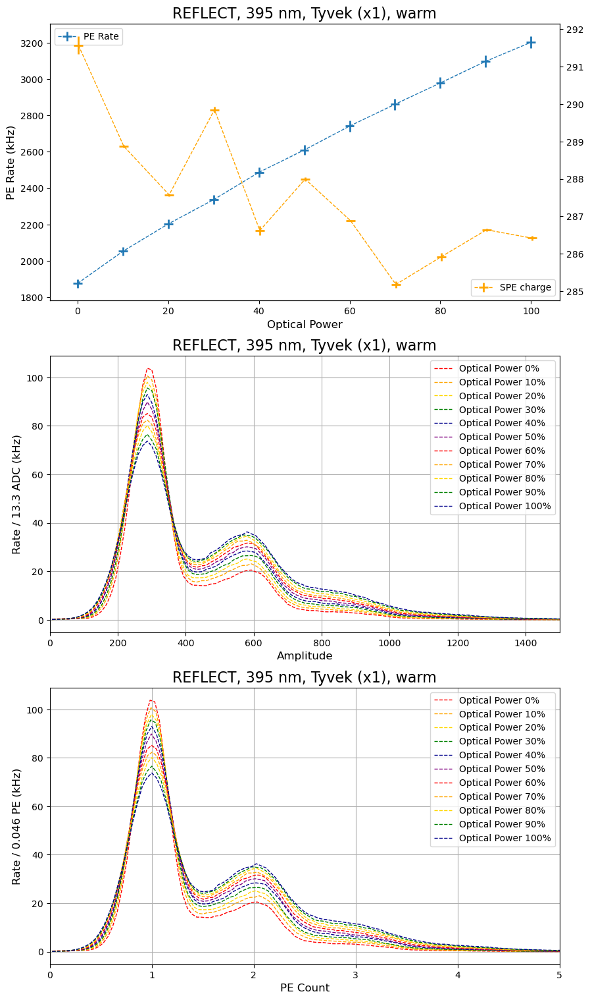

In [46]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_395_tyv1.npz", allow_pickle=True)
material = "Tyvek (x1)"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_tyv1_395 = result_dict['optical_power']
labels_run0_warm_tyv1_395 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_tyv1_395]
SPE_charge_run0_warm_tyv1_395 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_tyv1_395 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_tyv1_395 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_tyv1_395 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_tyv1_395 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_tyv1_395 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_tyv1_395"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 395 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 395 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 395 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_tyv1_395)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_tyv1_395[np.argmin( abs(optical_power_run0_warm_tyv1_395-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_tyv1_395[np.argmin( abs(optical_power_run0_warm_tyv1_395-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_tyv1_395[np.argmin( abs(optical_power_run0_warm_tyv1_395-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_tyv1_395[np.argmin( abs(optical_power_run0_warm_tyv1_395-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_tyv1_395[np.argmin( abs(optical_power_run0_warm_tyv1_395-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_tyv1_395, finger_plot_run0_warm_tyv1_395[np.argmin( abs(optical_power_run0_warm_tyv1_395-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_tyv1_395[np.argmin( abs(optical_power_run0_warm_tyv1_395-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_tyv1_395/SPE_charge_sorted[graphnum], finger_plot_run0_warm_tyv1_395[np.argmin( abs(optical_power_run0_warm_tyv1_395-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_tyv1_395[np.argmin( abs(optical_power_run0_warm_tyv1_395-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_tyv1_395 = 1*optical_power_sorted
SPE_charge_run0_warm_tyv1_395 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_tyv1_395 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_tyv1_395 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_tyv1_395 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_tyv1_395, PE_rate_run0_warm_tyv1_395, xerr=[1]*len(optical_power_run0_warm_tyv1_395), yerr=PE_rate_uncertainty_run0_warm_tyv1_395*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_tyv1_395+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_tyv1_395), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


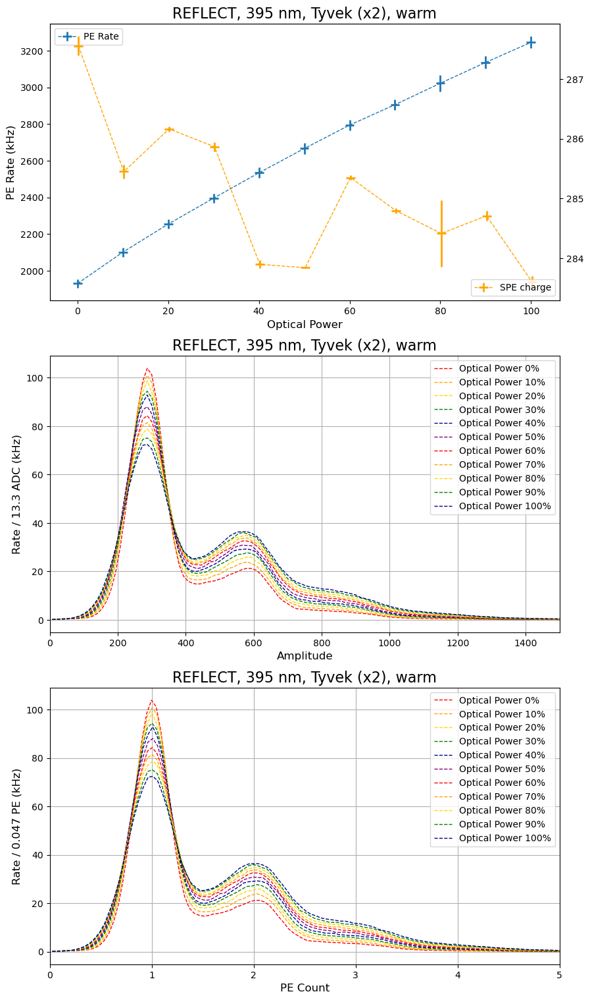

In [47]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_395_tyv2.npz", allow_pickle=True)
material = "Tyvek (x2)"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_tyv2_395 = result_dict['optical_power']
labels_run0_warm_tyv2_395 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_tyv2_395]
SPE_charge_run0_warm_tyv2_395 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_tyv2_395 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_tyv2_395 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_tyv2_395 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_tyv2_395 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_tyv2_395 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_tyv2_395"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 395 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 395 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 395 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_tyv2_395)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_tyv2_395[np.argmin( abs(optical_power_run0_warm_tyv2_395-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_tyv2_395[np.argmin( abs(optical_power_run0_warm_tyv2_395-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_tyv2_395[np.argmin( abs(optical_power_run0_warm_tyv2_395-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_tyv2_395[np.argmin( abs(optical_power_run0_warm_tyv2_395-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_tyv2_395[np.argmin( abs(optical_power_run0_warm_tyv2_395-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_tyv2_395, finger_plot_run0_warm_tyv2_395[np.argmin( abs(optical_power_run0_warm_tyv2_395-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_tyv2_395[np.argmin( abs(optical_power_run0_warm_tyv2_395-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_tyv2_395/SPE_charge_sorted[graphnum], finger_plot_run0_warm_tyv2_395[np.argmin( abs(optical_power_run0_warm_tyv2_395-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_tyv2_395[np.argmin( abs(optical_power_run0_warm_tyv2_395-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_tyv2_395 = 1*optical_power_sorted
SPE_charge_run0_warm_tyv2_395 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_tyv2_395 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_tyv2_395 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_tyv2_395 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_tyv2_395, PE_rate_run0_warm_tyv2_395, xerr=[1]*len(optical_power_run0_warm_tyv2_395), yerr=PE_rate_uncertainty_run0_warm_tyv2_395*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_tyv2_395+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_tyv2_395), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

### 470

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


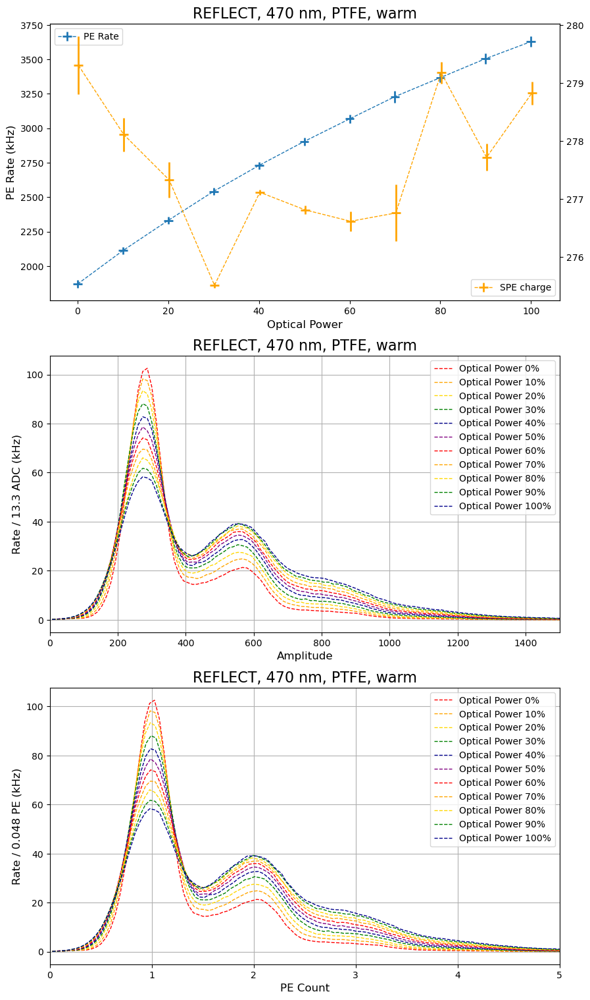

In [25]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_470_empty.npz", allow_pickle=True)
material = "PTFE"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_empty_470 = result_dict['optical_power']
labels_run0_warm_empty_470 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_empty_470]
SPE_charge_run0_warm_empty_470 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_empty_470 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_empty_470 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_empty_470 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_empty_470 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_empty_470 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_empty_470"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_empty_470)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_empty_470[np.argmin( abs(optical_power_run0_warm_empty_470-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_empty_470[np.argmin( abs(optical_power_run0_warm_empty_470-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_empty_470[np.argmin( abs(optical_power_run0_warm_empty_470-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_empty_470[np.argmin( abs(optical_power_run0_warm_empty_470-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_empty_470[np.argmin( abs(optical_power_run0_warm_empty_470-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_empty_470, finger_plot_run0_warm_empty_470[np.argmin( abs(optical_power_run0_warm_empty_470-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_empty_470[np.argmin( abs(optical_power_run0_warm_empty_470-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_empty_470/SPE_charge_sorted[graphnum], finger_plot_run0_warm_empty_470[np.argmin( abs(optical_power_run0_warm_empty_470-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_empty_470[np.argmin( abs(optical_power_run0_warm_empty_470-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_empty_470 = 1*optical_power_sorted
SPE_charge_run0_warm_empty_470 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_empty_470 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_empty_470 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_empty_470 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_empty_470, PE_rate_run0_warm_empty_470, xerr=[1]*len(optical_power_run0_warm_empty_470), yerr=PE_rate_uncertainty_run0_warm_empty_470*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_empty_470+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_empty_470), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


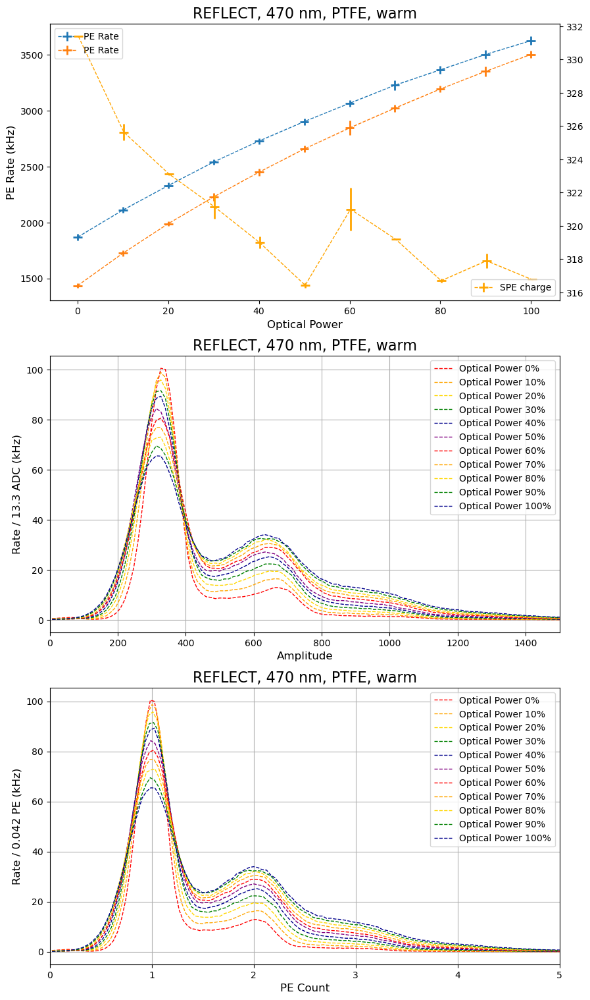

In [67]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLar.0.1_results_warm_470_empty.npz", allow_pickle=True)
material = "PTFE"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_21_warm_empty_470 = result_dict['optical_power']
labels_21_warm_empty_470 = ['Optical Power '+str(power)+'%' for power in optical_power_21_warm_empty_470]
SPE_charge_21_warm_empty_470 = result_dict['SPE_charge']
SPE_charge_uncertainty_21_warm_empty_470 = result_dict['SPE_charge_uncertainty']
PE_rate_21_warm_empty_470 = result_dict['PE_rate']
PE_rate_uncertainty_21_warm_empty_470 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_21_warm_empty_470 = result_dict['finger_plot_amplitude']
finger_plot_21_warm_empty_470 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_21_warm_empty_470"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_21_warm_empty_470)):
        optical_power_sorted[graphnum] = optical_power_21_warm_empty_470[np.argmin( abs(optical_power_21_warm_empty_470-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_21_warm_empty_470[np.argmin( abs(optical_power_21_warm_empty_470-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_21_warm_empty_470[np.argmin( abs(optical_power_21_warm_empty_470-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_21_warm_empty_470[np.argmin( abs(optical_power_21_warm_empty_470-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_21_warm_empty_470[np.argmin( abs(optical_power_21_warm_empty_470-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_21_warm_empty_470, finger_plot_21_warm_empty_470[np.argmin( abs(optical_power_21_warm_empty_470-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_21_warm_empty_470[np.argmin( abs(optical_power_21_warm_empty_470-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_21_warm_empty_470/SPE_charge_sorted[graphnum], finger_plot_21_warm_empty_470[np.argmin( abs(optical_power_21_warm_empty_470-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_21_warm_empty_470[np.argmin( abs(optical_power_21_warm_empty_470-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_21_warm_empty_470 = 1*optical_power_sorted
SPE_charge_21_warm_empty_470 = 1*SPE_charge_sorted
SPE_charge_uncertainty_21_warm_empty_470 = 1*SPE_charge_uncertainty_sorted
PE_rate_21_warm_empty_470 = 1*PE_rate_sorted
PE_rate_uncertainty_21_warm_empty_470 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_21_warm_empty_470, PE_rate_21_warm_empty_470, xerr=[1]*len(optical_power_21_warm_empty_470), yerr=PE_rate_uncertainty_21_warm_empty_470*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_21_warm_empty_470+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_21_warm_empty_470), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


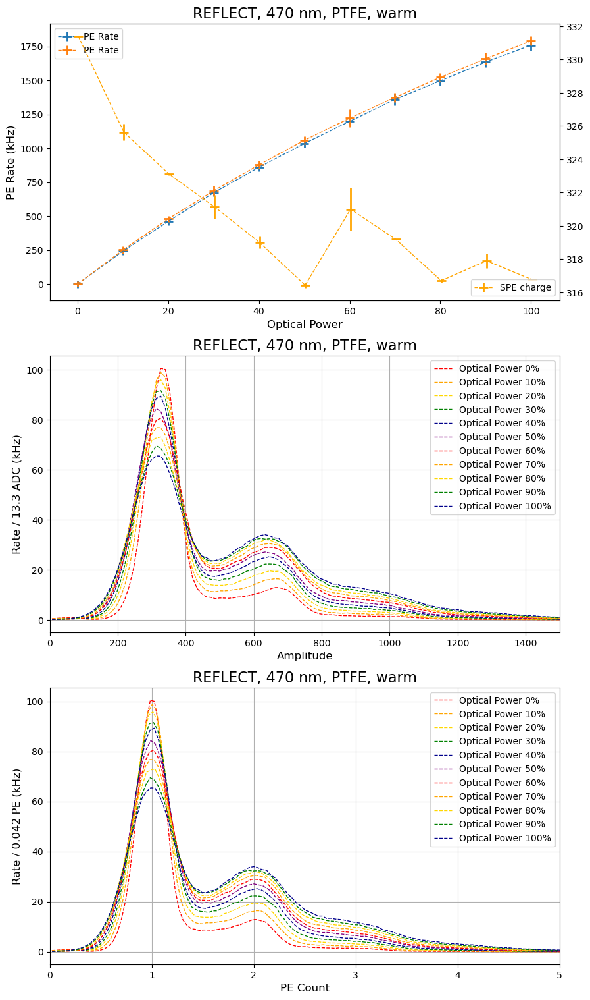

In [69]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLar.0.1_results_warm_470_empty.npz", allow_pickle=True)
material = "PTFE"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_21_warm_empty_470 = result_dict['optical_power']
labels_21_warm_empty_470 = ['Optical Power '+str(power)+'%' for power in optical_power_21_warm_empty_470]
SPE_charge_21_warm_empty_470 = result_dict['SPE_charge']
SPE_charge_uncertainty_21_warm_empty_470 = result_dict['SPE_charge_uncertainty']
PE_rate_21_warm_empty_470 = result_dict['PE_rate']
PE_rate_uncertainty_21_warm_empty_470 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_21_warm_empty_470 = result_dict['finger_plot_amplitude']
finger_plot_21_warm_empty_470 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_21_warm_empty_470"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_21_warm_empty_470)):
        optical_power_sorted[graphnum] = optical_power_21_warm_empty_470[np.argmin( abs(optical_power_21_warm_empty_470-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_21_warm_empty_470[np.argmin( abs(optical_power_21_warm_empty_470-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_21_warm_empty_470[np.argmin( abs(optical_power_21_warm_empty_470-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_21_warm_empty_470[np.argmin( abs(optical_power_21_warm_empty_470-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_21_warm_empty_470[np.argmin( abs(optical_power_21_warm_empty_470-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_21_warm_empty_470, finger_plot_21_warm_empty_470[np.argmin( abs(optical_power_21_warm_empty_470-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_21_warm_empty_470[np.argmin( abs(optical_power_21_warm_empty_470-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_21_warm_empty_470/SPE_charge_sorted[graphnum], finger_plot_21_warm_empty_470[np.argmin( abs(optical_power_21_warm_empty_470-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_21_warm_empty_470[np.argmin( abs(optical_power_21_warm_empty_470-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_21_warm_empty_470 = 1*optical_power_sorted
SPE_charge_21_warm_empty_470 = 1*SPE_charge_sorted
SPE_charge_uncertainty_21_warm_empty_470 = 1*SPE_charge_uncertainty_sorted
PE_rate_21_warm_empty_470 = 1*PE_rate_sorted
PE_rate_uncertainty_21_warm_empty_470 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_empty_470, PE_rate_run0_warm_empty_470-PE_rate_run0_warm_empty_470[0], xerr=[1]*len(optical_power_run0_warm_empty_470), yerr=PE_rate_uncertainty_run0_warm_empty_470*10,
           fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    ax[0].errorbar(optical_power_21_warm_empty_470, (PE_rate_21_warm_empty_470-PE_rate_21_warm_empty_470[0])/np.mean(SPE_charge_21_warm_empty_470)*np.mean(SPE_charge_run0_warm_empty_470), xerr=[1]*len(optical_power_21_warm_empty_470), yerr=PE_rate_uncertainty_21_warm_empty_470*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_21_warm_empty_470+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_21_warm_empty_470), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


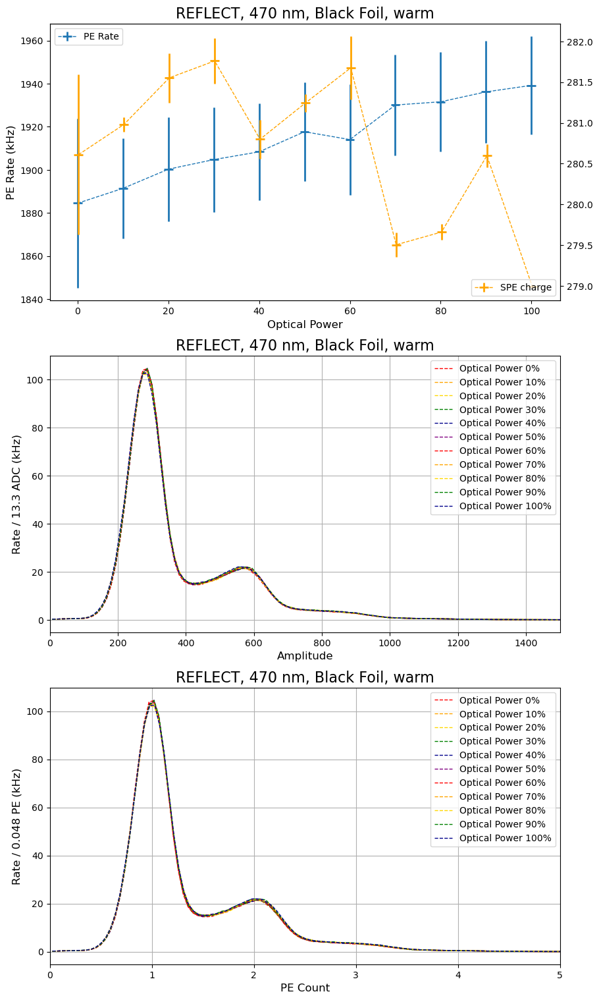

In [26]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_470_black.npz", allow_pickle=True)
material = "Black Foil"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_black_470 = result_dict['optical_power']
labels_run0_warm_black_470 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_black_470]
SPE_charge_run0_warm_black_470 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_black_470 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_black_470 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_black_470 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_black_470 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_black_470 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_black_470"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_black_470)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_black_470[np.argmin( abs(optical_power_run0_warm_black_470-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_black_470[np.argmin( abs(optical_power_run0_warm_black_470-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_black_470[np.argmin( abs(optical_power_run0_warm_black_470-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_black_470[np.argmin( abs(optical_power_run0_warm_black_470-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_black_470[np.argmin( abs(optical_power_run0_warm_black_470-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_black_470, finger_plot_run0_warm_black_470[np.argmin( abs(optical_power_run0_warm_black_470-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_black_470[np.argmin( abs(optical_power_run0_warm_black_470-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_black_470/SPE_charge_sorted[graphnum], finger_plot_run0_warm_black_470[np.argmin( abs(optical_power_run0_warm_black_470-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_black_470[np.argmin( abs(optical_power_run0_warm_black_470-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_black_470 = 1*optical_power_sorted
SPE_charge_run0_warm_black_470 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_black_470 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_black_470 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_black_470 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_black_470, PE_rate_run0_warm_black_470, xerr=[1]*len(optical_power_run0_warm_black_470), yerr=PE_rate_uncertainty_run0_warm_black_470*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_black_470+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_black_470), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


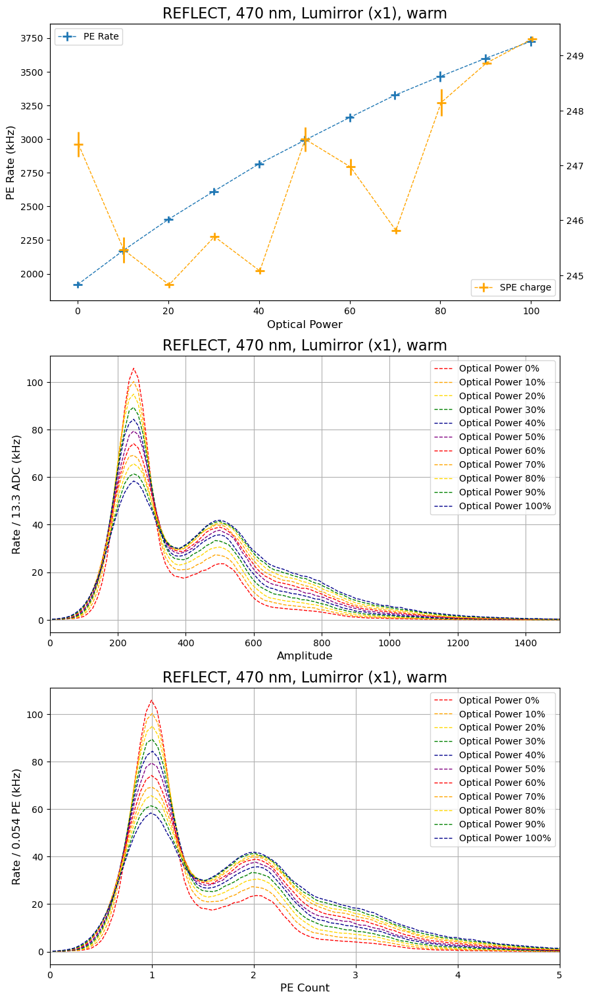

In [27]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_470_lum1.npz", allow_pickle=True)
material = "Lumirror (x1)"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_lum1_470 = result_dict['optical_power']
labels_run0_warm_lum1_470 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_lum1_470]
SPE_charge_run0_warm_lum1_470 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_lum1_470 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_lum1_470 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_lum1_470 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_lum1_470 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_lum1_470 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_lum1_470"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_lum1_470)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_lum1_470[np.argmin( abs(optical_power_run0_warm_lum1_470-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_lum1_470[np.argmin( abs(optical_power_run0_warm_lum1_470-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_lum1_470[np.argmin( abs(optical_power_run0_warm_lum1_470-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_lum1_470[np.argmin( abs(optical_power_run0_warm_lum1_470-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_lum1_470[np.argmin( abs(optical_power_run0_warm_lum1_470-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_lum1_470, finger_plot_run0_warm_lum1_470[np.argmin( abs(optical_power_run0_warm_lum1_470-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_lum1_470[np.argmin( abs(optical_power_run0_warm_lum1_470-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_lum1_470/SPE_charge_sorted[graphnum], finger_plot_run0_warm_lum1_470[np.argmin( abs(optical_power_run0_warm_lum1_470-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_lum1_470[np.argmin( abs(optical_power_run0_warm_lum1_470-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_lum1_470 = 1*optical_power_sorted
SPE_charge_run0_warm_lum1_470 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_lum1_470 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_lum1_470 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_lum1_470 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_lum1_470, PE_rate_run0_warm_lum1_470, xerr=[1]*len(optical_power_run0_warm_lum1_470), yerr=PE_rate_uncertainty_run0_warm_lum1_470*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_lum1_470+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_lum1_470), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


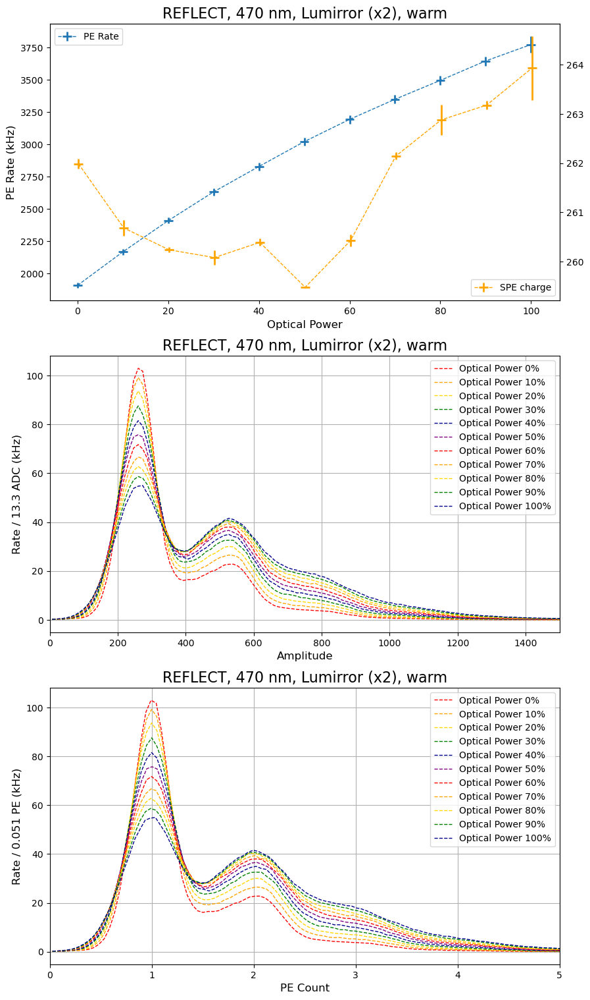

In [28]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_470_lum2.npz", allow_pickle=True)
material = "Lumirror (x2)"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_lum2_470 = result_dict['optical_power']
labels_run0_warm_lum2_470 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_lum2_470]
SPE_charge_run0_warm_lum2_470 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_lum2_470 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_lum2_470 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_lum2_470 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_lum2_470 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_lum2_470 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_lum2_470"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_lum2_470)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_lum2_470[np.argmin( abs(optical_power_run0_warm_lum2_470-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_lum2_470[np.argmin( abs(optical_power_run0_warm_lum2_470-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_lum2_470[np.argmin( abs(optical_power_run0_warm_lum2_470-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_lum2_470[np.argmin( abs(optical_power_run0_warm_lum2_470-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_lum2_470[np.argmin( abs(optical_power_run0_warm_lum2_470-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_lum2_470, finger_plot_run0_warm_lum2_470[np.argmin( abs(optical_power_run0_warm_lum2_470-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_lum2_470[np.argmin( abs(optical_power_run0_warm_lum2_470-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_lum2_470/SPE_charge_sorted[graphnum], finger_plot_run0_warm_lum2_470[np.argmin( abs(optical_power_run0_warm_lum2_470-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_lum2_470[np.argmin( abs(optical_power_run0_warm_lum2_470-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_lum2_470 = 1*optical_power_sorted
SPE_charge_run0_warm_lum2_470 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_lum2_470 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_lum2_470 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_lum2_470 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_lum2_470, PE_rate_run0_warm_lum2_470, xerr=[1]*len(optical_power_run0_warm_lum2_470), yerr=PE_rate_uncertainty_run0_warm_lum2_470*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_lum2_470+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_lum2_470), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


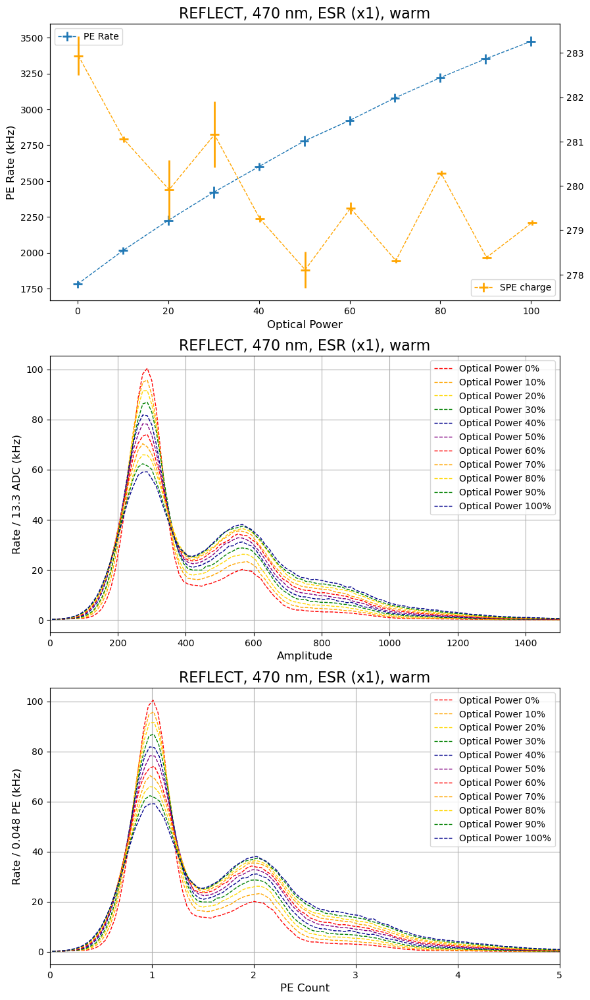

In [29]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_470_esr1.npz", allow_pickle=True)
material = "ESR (x1)"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_esr1_470 = result_dict['optical_power']
labels_run0_warm_esr1_470 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_esr1_470]
SPE_charge_run0_warm_esr1_470 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_esr1_470 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_esr1_470 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_esr1_470 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_esr1_470 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_esr1_470 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_esr1_470"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_esr1_470)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_esr1_470[np.argmin( abs(optical_power_run0_warm_esr1_470-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_esr1_470[np.argmin( abs(optical_power_run0_warm_esr1_470-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_esr1_470[np.argmin( abs(optical_power_run0_warm_esr1_470-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_esr1_470[np.argmin( abs(optical_power_run0_warm_esr1_470-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_esr1_470[np.argmin( abs(optical_power_run0_warm_esr1_470-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_esr1_470, finger_plot_run0_warm_esr1_470[np.argmin( abs(optical_power_run0_warm_esr1_470-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_esr1_470[np.argmin( abs(optical_power_run0_warm_esr1_470-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_esr1_470/SPE_charge_sorted[graphnum], finger_plot_run0_warm_esr1_470[np.argmin( abs(optical_power_run0_warm_esr1_470-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_esr1_470[np.argmin( abs(optical_power_run0_warm_esr1_470-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_esr1_470 = 1*optical_power_sorted
SPE_charge_run0_warm_esr1_470 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_esr1_470 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_esr1_470 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_esr1_470 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_esr1_470, PE_rate_run0_warm_esr1_470, xerr=[1]*len(optical_power_run0_warm_esr1_470), yerr=PE_rate_uncertainty_run0_warm_esr1_470*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_esr1_470+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_esr1_470), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


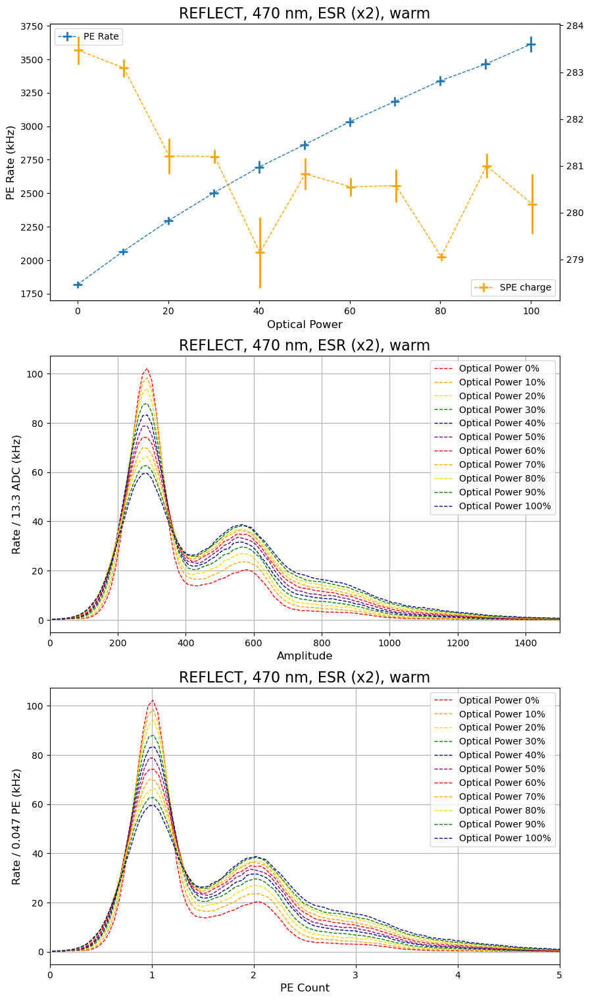

In [30]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_470_esr2.npz", allow_pickle=True)
material = "ESR (x2)"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_esr2_470 = result_dict['optical_power']
labels_run0_warm_esr2_470 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_esr2_470]
SPE_charge_run0_warm_esr2_470 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_esr2_470 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_esr2_470 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_esr2_470 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_esr2_470 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_esr2_470 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_esr2_470"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_esr2_470)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_esr2_470[np.argmin( abs(optical_power_run0_warm_esr2_470-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_esr2_470[np.argmin( abs(optical_power_run0_warm_esr2_470-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_esr2_470[np.argmin( abs(optical_power_run0_warm_esr2_470-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_esr2_470[np.argmin( abs(optical_power_run0_warm_esr2_470-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_esr2_470[np.argmin( abs(optical_power_run0_warm_esr2_470-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_esr2_470, finger_plot_run0_warm_esr2_470[np.argmin( abs(optical_power_run0_warm_esr2_470-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_esr2_470[np.argmin( abs(optical_power_run0_warm_esr2_470-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_esr2_470/SPE_charge_sorted[graphnum], finger_plot_run0_warm_esr2_470[np.argmin( abs(optical_power_run0_warm_esr2_470-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_esr2_470[np.argmin( abs(optical_power_run0_warm_esr2_470-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_esr2_470 = 1*optical_power_sorted
SPE_charge_run0_warm_esr2_470 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_esr2_470 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_esr2_470 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_esr2_470 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_esr2_470, PE_rate_run0_warm_esr2_470, xerr=[1]*len(optical_power_run0_warm_esr2_470), yerr=PE_rate_uncertainty_run0_warm_esr2_470*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_esr2_470+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_esr2_470), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


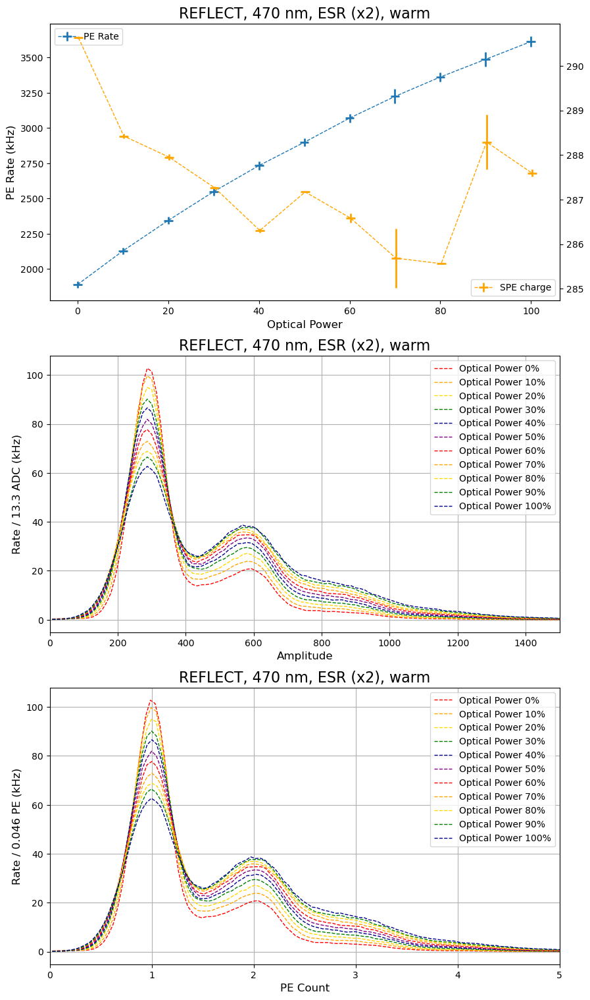

In [31]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_470_tyv1.npz", allow_pickle=True)
material = "ESR (x2)"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_tyv1_470 = result_dict['optical_power']
labels_run0_warm_tyv1_470 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_tyv1_470]
SPE_charge_run0_warm_tyv1_470 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_tyv1_470 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_tyv1_470 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_tyv1_470 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_tyv1_470 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_tyv1_470 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_tyv1_470"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_tyv1_470)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_tyv1_470[np.argmin( abs(optical_power_run0_warm_tyv1_470-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_tyv1_470[np.argmin( abs(optical_power_run0_warm_tyv1_470-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_tyv1_470[np.argmin( abs(optical_power_run0_warm_tyv1_470-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_tyv1_470[np.argmin( abs(optical_power_run0_warm_tyv1_470-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_tyv1_470[np.argmin( abs(optical_power_run0_warm_tyv1_470-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_tyv1_470, finger_plot_run0_warm_tyv1_470[np.argmin( abs(optical_power_run0_warm_tyv1_470-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_tyv1_470[np.argmin( abs(optical_power_run0_warm_tyv1_470-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_tyv1_470/SPE_charge_sorted[graphnum], finger_plot_run0_warm_tyv1_470[np.argmin( abs(optical_power_run0_warm_tyv1_470-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_tyv1_470[np.argmin( abs(optical_power_run0_warm_tyv1_470-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_tyv1_470 = 1*optical_power_sorted
SPE_charge_run0_warm_tyv1_470 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_tyv1_470 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_tyv1_470 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_tyv1_470 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_tyv1_470, PE_rate_run0_warm_tyv1_470, xerr=[1]*len(optical_power_run0_warm_tyv1_470), yerr=PE_rate_uncertainty_run0_warm_tyv1_470*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_tyv1_470+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_tyv1_470), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


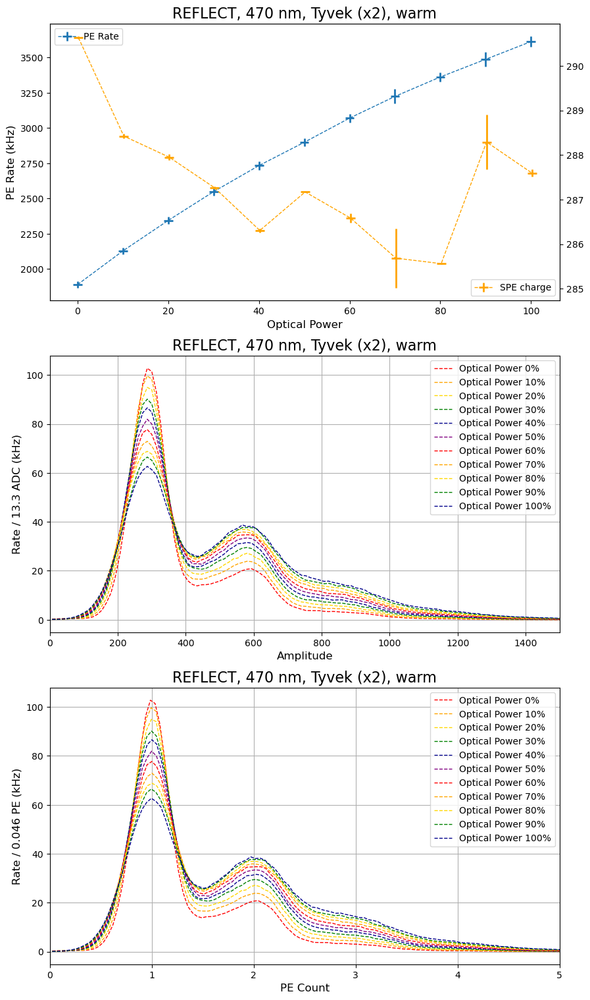

In [33]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_470_tyv1.npz", allow_pickle=True)
material = "Tyvek (x2)"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_tyv1_470 = result_dict['optical_power']
labels_run0_warm_tyv1_470 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_tyv1_470]
SPE_charge_run0_warm_tyv1_470 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_tyv1_470 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_tyv1_470 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_tyv1_470 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_tyv1_470 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_tyv1_470 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_tyv1_470"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_tyv1_470)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_tyv1_470[np.argmin( abs(optical_power_run0_warm_tyv1_470-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_tyv1_470[np.argmin( abs(optical_power_run0_warm_tyv1_470-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_tyv1_470[np.argmin( abs(optical_power_run0_warm_tyv1_470-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_tyv1_470[np.argmin( abs(optical_power_run0_warm_tyv1_470-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_tyv1_470[np.argmin( abs(optical_power_run0_warm_tyv1_470-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_tyv1_470, finger_plot_run0_warm_tyv1_470[np.argmin( abs(optical_power_run0_warm_tyv1_470-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_tyv1_470[np.argmin( abs(optical_power_run0_warm_tyv1_470-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_tyv1_470/SPE_charge_sorted[graphnum], finger_plot_run0_warm_tyv1_470[np.argmin( abs(optical_power_run0_warm_tyv1_470-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_tyv1_470[np.argmin( abs(optical_power_run0_warm_tyv1_470-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_tyv1_470 = 1*optical_power_sorted
SPE_charge_run0_warm_tyv1_470 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_tyv1_470 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_tyv1_470 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_tyv1_470 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_tyv1_470, PE_rate_run0_warm_tyv1_470, xerr=[1]*len(optical_power_run0_warm_tyv1_470), yerr=PE_rate_uncertainty_run0_warm_tyv1_470*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_tyv1_470+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_tyv1_470), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()

file loaded with the following keys: ['optical_power', 'SPE_charge', 'SPE_charge_uncertainty', 'PE_rate', 'PE_rate_uncertainty', 'finger_plot_amplitude', 'finger_plot']


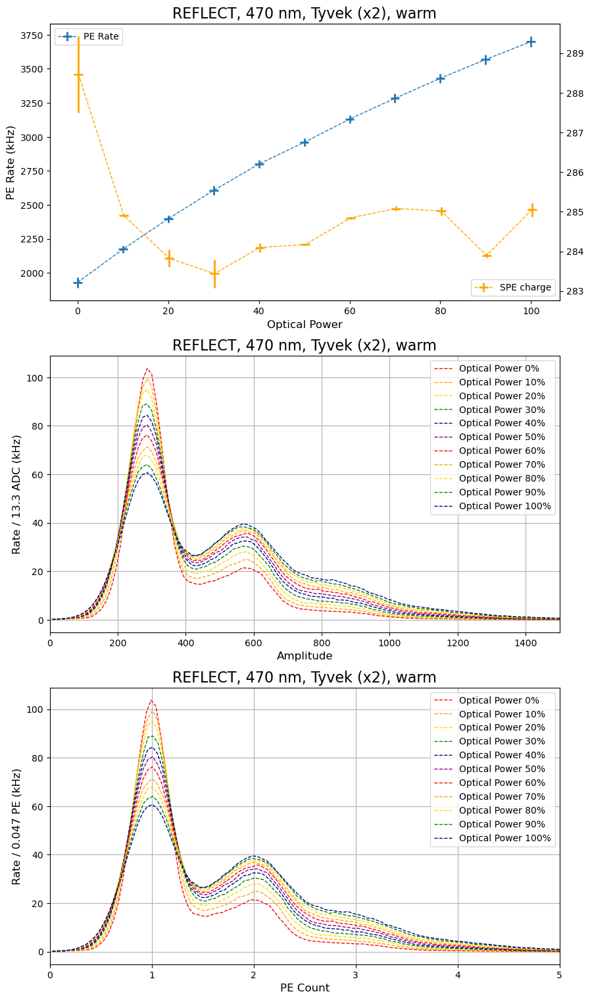

In [32]:
tic()
inputfile=np.load("../../REFLECT/runLar.0/runLAr.0_results_warm_470_tyv2.npz", allow_pickle=True)
material = "Tyvek (x2)"
verbose = True
result_dict = {key: inputfile[key] for key in inputfile.keys()}
if verbose: print(f"file loaded with the following keys: {[key for key in result_dict.keys()]}")

optical_power_run0_warm_tyv2_470 = result_dict['optical_power']
labels_run0_warm_tyv2_470 = ['Optical Power '+str(power)+'%' for power in optical_power_run0_warm_tyv2_470]
SPE_charge_run0_warm_tyv2_470 = result_dict['SPE_charge']
SPE_charge_uncertainty_run0_warm_tyv2_470 = result_dict['SPE_charge_uncertainty']
PE_rate_run0_warm_tyv2_470 = result_dict['PE_rate']
PE_rate_uncertainty_run0_warm_tyv2_470 = result_dict['PE_rate_uncertainty']
finger_plot_amplitude_run0_warm_tyv2_470 = result_dict['finger_plot_amplitude']
finger_plot_run0_warm_tyv2_470 = result_dict['finger_plot']

optical_power_sorted = np.ones(11)*-666
SPE_charge_sorted = np.ones(11)*-666
SPE_charge_uncertainty_sorted = np.ones(11)*-666
PE_rate_sorted = np.ones(11)*-666
PE_rate_uncertainty_sorted = np.ones(11)*-666

if (verbose): 
    #for key in result_dict.keys():
        #print(f"{key}: ", eval(f"{key}_run0_warm_tyv2_470"))
    plt.close()
    figwidth = 10
    fig,ax = plt.subplots(3,1,figsize=(figwidth,figwidth*3*2/(1+np.sqrt(5)) ))

    ax[0].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[0].set_xlabel("Optical Power", size=12)
    ax[0].set_ylabel("PE Rate (kHz)", size=12)
    
    myrainbow = ["red", "orange", "gold", "green", "darkblue", "purple"]
    ax[1].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[1].set_xlabel("Amplitude", size=12)
    ax[1].set_ylabel(f"Rate / {40/3:.1f} ADC (kHz)", size=12)
    ax[2].set_title(f"REFLECT, 470 nm, {material}, warm", size=16)
    ax[2].set_xlabel("PE Count", size=12)
    
    
    for graphnum in range(len(finger_plot_run0_warm_tyv2_470)):
        optical_power_sorted[graphnum] = optical_power_run0_warm_tyv2_470[np.argmin( abs(optical_power_run0_warm_tyv2_470-graphnum*10) )]
        SPE_charge_sorted[graphnum] = SPE_charge_run0_warm_tyv2_470[np.argmin( abs(optical_power_run0_warm_tyv2_470-graphnum*10) )]
        SPE_charge_uncertainty_sorted[graphnum] = SPE_charge_uncertainty_run0_warm_tyv2_470[np.argmin( abs(optical_power_run0_warm_tyv2_470-graphnum*10) )]
        PE_rate_sorted[graphnum] = PE_rate_run0_warm_tyv2_470[np.argmin( abs(optical_power_run0_warm_tyv2_470-graphnum*10) )]
        PE_rate_uncertainty_sorted[graphnum] = PE_rate_uncertainty_run0_warm_tyv2_470[np.argmin( abs(optical_power_run0_warm_tyv2_470-graphnum*10) )]
        
    
        ax[1].errorbar(finger_plot_amplitude_run0_warm_tyv2_470, finger_plot_run0_warm_tyv2_470[np.argmin( abs(optical_power_run0_warm_tyv2_470-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_tyv2_470[np.argmin( abs(optical_power_run0_warm_tyv2_470-graphnum*10) )], color=myrainbow[graphnum%6])
        ax[2].errorbar(finger_plot_amplitude_run0_warm_tyv2_470/SPE_charge_sorted[graphnum], finger_plot_run0_warm_tyv2_470[np.argmin( abs(optical_power_run0_warm_tyv2_470-graphnum*10) )], #yerr=DarkWarmData[:,2]*2,
                    fmt='--', linewidth=1, elinewidth=2, label=labels_run0_warm_tyv2_470[np.argmin( abs(optical_power_run0_warm_tyv2_470-graphnum*10) )], color=myrainbow[graphnum%6])

    ax[1].legend(loc='upper right')
    ax[1].set_xlim(0,1500)
    ax[1].grid()
    ax[2].set_ylabel(f"Rate / {40/3/np.mean(SPE_charge_sorted):.3f} PE (kHz)", size=12)
    ax[2].legend(loc='upper right')
    ax[2].set_xlim(0,5)
    ax[2].grid()
    
PE_rate_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_uncertainty_sorted)
SPE_charge_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_sorted)
SPE_charge_uncertainty_sorted = np.where(PE_rate_sorted<0,float("nan"),SPE_charge_uncertainty_sorted)
PE_rate_sorted = np.where(PE_rate_sorted<0,float("nan"),PE_rate_sorted)

optical_power_run0_warm_tyv2_470 = 1*optical_power_sorted
SPE_charge_run0_warm_tyv2_470 = 1*SPE_charge_sorted
SPE_charge_uncertainty_run0_warm_tyv2_470 = 1*SPE_charge_uncertainty_sorted
PE_rate_run0_warm_tyv2_470 = 1*PE_rate_sorted
PE_rate_uncertainty_run0_warm_tyv2_470 = 1*PE_rate_uncertainty_sorted
    
if (verbose):
    ax[0].errorbar(optical_power_run0_warm_tyv2_470, PE_rate_run0_warm_tyv2_470, xerr=[1]*len(optical_power_run0_warm_tyv2_470), yerr=PE_rate_uncertainty_run0_warm_tyv2_470*10,
                fmt="--",linewidth=1, elinewidth=2,label="PE Rate")
    axtwin = ax[0].twinx()
    axtwin.errorbar(optical_power_run0_warm_tyv2_470+0.2, SPE_charge_sorted, xerr=[1]*len(optical_power_run0_warm_tyv2_470), yerr=SPE_charge_uncertainty_sorted*1,
                fmt="--",linewidth=1, elinewidth=2,color="orange",label="SPE charge")

    ax[0].legend(loc='upper left')
    axtwin.legend(loc='lower right')
    #ax.set_xlim(0,1000)

    plt.show()